In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings
warnings.simplefilter("ignore")
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score

# **DATA** **PREPARE**

# Load Dataset

In [ ]:
#df.columns
# Môn học - Học kỳ - Lớp - Năm Học
df = pd.read_csv("/content/drive/MyDrive/NCKH_Review of Student's Performance/Data/dfGrade_without12th.csv", index_col=0) #tải lên data từ gg drive
df #hiển thị data

,Maths_1_10_19_20,Literature_1_10_19_20,Physics_1_10_19_20,Chemistry_1_10_19_20,Biology_1_10_19_20,History_1_10_19_20,Geography_1_10_19_20,English_1_10_19_20,Maths_2_10_19_20,Literature_2_10_19_20,...,English_2_11_20_21,Maths,Literature,Physics,Chemistry,Biology,History,Geography,English,Final grade
0,5.3,6.1,5.6,6.7,6.8,4.7,7.5,7.4,5.6,6.6,...,8.4,7.4,7.6,6.8,7.4,7.9,7.5,9.1,8.0,8.2
1,8.6,7.3,8.3,8.5,8.3,7.6,8.1,8.4,9.1,8.2,...,8.9,9.0,7.4,8.6,8.5,7.6,8.1,8.6,8.9,8.6
2,5.5,6.1,6.5,6.1,5.5,5.6,7.8,5.2,6.0,6.0,...,7.3,7.6,6.8,8.0,8.3,7.0,6.8,8.1,7.6,8.0
3,5.2,7.2,5.7,5.6,4.4,5.7,7.3,6.5,5.5,6.3,...,7.9,9.0,7.9,8.3,8.6,7.8,7.7,8.8,8.7,8.6
4,5.8,6.3,5.3,4.8,6.1,6.5,7.0,4.8,6.3,6.7,...,5.9,7.6,7.2,6.1,7.3,7.1,7.2,8.4,6.3,7.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,4.5,5.5,6.3,6.0,5.6,4.3,6.6,5.8,4.9,5.9,...,6.9,8.2,6.8,6.8,7.9,7.6,6.2,8.7,6.8,7.9
472,6.8,7.3,8.9,8.7,8.0,7.6,8.6,8.3,8.5,7.9,...,9.1,8.7,7.6,9.6,8.7,8.2,8.5,8.7,9.1,9.0
473,4.5,5.2,4.9,5.4,4.1,4.1,4.6,4.8,4.4,6.1,...,7.1,6.7,5.8,6.2,6.5,6.4,6.8,7.7,5.5,7.0
474,6.3,7.9,7.6,8.3,7.3,8.1,8.1,6.8,5.8,8.6,...,9.0,7.1,8.1,7.2,7.4,7.0,8.6,8.9,7.2,8.3


In [ ]:
df.columns #hiển thị tên các cột - không quan trọng

Index(['Maths_1_10_19_20', 'Literature_1_10_19_20', 'Physics_1_10_19_20',
       'Chemistry_1_10_19_20', 'Biology_1_10_19_20', 'History_1_10_19_20',
       'Geography_1_10_19_20', 'English_1_10_19_20', 'Maths_2_10_19_20',
       'Literature_2_10_19_20', 'Physics_2_10_19_20', 'Chemistry_2_10_19_20',
       'Biology_2_10_19_20', 'History_2_10_19_20', 'Geography_2_10_19_20',
       'English_2_10_19_20', 'Maths_1_11_20_21', 'Literature_1_11_20_21',
       'Physics_1_11_20_21', 'Chemistry_1_11_20_21', 'Biology_1_11_20_21',
       'History_1_11_20_21', 'Geography_1_11_20_21', 'English_1_11_20_21',
       'Maths_2_11_20_21', 'Literature_2_11_20_21', 'Physics_2_11_20_21',
       'Chemistry_2_11_20_21', 'Biology_2_11_20_21', 'History_2_11_20_21',
       'Geography_2_11_20_21', 'English_2_11_20_21', 'Maths', 'Literature',
       'Physics', 'Chemistry', 'Biology', 'History', 'Geography', 'English',
       'Final grade'],
      dtype='object')

In [ ]:
df.shape #kích thước data: 476 hàng - 41 cột

(476, 41)

# Split Dataset

In [ ]:
#phân chia data thành tập huấn luyện với kích thước (80% dataset) và tập kiểm tra (20%)
split = 0.8
train = df.drop(columns=['Maths','Literature', 'Physics', 'Chemistry', 'Biology', 'History', 'Geography','English', 'Final grade']) #lấy dữ liệu để dùng làm X, chỉ lấy điểm của 4 học kỳ, df.drop nghĩa là sẽ bỏ các cột được liệt kê
#những cột bị drop ở bên trên sẽ được gán riêng như bên dưới và dùng làm Y
Grade = df["Final grade"]
Maths = df["Maths"]
Literature = df["Literature"]
Physics = df["Physics"]
Chemistry = df["Chemistry"]
Biology = df["Biology"]
History = df["History"]
Geography = df["Geography"]
English = df["English"]

xtrain, xtest = train[:(int)(len(df) * split)], train[(int)(len(df) * split):] #lấy 80% (*split = *0.8) của biến train bên trên gán cho xtrain, 20% còn lại gán cho xtest

ytrainGrade, ytestGrade = Grade[:(int)(len(df) * split)], Grade[(int)(len(df) * split):].to_numpy() #lấy 80%-20% theo Y của từng môn
ytrainMaths, ytestMaths = Maths[:(int)(len(df) * split)], Maths[(int)(len(df) * split):].to_numpy()
ytrainLiterature, ytestLiterature = Literature[:(int)(len(df) * split)], Literature[(int)(len(df) * split):].to_numpy()
ytrainPhysics, ytestPhysics = Physics[:(int)(len(df) * split)], Physics[(int)(len(df) * split):].to_numpy()
ytrainChemistry, ytestChemistry = Chemistry[:(int)(len(df) * split)], Chemistry[(int)(len(df) * split):].to_numpy()
ytrainBiology, ytestBiology = Biology[:(int)(len(df) * split)], Biology[(int)(len(df) * split):].to_numpy()
ytrainHistory, ytestHistory = History[:(int)(len(df) * split)], History[(int)(len(df) * split):].to_numpy()
ytrainGeography, ytestGeography = Geography[:(int)(len(df) * split)], Geography[(int)(len(df) * split):].to_numpy()
ytrainEnglish, ytestEnglish = English[:(int)(len(df) * split)], English[(int)(len(df) * split):].to_numpy()

ytest = [ytestGrade, ytestMaths, ytestLiterature, ytestPhysics, ytestChemistry, ytestBiology, ytestHistory, ytestGeography, ytestEnglish]

xtrain.shape, ytrainGrade.shape, xtest.shape, ytestGrade.shape

((380, 32), (380,), (96, 32), (96,))

In [ ]:
train

,Maths_1_10_19_20,Literature_1_10_19_20,Physics_1_10_19_20,Chemistry_1_10_19_20,Biology_1_10_19_20,History_1_10_19_20,Geography_1_10_19_20,English_1_10_19_20,Maths_2_10_19_20,Literature_2_10_19_20,...,Geography_1_11_20_21,English_1_11_20_21,Maths_2_11_20_21,Literature_2_11_20_21,Physics_2_11_20_21,Chemistry_2_11_20_21,Biology_2_11_20_21,History_2_11_20_21,Geography_2_11_20_21,English_2_11_20_21
0,5.3,6.1,5.6,6.7,6.8,4.7,7.5,7.4,5.6,6.6,...,7.2,8.9,5.2,7.5,7.4,6.2,7.5,7.0,8.5,8.4
1,8.6,7.3,8.3,8.5,8.3,7.6,8.1,8.4,9.1,8.2,...,9.1,8.9,8.1,7.3,9.3,9.6,9.1,8.0,8.3,8.9
2,5.5,6.1,6.5,6.1,5.5,5.6,7.8,5.2,6.0,6.0,...,9.1,7.2,7.2,7.1,7.3,8.9,8.0,8.8,7.6,7.3
3,5.2,7.2,5.7,5.6,4.4,5.7,7.3,6.5,5.5,6.3,...,8.6,7.8,8.4,7.7,8.3,8.1,7.8,6.6,8.4,7.9
4,5.8,6.3,5.3,4.8,6.1,6.5,7.0,4.8,6.3,6.7,...,8.7,5.5,6.7,6.4,6.2,7.2,8.1,7.9,7.9,5.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,4.5,5.5,6.3,6.0,5.6,4.3,6.6,5.8,4.9,5.9,...,7.1,6.4,5.3,6.4,6.8,9.6,8.0,5.9,7.7,6.9
472,6.8,7.3,8.9,8.7,8.0,7.6,8.6,8.3,8.5,7.9,...,9.1,9.3,8.0,7.8,9.7,8.3,9.3,7.7,8.6,9.1
473,4.5,5.2,4.9,5.4,4.1,4.1,4.6,4.8,4.4,6.1,...,4.9,5.8,4.0,5.6,6.1,5.6,5.4,4.6,5.3,7.1
474,6.3,7.9,7.6,8.3,7.3,8.1,8.1,6.8,5.8,8.6,...,9.3,7.9,5.5,8.1,8.6,7.6,9.2,8.7,9.0,9.0


# Function

In [ ]:
def draw(result): #hàm vẽ biểu đồ - không quan trọng
  plt.figure(figsize=(25, 15))
  plt.grid(True)
  plt.subplot(3, 3, 1)
  plt.title('Maths')
  plt.plot(result['Maths_pred'],'blue', label='Pred')
  plt.plot(result['Maths'],'red', label='Actual')
  plt.subplot(3, 3, 2)
  plt.title('Literature')
  plt.plot(result['Literature_pred'],'blue', label='Pred')
  plt.plot(result['Literature'],'red', label='Actual')
  plt.subplot(3, 3, 3)
  plt.title('Physics')
  plt.plot(result['Physics_pred'],'blue', label='Pred')
  plt.plot(result['Physics'],'red', label='Actual')
  plt.subplot(3, 3, 4)
  plt.title('Chemistry')
  plt.plot(result['Chemistry_pred'],'blue', label='Pred')
  plt.plot(result['Chemistry'],'red', label='Actual')
  plt.subplot(3, 3, 5)
  plt.title('Biology')
  plt.plot(result['Biology_pred'],'blue', label='Pred')
  plt.plot(result['Biology'],'red', label='Actual')
  plt.subplot(3, 3, 6)
  plt.title('History')
  plt.plot(result['History_pred'],'blue', label='Pred')
  plt.plot(result['History'],'red', label='Actual')
  plt.subplot(3, 3, 7)
  plt.title('Geography')
  plt.plot(result['Geography_pred'],'blue', label='Pred')
  plt.plot(result['Geography'],'red', label='Actual')
  plt.subplot(3, 3, 8)
  plt.title('English')
  plt.plot(result['English_pred'],'blue', label='Pred')
  plt.plot(result['English'],'red', label='Actual')
  plt.subplot(3, 3, 9)
  plt.title('Final Grade')
  plt.plot(result['Grade_pred'],'blue', label='Pred')
  plt.plot(result['Grade'],'red', label='Actual')
  plt.legend()

In [ ]:
def err(subject, actual, pred): #mae,mape,mse,rmse là các hàm mất mát (loss function), ở đây có tác dụng như công thức để tính toán độ chính xác cho hàm Accuracy bên dưới
  mae = mean_absolute_error(actual, pred)
  mape = mean_absolute_percentage_error(actual, pred)
  mse = mean_squared_error(actual, pred)
  rmse = np.sqrt(mse)
  res = {'Subject': subject,'MAE': mae, 'MAPE (%)': mape*100, 'MSE': mse, 'RMSE': rmse, 'Accuracy (%)': 100 - mape*100}
  return res

In [ ]:
def Accuracy(result): #tính toán độ chính xác cho các mô hình học máy với dữ liệu đầu vào nhận từ hàm result bên dưới và tính toán bằng cách sử dụng các loss function ở hàm err bên trên như một công thức
    Accuracy = pd.DataFrame(columns=['Subject', 'MAE', 'MAPE (%)', 'MSE', 'RMSE', 'Accuracy (%)'])
    data = []
    data.append(err('Maths', result['Maths'], result['Maths_pred'])) #gọi hàm err để tính toán độ chính xác với tham số đầu vào là kết quả thực (Math) và kết quả model dự đoán được (Maths_pred)
    data.append(err('Literature', result['Literature'], result['Literature_pred']))
    data.append(err('Physics', result['Physics'], result['Physics_pred']))
    data.append(err('Chemistry', result['Chemistry'], result['Chemistry_pred']))
    data.append(err('Biology', result['Biology'], result['Biology_pred']))
    data.append(err('History', result['History'], result['History_pred']))
    data.append(err('Geography', result['Geography'], result['Geography_pred']))
    data.append(err('English', result['English'], result['English_pred']))
    data.append(err('Grade', result['Grade'], result['Grade_pred']))

    dfs = [pd.DataFrame(d, index=[0]) for d in data]
    Accuracy = pd.concat(dfs, ignore_index=True) #Ghi các giá trị tính toán được vào biến Accuracy

    return Accuracy

In [ ]:
def ChonKhoi(pred): #hàm chọn khối dựa trên kết quả dự đoán
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/A01'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/B00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/C00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/D00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/A01/B00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/A01/C00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/A01/D00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/B00/C00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/B00/D00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/C00/D00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/A01/B00/C00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/A01/B00/D00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/B00/C00/D00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/A01/B00/C00/D00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] >  pred['B00']) & (pred['A01'] >  pred['C00']) & (pred['A01'] >  pred['D00']), 'Khối'] = 'A01'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] == pred['B00']) & (pred['A01'] >  pred['C00']) & (pred['A01'] >  pred['D00']), 'Khối'] = 'A01/B00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] >  pred['B00']) & (pred['A01'] == pred['C00']) & (pred['A01'] >  pred['D00']), 'Khối'] = 'A01/C00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] >  pred['B00']) & (pred['A01'] >  pred['C00']) & (pred['A01'] == pred['D00']), 'Khối'] = 'A01/D00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] == pred['B00']) & (pred['A01'] == pred['C00']) & (pred['A01'] >  pred['D00']), 'Khối'] = 'A01/B00/C00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] == pred['B00']) & (pred['A01'] >  pred['C00']) & (pred['A01'] == pred['D00']), 'Khối'] = 'A01/B00/D00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] >  pred['B00']) & (pred['A01'] == pred['C00']) & (pred['A01'] == pred['D00']), 'Khối'] = 'A01/C00/D00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] == pred['B00']) & (pred['A01'] == pred['C00']) & (pred['A01'] == pred['D00']), 'Khối'] = 'A01/B00/C00/C00'
  pred.loc[(pred['B00'] >  pred['A01']) & (pred['B00'] >  pred['A00']) & (pred['B00'] >  pred['C00']) & (pred['B00'] >  pred['D00']), 'Khối'] = 'B00'
  pred.loc[(pred['B00'] >  pred['A01']) & (pred['B00'] >  pred['A00']) & (pred['B00'] == pred['C00']) & (pred['B00'] >  pred['D00']), 'Khối'] = 'B00/C00'
  pred.loc[(pred['B00'] >  pred['A01']) & (pred['B00'] >  pred['A00']) & (pred['B00'] >  pred['C00']) & (pred['B00'] == pred['D00']), 'Khối'] = 'B00/D00'
  pred.loc[(pred['B00'] >  pred['A01']) & (pred['B00'] >  pred['A00']) & (pred['B00'] == pred['C00']) & (pred['B00'] == pred['D00']), 'Khối'] = 'B00/C00/D00'
  pred.loc[(pred['C00'] >  pred['A01']) & (pred['C00'] >  pred['B00']) & (pred['C00'] >  pred['A00']) & (pred['C00'] >  pred['D00']), 'Khối'] = 'C00'
  pred.loc[(pred['C00'] >  pred['A01']) & (pred['C00'] >  pred['B00']) & (pred['C00'] >  pred['A00']) & (pred['C00'] == pred['D00']), 'Khối'] = 'C00/D00'
  pred.loc[(pred['D00'] >  pred['A01']) & (pred['D00'] >  pred['B00']) & (pred['D00'] >  pred['C00']) & (pred['D00'] >  pred['A00']), 'Khối'] = 'D00'
  pred.loc[(pred['Tổng kết'] <  5), 'Học lực'] = 'Kém'
  pred.loc[(pred['Tổng kết'] >= 5), 'Học lực'] = 'Trung bình'
  pred.loc[(pred['Tổng kết'] >= 6), 'Học lực'] = 'Trung bình khá'
  pred.loc[(pred['Tổng kết'] >= 7), 'Học lực'] = 'Khá'
  pred.loc[(pred['Tổng kết'] >= 8), 'Học lực'] = 'Giỏi'
  pred.loc[(pred['Tổng kết'] >= 9), 'Học lực'] = 'Xuất sắc'
  return pred

In [ ]:
def ChonKhoiClf(pred):
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/A01'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/B00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/C00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/D00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/A01/B00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/A01/C00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/A01/D00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/B00/C00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/B00/D00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] >  pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/C00/D00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] >  pred['D00']), 'Khối'] = 'A00/A01/B00/C00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] >  pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/A01/B00/D00'
  pred.loc[(pred['A00'] >  pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/B00/C00/D00'
  pred.loc[(pred['A00'] == pred['A01']) & (pred['A00'] == pred['B00']) & (pred['A00'] == pred['C00']) & (pred['A00'] == pred['D00']), 'Khối'] = 'A00/A01/B00/C00/D00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] >  pred['B00']) & (pred['A01'] >  pred['C00']) & (pred['A01'] >  pred['D00']), 'Khối'] = 'A01'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] == pred['B00']) & (pred['A01'] >  pred['C00']) & (pred['A01'] >  pred['D00']), 'Khối'] = 'A01/B00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] >  pred['B00']) & (pred['A01'] == pred['C00']) & (pred['A01'] >  pred['D00']), 'Khối'] = 'A01/C00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] >  pred['B00']) & (pred['A01'] >  pred['C00']) & (pred['A01'] == pred['D00']), 'Khối'] = 'A01/D00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] == pred['B00']) & (pred['A01'] == pred['C00']) & (pred['A01'] >  pred['D00']), 'Khối'] = 'A01/B00/C00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] == pred['B00']) & (pred['A01'] >  pred['C00']) & (pred['A01'] == pred['D00']), 'Khối'] = 'A01/B00/D00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] >  pred['B00']) & (pred['A01'] == pred['C00']) & (pred['A01'] == pred['D00']), 'Khối'] = 'A01/C00/D00'
  pred.loc[(pred['A01'] >  pred['A00']) & (pred['A01'] == pred['B00']) & (pred['A01'] == pred['C00']) & (pred['A01'] == pred['D00']), 'Khối'] = 'A01/B00/C00/C00'
  pred.loc[(pred['B00'] >  pred['A01']) & (pred['B00'] >  pred['A00']) & (pred['B00'] >  pred['C00']) & (pred['B00'] >  pred['D00']), 'Khối'] = 'B00'
  pred.loc[(pred['B00'] >  pred['A01']) & (pred['B00'] >  pred['A00']) & (pred['B00'] == pred['C00']) & (pred['B00'] >  pred['D00']), 'Khối'] = 'B00/C00'
  pred.loc[(pred['B00'] >  pred['A01']) & (pred['B00'] >  pred['A00']) & (pred['B00'] >  pred['C00']) & (pred['B00'] == pred['D00']), 'Khối'] = 'B00/D00'
  pred.loc[(pred['B00'] >  pred['A01']) & (pred['B00'] >  pred['A00']) & (pred['B00'] == pred['C00']) & (pred['B00'] == pred['D00']), 'Khối'] = 'B00/C00/D00'
  pred.loc[(pred['C00'] >  pred['A01']) & (pred['C00'] >  pred['B00']) & (pred['C00'] >  pred['A00']) & (pred['C00'] >  pred['D00']), 'Khối'] = 'C00'
  pred.loc[(pred['C00'] >  pred['A01']) & (pred['C00'] >  pred['B00']) & (pred['C00'] >  pred['A00']) & (pred['C00'] == pred['D00']), 'Khối'] = 'C00/D00'
  pred.loc[(pred['D00'] >  pred['A01']) & (pred['D00'] >  pred['B00']) & (pred['D00'] >  pred['C00']) & (pred['D00'] >  pred['A00']), 'Khối'] = 'D00'
  return pred

In [ ]:
def predhandle(model, Test): #thực hiện dự đoán với: model (model được chỉ định), Test (điểm 4 học kỳ của 1 học sinh được chọn làm input), hàm này được sử dụng ở cell Final bên dưới
  ypredGrade = model[0].predict(Test).round(1)[0] #dùng model để dự đoán giá trị Grade(điểm tổng) với input là Test(điểm các môn) của học sinh được chỉ định
  ypredMaths = model[1].predict(Test).round(1)[0]
  ypredLiterature = model[2].predict(Test).round(1)[0]
  ypredPhysics = model[3].predict(Test).round(1)[0]
  ypredChemistry = model[4].predict(Test).round(1)[0]
  ypredBiology = model[5].predict(Test).round(1)[0]
  ypredHistory = model[6].predict(Test).round(1)[0]
  ypredGeography = model[7].predict(Test).round(1)[0]
  ypredEnglish = model[8].predict(Test).round(1)[0]

  predhandle = pd.DataFrame({
    'Toán': pd.Series(ypredMaths),
    'Văn': pd.Series(ypredLiterature),
    'Lý': pd.Series(ypredPhysics),
    'Hoá': pd.Series(ypredChemistry),
    'Sinh': pd.Series(ypredBiology),
    'Sử': pd.Series(ypredHistory),
    'Địa': pd.Series(ypredGeography),
    'Anh': pd.Series(ypredEnglish),
    'Tổng kết': pd.Series(ypredGrade
                          ),
    'A00': pd.Series(ypredMaths + ypredPhysics + ypredChemistry),
    'A01': pd.Series(ypredMaths + ypredPhysics + ypredEnglish),
    'B00': pd.Series(ypredMaths + ypredChemistry + ypredBiology),
    'C00': pd.Series(ypredHistory + ypredGeography + ypredLiterature),
    'D00': pd.Series(ypredMaths + ypredLiterature + ypredEnglish),
  })

  return ChonKhoi(predhandle)

In [ ]:
def predModel(ypred): #gán kết quả dự đoán cho từng môn
  pred = pd.DataFrame({
    'Toán': pd.Series(ypred[1]), #cột toán sẽ hiển thị điểm dự đoán của môn toán ,pd.Series(ypred[1]) = ypredMaths
    'Văn': pd.Series(ypred[2]),
    'Lý': pd.Series(ypred[3]),
    'Hoá': pd.Series(ypred[4]),
    'Sinh': pd.Series(ypred[5]),
    'Sử': pd.Series(ypred[6]),
    'Địa': pd.Series(ypred[7]),
    'Anh': pd.Series(ypred[8]),
    'Tổng kết': pd.Series(ypred[0]),
    'A00': pd.Series(ypred[1] + ypred[3] + ypred[4]).astype('float64').round(1),
    'A01': pd.Series(ypred[1] + ypred[3] + ypred[8]).astype('float64').round(1),
    'B00': pd.Series(ypred[1] + ypred[4] + ypred[5]).astype('float64').round(1),
    'C00': pd.Series(ypred[2] + ypred[6] + ypred[7]).astype('float64').round(1),
    'D00': pd.Series(ypred[1] + ypred[2] + ypred[8]).astype('float64').round(1),
  })
  pred = pred.astype('float64')
  return ChonKhoi(pred) #hiển thị dưới dạng bảng như trong hàm ChonKhoi

In [ ]:
def result(ytest, ypred): #sử dụng như một nơi để lưu kết quả thực tế và kết quả được dự đoán, sử dụng như input đầu vào cho hàm Accuracy
  result = pd.DataFrame({
    'Maths': pd.Series(ytest[1]),
    'Maths_pred': pd.Series(ypred[1]),
    'Literature': pd.Series(ytest[2]),
    'Literature_pred': pd.Series(ypred[2]),
    'Physics': pd.Series(ytest[3]),
    'Physics_pred': pd.Series(ypred[3]),
    'Chemistry': pd.Series(ytest[4]),
    'Chemistry_pred': pd.Series(ypred[4]),
    'Biology': pd.Series(ytest[5]),
    'Biology_pred': pd.Series(ypred[5]),
    'History': pd.Series(ytest[6]),
    'History_pred': pd.Series(ypred[6]),
    'Geography': pd.Series(ytest[7]),
    'Geography_pred': pd.Series(ypred[7]),
    'English': pd.Series(ytest[8]),
    'English_pred': pd.Series(ypred[8]),
    'Grade': pd.Series(ytest[0]),
    'Grade_pred': pd.Series(ypred[0])
  })
  return result




# **MODELS**

# Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

modelLRGrade = LinearRegression().fit(xtrain, ytrainGrade) #huấn luyện để tính Grade
modelLRMaths = LinearRegression().fit(xtrain, ytrainMaths)
modelLRLiterature = LinearRegression().fit(xtrain, ytrainLiterature)
modelLRPhysics = LinearRegression().fit(xtrain, ytrainPhysics)
modelLRChemistry = LinearRegression().fit(xtrain, ytrainChemistry)
modelLRBiology = LinearRegression().fit(xtrain, ytrainBiology)
modelLRHistory = LinearRegression().fit(xtrain, ytrainHistory)
modelLRGeography = LinearRegression().fit(xtrain, ytrainGeography)
modelLREnglish = LinearRegression().fit(xtrain, ytrainEnglish)

modelLR = [modelLRGrade, modelLRMaths, modelLRLiterature, modelLRPhysics, modelLRChemistry,
           modelLRBiology, modelLRHistory, modelLRGeography, modelLREnglish]

ypredLRGrade = modelLRGrade.predict(xtest).round(1) #dự đoán Grade
ypredLRMaths = modelLRMaths.predict(xtest).round(1)
ypredLRLiterature = modelLRLiterature.predict(xtest).round(1)
ypredLRPhysics = modelLRPhysics.predict(xtest).round(1)
ypredLRChemistry = modelLRChemistry.predict(xtest).round(1)
ypredLRBiology = modelLRBiology.predict(xtest).round(1)
ypredLRHistory = modelLRHistory.predict(xtest).round(1)
ypredLRGeography = modelLRGeography.predict(xtest).round(1)
ypredLREnglish = modelLREnglish.predict(xtest).round(1)

ypredLR = [ypredLRGrade, ypredLRMaths, ypredLRLiterature, ypredLRPhysics, ypredLRChemistry,
         ypredLRBiology, ypredLRHistory, ypredLRGeography, ypredLREnglish]


ypredLRMaths.shape

(96,)

In [ ]:
resultLR = result(ytest, ypredLR) #lưu kq bằng hàm result
resultLR

In [ ]:
Accuracy(resultLR) #tính toán độ chính xác của model theo dự đoán về từng môn

In [ ]:
predModel(ypredLR) #hiển thị kết quả

# Decision Tree

In [ ]:
from sklearn import tree

modelDTGrade = tree.DecisionTreeRegressor().fit(xtrain, ytrainGrade)
modelDTMaths = tree.DecisionTreeRegressor().fit(xtrain, ytrainMaths)
modelDTLiterature = tree.DecisionTreeRegressor().fit(xtrain, ytrainLiterature)
modelDTPhysics = tree.DecisionTreeRegressor().fit(xtrain, ytrainPhysics)
modelDTChemistry = tree.DecisionTreeRegressor().fit(xtrain, ytrainChemistry)
modelDTBiology = tree.DecisionTreeRegressor().fit(xtrain, ytrainBiology)
modelDTHistory = tree.DecisionTreeRegressor().fit(xtrain, ytrainHistory)
modelDTGeography = tree.DecisionTreeRegressor().fit(xtrain, ytrainGeography)
modelDTEnglish = tree.DecisionTreeRegressor().fit(xtrain, ytrainEnglish)

ypredDTGrade = modelDTGrade.predict(xtest).round(1)
ypredDTMaths = modelDTMaths.predict(xtest).round(1)
ypredDTLiterature = modelDTLiterature.predict(xtest).round(1)
ypredDTPhysics = modelDTPhysics.predict(xtest).round(1)
ypredDTChemistry = modelDTChemistry.predict(xtest).round(1)
ypredDTBiology = modelDTBiology.predict(xtest).round(1)
ypredDTHistory = modelDTHistory.predict(xtest).round(1)
ypredDTGeography = modelDTGeography.predict(xtest).round(1)
ypredDTEnglish = modelDTEnglish.predict(xtest).round(1)

modelDT = [modelDTGrade, modelDTMaths, modelDTLiterature, modelDTPhysics, modelDTChemistry,
           modelDTBiology, modelDTHistory, modelDTGeography, modelDTEnglish]
ypredDT = [ypredDTGrade, ypredDTMaths, ypredDTLiterature, ypredDTPhysics, ypredDTChemistry,
         ypredDTBiology, ypredDTHistory, ypredDTGeography, ypredDTEnglish]

In [ ]:
resultDT = result(ytest, ypredDT)
resultDT

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.2,7.5,8.0,7.4,7.0,7.5,8.3,7.1,6.3,8.1,8.4,8.4,7.9,7.3,7.2,8.1,8.3
1,7.6,7.5,6.6,7.0,6.8,6.9,7.6,7.6,7.9,6.9,7.7,7.1,8.5,7.8,7.1,7.3,7.9,8.0
2,8.7,9.0,7.6,8.1,8.3,7.5,8.3,8.9,7.5,7.6,7.4,8.1,8.3,8.2,7.5,7.8,8.5,8.7
3,9.1,9.2,8.3,8.1,8.0,8.4,8.2,9.2,7.6,8.3,8.3,8.5,9.1,9.3,8.9,9.2,8.8,9.1
4,8.4,8.4,7.8,7.8,7.4,6.4,7.8,7.6,7.8,7.4,7.6,8.3,8.8,8.6,8.6,9.0,8.4,8.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.2,6.8,6.0,6.8,6.8,7.9,7.3,7.6,7.6,6.2,7.3,8.7,8.1,6.8,7.1,7.9,8.1
92,8.7,8.6,7.6,7.7,9.6,9.2,8.7,8.8,8.2,8.1,8.5,8.9,8.7,8.5,9.1,8.6,9.0,9.1
93,6.7,6.4,5.8,6.6,6.2,6.1,6.5,6.3,6.4,6.5,6.8,5.2,7.7,7.3,5.5,5.2,7.0,6.8
94,7.1,7.4,8.1,8.5,7.2,8.4,7.4,8.7,7.0,7.9,8.6,9.0,8.9,9.1,7.2,7.0,8.3,8.3


In [ ]:
Accuracy(resultDT)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.446875,5.519372,0.315521,0.561712,94.480628
1,Literature,0.465625,6.330624,0.366354,0.605272,93.669376
2,Physics,0.745833,10.149695,0.953542,0.976495,89.850305
3,Chemistry,0.541667,7.010477,0.464792,0.681756,92.989523
4,Biology,0.534375,7.513250,0.553854,0.744214,92.486750
5,History,0.558333,7.142668,0.447083,0.668643,92.857332
6,Geography,0.420833,5.027537,0.295000,0.543139,94.972463
7,English,0.589583,7.871740,0.568333,0.753879,92.128260
8,Grade,0.301042,3.689066,0.139687,0.373748,96.310934


In [ ]:
predModel(ypredDT)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.2,8.0,7.0,8.3,6.3,8.4,7.9,7.2,8.3,22.5,21.4,21.8,24.3,22.4,C00,Giỏi
1,7.5,7.0,6.9,7.6,6.9,7.1,7.8,7.3,8.0,22.0,21.7,22.0,21.9,21.8,A00/B00,Giỏi
2,9.0,8.1,7.5,8.9,7.6,8.1,8.2,7.8,8.7,25.4,24.3,25.5,24.4,24.9,B00,Giỏi
3,9.2,8.1,8.4,9.2,8.3,8.5,9.3,9.2,9.1,26.8,26.8,26.7,25.9,26.5,A00/A01,Xuất sắc
4,8.4,7.8,6.4,7.6,7.4,8.3,8.6,9.0,8.7,22.4,23.8,23.4,24.7,25.2,D00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.2,6.0,6.8,7.3,7.6,7.3,8.1,7.1,8.1,21.3,21.1,22.1,21.4,20.3,B00,Giỏi
92,8.6,7.7,9.2,8.8,8.1,8.9,8.5,8.6,9.1,26.6,26.4,25.5,25.1,24.9,A00,Xuất sắc
93,6.4,6.6,6.1,6.3,6.5,5.2,7.3,5.2,6.8,18.8,17.7,19.2,19.1,18.2,B00,Trung bình khá
94,7.4,8.5,8.4,8.7,7.9,9.0,9.1,7.0,8.3,24.5,22.8,24.0,26.6,22.9,C00,Giỏi


# SVM

In [ ]:
from sklearn import svm

modelSVMGrade = svm.SVR().fit(xtrain, ytrainGrade)
modelSVMMaths = svm.SVR().fit(xtrain, ytrainMaths)
modelSVMLiterature = svm.SVR().fit(xtrain, ytrainLiterature)
modelSVMPhysics = svm.SVR().fit(xtrain, ytrainPhysics)
modelSVMChemistry = svm.SVR().fit(xtrain, ytrainChemistry)
modelSVMBiology = svm.SVR().fit(xtrain, ytrainBiology)
modelSVMHistory = svm.SVR().fit(xtrain, ytrainHistory)
modelSVMGeography = svm.SVR().fit(xtrain, ytrainGeography)
modelSVMEnglish = svm.SVR().fit(xtrain, ytrainEnglish)
# modelSVMCivic = svm.SVR().fit(xtrain, xtestCivic)

ypredSVMGrade = modelSVMGrade.predict(xtest).round(1)
ypredSVMMaths = modelSVMMaths.predict(xtest).round(1)
ypredSVMLiterature = modelSVMLiterature.predict(xtest).round(1)
ypredSVMPhysics = modelSVMPhysics.predict(xtest).round(1)
ypredSVMChemistry = modelSVMChemistry.predict(xtest).round(1)
ypredSVMBiology = modelSVMBiology.predict(xtest).round(1)
ypredSVMHistory = modelSVMHistory.predict(xtest).round(1)
ypredSVMGeography = modelSVMGeography.predict(xtest).round(1)
ypredSVMEnglish = modelSVMEnglish.predict(xtest).round(1)
# ypredSVMCivic = modelSVMCivic.predict(ytrain).round(1)

modelSVM = [modelSVMGrade, modelSVMMaths, modelSVMLiterature, modelSVMPhysics, modelSVMChemistry,
            modelSVMBiology, modelSVMHistory, modelSVMGeography, modelSVMEnglish] # modelSVMCivic

ypredSVM = [ypredSVMGrade, ypredSVMMaths, ypredSVMLiterature, ypredSVMPhysics, ypredSVMChemistry,
         ypredSVMBiology, ypredSVMHistory, ypredSVMGeography, ypredSVMEnglish] #ypredSVMCivic

In [ ]:
resultSVM = result(ytest, ypredSVM)
resultSVM

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.9,7.5,7.5,7.4,7.4,7.5,8.0,7.1,7.4,8.1,8.0,8.4,8.5,7.3,7.5,8.1,8.3
1,7.6,6.8,6.6,7.1,6.8,6.4,7.6,7.0,7.9,6.6,7.7,7.2,8.5,7.9,7.1,6.7,7.9,7.5
2,8.7,8.6,7.6,7.8,8.3,7.9,8.3,7.9,7.5,7.9,7.4,8.2,8.3,8.5,7.5,8.3,8.5,8.6
3,9.1,9.0,8.3,8.4,8.0,8.7,8.2,9.2,7.6,8.6,8.3,8.9,9.1,9.1,8.9,8.9,8.8,9.2
4,8.4,8.2,7.8,7.8,7.4,7.3,7.8,7.6,7.8,7.7,7.6,8.2,8.8,8.7,8.6,8.4,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.6,6.8,6.8,6.8,7.2,7.9,7.9,7.6,6.8,6.2,7.1,8.7,8.2,6.8,7.0,7.9,7.9
92,8.7,8.8,7.6,8.1,9.6,8.4,8.7,8.9,8.2,8.3,8.5,8.6,8.7,9.0,9.1,8.7,9.0,8.9
93,6.7,6.2,5.8,6.1,6.2,5.7,6.5,6.0,6.4,6.0,6.8,6.2,7.7,7.5,5.5,5.6,7.0,6.8
94,7.1,8.0,8.1,8.3,7.2,7.7,7.4,8.1,7.0,7.7,8.6,8.5,8.9,8.9,7.2,8.0,8.3,8.6


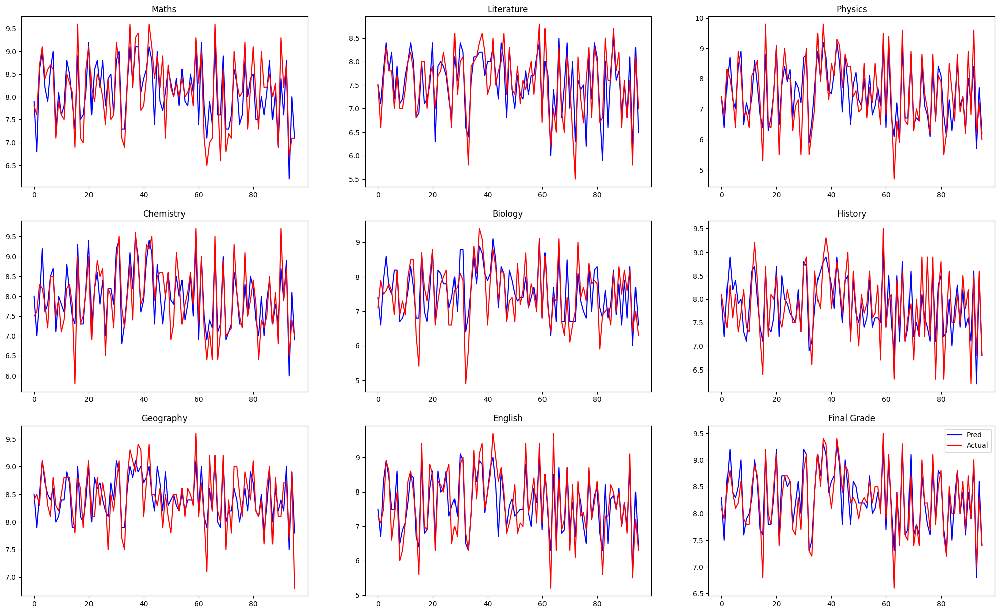

In [ ]:
draw(resultSVM)

In [ ]:
Accuracy(resultSVM)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.383333,4.808650,0.230625,0.480234,95.191350
1,Literature,0.343750,4.679778,0.196667,0.443471,95.320222
2,Physics,0.470833,6.472274,0.370000,0.608276,93.527726
3,Chemistry,0.367708,4.792692,0.228854,0.478387,95.207308
4,Biology,0.448958,6.267713,0.336354,0.579960,93.732287
5,History,0.378125,4.897796,0.221146,0.470261,95.102204
6,Geography,0.265625,3.193232,0.110938,0.333073,96.806768
7,English,0.393750,5.283372,0.268542,0.518210,94.716628
8,Grade,0.194792,2.410020,0.064896,0.254747,97.589980


In [ ]:
predModel(ypredSVM)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.9,7.5,7.4,8.0,7.4,8.0,8.5,7.5,8.3,23.3,22.8,23.3,24.0,22.9,C00,Giỏi
1,6.8,7.1,6.4,7.0,6.6,7.2,7.9,6.7,7.5,20.2,19.9,20.4,22.2,20.6,C00,Khá
2,8.6,7.8,7.9,7.9,7.9,8.2,8.5,8.3,8.6,24.4,24.8,24.4,24.5,24.7,A01,Giỏi
3,9.0,8.4,8.7,9.2,8.6,8.9,9.1,8.9,9.2,26.9,26.6,26.8,26.4,26.3,A00,Xuất sắc
4,8.2,7.8,7.3,7.6,7.7,8.2,8.7,8.4,8.4,23.1,23.9,23.5,24.7,24.4,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.6,6.8,7.2,7.9,6.8,7.1,8.2,7.0,7.9,22.7,21.8,22.3,22.1,21.4,A00,Khá
92,8.8,8.1,8.4,8.9,8.3,8.6,9.0,8.7,8.9,26.1,25.9,26.0,25.7,25.6,A00,Giỏi
93,6.2,6.1,5.7,6.0,6.0,6.2,7.5,5.6,6.8,17.9,17.5,18.2,19.8,17.9,C00,Trung bình khá
94,8.0,8.3,7.7,8.1,7.7,8.5,8.9,8.0,8.6,23.8,23.7,23.8,25.7,24.3,C00,Giỏi


# KNN

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

modelKNNGrade = KNeighborsRegressor().fit(xtrain, ytrainGrade)
modelKNNMaths = KNeighborsRegressor().fit(xtrain, ytrainMaths)
modelKNNLiterature = KNeighborsRegressor().fit(xtrain, ytrainLiterature)
modelKNNPhysics = KNeighborsRegressor().fit(xtrain, ytrainPhysics)
modelKNNChemistry = KNeighborsRegressor().fit(xtrain, ytrainChemistry)
modelKNNBiology = KNeighborsRegressor().fit(xtrain, ytrainBiology)
modelKNNHistory = KNeighborsRegressor().fit(xtrain, ytrainHistory)
modelKNNGeography = KNeighborsRegressor().fit(xtrain, ytrainGeography)
modelKNNEnglish = KNeighborsRegressor().fit(xtrain, ytrainEnglish)
# modelKNNCivic = KNeighborsRegressor().fit(xtrain, xtestCivic)

ypredKNNGrade = modelKNNGrade.predict(xtest).round(1)
ypredKNNMaths = modelKNNMaths.predict(xtest).round(1)
ypredKNNLiterature = modelKNNLiterature.predict(xtest).round(1)
ypredKNNPhysics = modelKNNPhysics.predict(xtest).round(1)
ypredKNNChemistry = modelKNNChemistry.predict(xtest).round(1)
ypredKNNBiology = modelKNNBiology.predict(xtest).round(1)
ypredKNNHistory = modelKNNHistory.predict(xtest).round(1)
ypredKNNGeography = modelKNNGeography.predict(xtest).round(1)
ypredKNNEnglish = modelKNNEnglish.predict(xtest).round(1)
# ypredKNNCivic = modelKNNCivic.predict(ytrain).round(1)

modelKNN = [modelKNNGrade, modelKNNMaths, modelKNNLiterature, modelKNNPhysics, modelKNNChemistry,
            modelKNNBiology, modelKNNHistory, modelKNNGeography, modelKNNEnglish] #modelKNNCivic

ypredKNN = [ypredKNNGrade, ypredKNNMaths, ypredKNNLiterature, ypredKNNPhysics, ypredKNNChemistry,
         ypredKNNBiology, ypredKNNHistory, ypredKNNGeography, ypredKNNEnglish] #ypredKNNCivic

In [ ]:
resultKNN = result(ytest, ypredKNN)
resultKNN

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.8,7.5,7.7,7.4,7.4,7.5,8.3,7.1,7.5,8.1,7.7,8.4,8.5,7.3,7.8,8.1,8.3
1,7.6,7.0,6.6,7.4,6.8,6.4,7.6,7.0,7.9,6.8,7.7,7.2,8.5,8.0,7.1,6.5,7.9,7.7
2,8.7,8.5,7.6,7.9,8.3,7.6,8.3,8.0,7.5,7.4,7.4,8.2,8.3,8.5,7.5,8.3,8.5,8.5
3,9.1,9.0,8.3,8.3,8.0,8.9,8.2,8.9,7.6,8.6,8.3,8.7,9.1,8.9,8.9,8.8,8.8,9.1
4,8.4,8.3,7.8,8.0,7.4,7.5,7.8,7.8,7.8,7.5,7.6,8.4,8.8,8.7,8.6,8.3,8.4,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,7.1,6.8,6.8,7.9,7.9,7.6,6.8,6.2,7.2,8.7,8.1,6.8,6.9,7.9,7.9
92,8.7,9.0,7.6,8.0,9.6,8.9,8.7,9.0,8.2,8.4,8.5,8.6,8.7,8.7,9.1,8.7,9.0,9.0
93,6.7,6.1,5.8,6.3,6.2,5.4,6.5,5.8,6.4,5.8,6.8,6.0,7.7,7.4,5.5,5.5,7.0,6.7
94,7.1,8.3,8.1,8.2,7.2,8.1,7.4,8.3,7.0,8.0,8.6,8.6,8.9,8.6,7.2,8.2,8.3,8.7


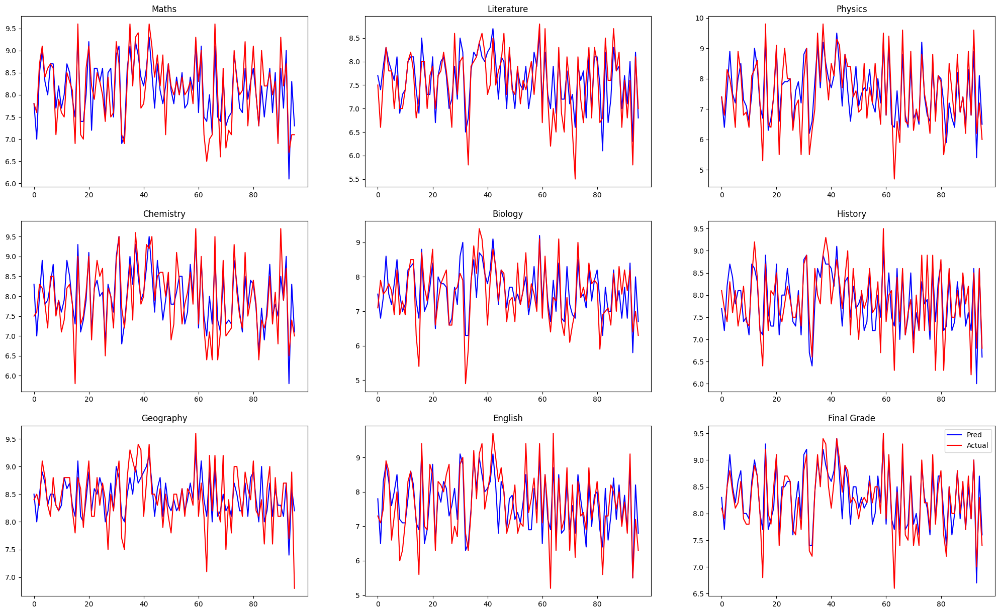

In [ ]:
draw(resultKNN)

In [ ]:
Accuracy(resultKNN)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.360417,4.559914,0.216667,0.465475,95.440086
1,Literature,0.368750,5.122363,0.212917,0.461429,94.877637
2,Physics,0.502083,7.035369,0.438542,0.662225,92.964631
3,Chemistry,0.384375,4.988058,0.254271,0.504253,95.011942
4,Biology,0.431250,6.023580,0.304792,0.552079,93.976420
5,History,0.389583,5.106562,0.230417,0.480017,94.893438
6,Geography,0.300000,3.618925,0.140625,0.375000,96.381075
7,English,0.482292,6.553925,0.366563,0.605444,93.446075
8,Grade,0.195833,2.452072,0.071042,0.266536,97.547928


In [ ]:
predModel(ypredKNN)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.8,7.7,7.4,8.3,7.5,7.7,8.5,7.8,8.3,23.5,23.0,23.6,23.9,23.3,C00,Giỏi
1,7.0,7.4,6.4,7.0,6.8,7.2,8.0,6.5,7.7,20.4,19.9,20.8,22.6,20.9,C00,Khá
2,8.5,7.9,7.6,8.0,7.4,8.2,8.5,8.3,8.5,24.1,24.4,23.9,24.6,24.7,D00,Giỏi
3,9.0,8.3,8.9,8.9,8.6,8.7,8.9,8.8,9.1,26.8,26.7,26.5,25.9,26.1,A00,Xuất sắc
4,8.3,8.0,7.5,7.8,7.5,8.4,8.7,8.3,8.5,23.6,24.1,23.6,25.1,24.6,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,7.1,6.8,7.9,6.8,7.2,8.1,6.9,7.9,22.4,21.4,22.4,22.4,21.7,A00/B00/C00,Khá
92,9.0,8.0,8.9,9.0,8.4,8.6,8.7,8.7,9.0,26.9,26.6,26.4,25.3,25.7,A00,Xuất sắc
93,6.1,6.3,5.4,5.8,5.8,6.0,7.4,5.5,6.7,17.3,17.0,17.7,19.7,17.9,C00,Trung bình khá
94,8.3,8.2,8.1,8.3,8.0,8.6,8.6,8.2,8.7,24.7,24.6,24.6,25.4,24.7,C00,Giỏi


# Lasso Regression

In [ ]:
from sklearn import linear_model

modelLassoGrade = linear_model.Lasso(alpha=0.1).fit(xtrain, ytrainGrade)
modelLassoMaths = linear_model.Lasso(alpha=0.1).fit(xtrain, ytrainMaths)
modelLassoLiterature = linear_model.Lasso(alpha=0.1).fit(xtrain, ytrainLiterature)
modelLassoPhysics = linear_model.Lasso(alpha=0.1).fit(xtrain, ytrainPhysics)
modelLassoChemistry = linear_model.Lasso(alpha=0.1).fit(xtrain, ytrainChemistry)
modelLassoBiology = linear_model.Lasso(alpha=0.1).fit(xtrain, ytrainBiology)
modelLassoHistory = linear_model.Lasso(alpha=0.1).fit(xtrain, ytrainHistory)
modelLassoGeography = linear_model.Lasso(alpha=0.1).fit(xtrain, ytrainGeography)
modelLassoEnglish = linear_model.Lasso(alpha=0.1).fit(xtrain, ytrainEnglish)
# modelLassoCivic = linear_model.Lasso(alpha=0.1).fit(xtrain, xtestCivic)

ypredLassoGrade = modelLassoGrade.predict(xtest).round(1)
ypredLassoMaths = modelLassoMaths.predict(xtest).round(1)
ypredLassoLiterature = modelLassoLiterature.predict(xtest).round(1)
ypredLassoPhysics = modelLassoPhysics.predict(xtest).round(1)
ypredLassoChemistry = modelLassoChemistry.predict(xtest).round(1)
ypredLassoBiology = modelLassoBiology.predict(xtest).round(1)
ypredLassoHistory = modelLassoHistory.predict(xtest).round(1)
ypredLassoGeography = modelLassoGeography.predict(xtest).round(1)
ypredLassoEnglish = modelLassoEnglish.predict(xtest).round(1)
# ypredLassoCivic = modelLassoCivic.predict(ytrain).round(1)

modelLasso = [modelLassoGrade, modelLassoMaths, modelLassoLiterature, modelLassoPhysics, modelLassoChemistry,
            modelLassoBiology, modelLassoHistory, modelLassoGeography, modelLassoEnglish] #modelLassoCivic

ypredLasso = [ypredLassoGrade, ypredLassoMaths, ypredLassoLiterature, ypredLassoPhysics, ypredLassoChemistry,
         ypredLassoBiology, ypredLassoHistory, ypredLassoGeography, ypredLassoEnglish] #ypredLassoCivic

In [ ]:
resultLasso = result(ytest, ypredLasso)
resultLasso

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.8,7.5,7.4,7.4,7.4,7.5,7.9,7.1,7.5,8.1,7.9,8.4,8.5,7.3,7.7,8.1,8.2
1,7.6,7.2,6.6,7.2,6.8,6.7,7.6,7.3,7.9,6.8,7.7,7.5,8.5,8.1,7.1,6.9,7.9,7.7
2,8.7,8.3,7.6,7.7,8.3,7.7,8.3,7.9,7.5,7.7,7.4,7.8,8.3,8.4,7.5,7.9,8.5,8.3
3,9.1,8.7,8.3,8.2,8.0,8.5,8.2,8.8,7.6,8.4,8.3,8.5,9.1,8.8,8.9,8.8,8.8,8.9
4,8.4,8.2,7.8,7.9,7.4,7.3,7.8,7.9,7.8,7.6,7.6,8.1,8.8,8.5,8.6,8.1,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.8,6.8,7.0,6.8,7.3,7.9,8.0,7.6,7.1,6.2,7.2,8.7,8.2,6.8,7.1,7.9,8.0
92,8.7,8.7,7.6,8.0,9.6,8.6,8.7,8.6,8.2,8.3,8.5,8.3,8.7,8.7,9.1,8.6,9.0,8.8
93,6.7,6.9,5.8,6.5,6.2,6.1,6.5,6.8,6.4,6.1,6.8,6.8,7.7,7.8,5.5,6.3,7.0,7.3
94,7.1,7.8,8.1,8.1,7.2,7.9,7.4,8.2,7.0,7.9,8.6,8.4,8.9,8.7,7.2,8.1,8.3,8.5


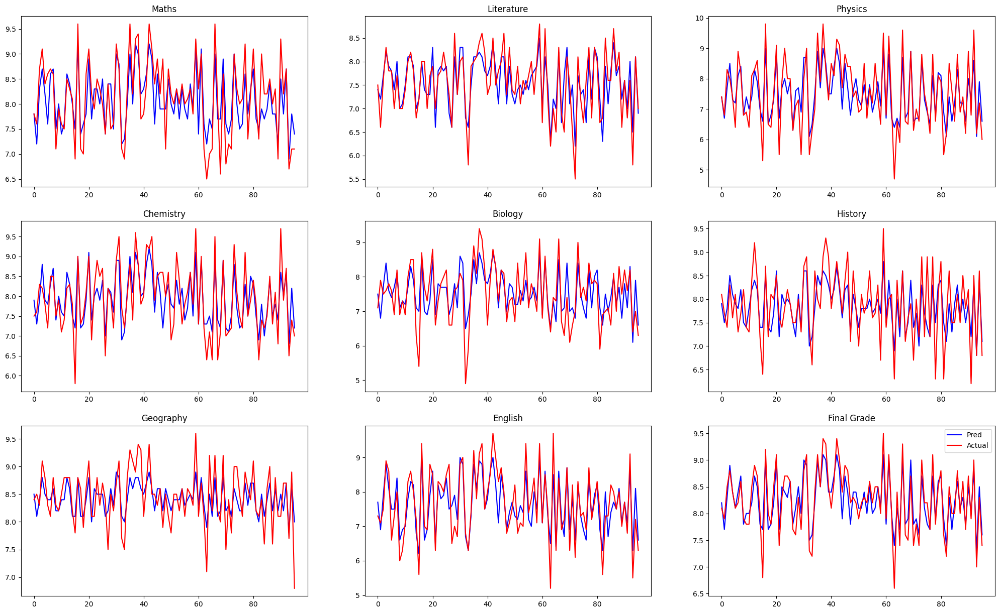

In [ ]:
draw(resultLasso)

In [ ]:
Accuracy(resultLasso)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.361458,4.545276,0.202188,0.449653,95.454724
1,Literature,0.303125,4.160533,0.148854,0.385816,95.839467
2,Physics,0.481250,6.635322,0.373542,0.611181,93.364678
3,Chemistry,0.358333,4.639520,0.222917,0.472141,95.360480
4,Biology,0.448958,6.285104,0.312396,0.558924,93.714896
5,History,0.371875,4.819391,0.227604,0.477079,95.180609
6,Geography,0.277083,3.321981,0.123125,0.350892,96.678019
7,English,0.389583,5.245752,0.252708,0.502701,94.754248
8,Grade,0.218750,2.700437,0.070208,0.264969,97.299563


In [ ]:
predModel(ypredLasso)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.8,7.4,7.4,7.9,7.5,7.9,8.5,7.7,8.2,23.1,22.9,23.2,23.8,22.9,C00,Giỏi
1,7.2,7.2,6.7,7.3,6.8,7.5,8.1,6.9,7.7,21.2,20.8,21.3,22.8,21.3,C00,Khá
2,8.3,7.7,7.7,7.9,7.7,7.8,8.4,7.9,8.3,23.9,23.9,23.9,23.9,23.9,A00/A01/B00/C00/D00,Giỏi
3,8.7,8.2,8.5,8.8,8.4,8.5,8.8,8.8,8.9,26.0,26.0,25.9,25.5,25.7,A00/A01,Giỏi
4,8.2,7.9,7.3,7.9,7.6,8.1,8.5,8.1,8.4,23.4,23.6,23.7,24.5,24.2,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.8,7.0,7.3,8.0,7.1,7.2,8.2,7.1,8.0,23.1,22.2,22.9,22.4,21.9,A00,Giỏi
92,8.7,8.0,8.6,8.6,8.3,8.3,8.7,8.6,8.8,25.9,25.9,25.6,25.0,25.3,A00/A01,Giỏi
93,6.9,6.5,6.1,6.8,6.1,6.8,7.8,6.3,7.3,19.8,19.3,19.8,21.1,19.7,C00,Khá
94,7.8,8.1,7.9,8.2,7.9,8.4,8.7,8.1,8.5,23.9,23.8,23.9,25.2,24.0,C00,Giỏi


# Bayesian Ridge Regression

In [ ]:
reg = linear_model.BayesianRidge()

modelBayesianRidgeGrade = linear_model.BayesianRidge().fit(xtrain, ytrainGrade)
modelBayesianRidgeMaths = linear_model.BayesianRidge().fit(xtrain, ytrainMaths)
modelBayesianRidgeLiterature = linear_model.BayesianRidge().fit(xtrain, ytrainLiterature)
modelBayesianRidgePhysics = linear_model.BayesianRidge().fit(xtrain, ytrainPhysics)
modelBayesianRidgeChemistry = linear_model.BayesianRidge().fit(xtrain, ytrainChemistry)
modelBayesianRidgeBiology = linear_model.BayesianRidge().fit(xtrain, ytrainBiology)
modelBayesianRidgeHistory = linear_model.BayesianRidge().fit(xtrain, ytrainHistory)
modelBayesianRidgeGeography = linear_model.BayesianRidge().fit(xtrain, ytrainGeography)
modelBayesianRidgeEnglish = linear_model.BayesianRidge().fit(xtrain, ytrainEnglish)
# modelBayesianRidgeCivic = linear_model.BayesianRidge().fit(xtrain, xtestCivic)

ypredBayesianRidgeGrade = modelBayesianRidgeGrade.predict(xtest).round(1)
ypredBayesianRidgeMaths = modelBayesianRidgeMaths.predict(xtest).round(1)
ypredBayesianRidgeLiterature = modelBayesianRidgeLiterature.predict(xtest).round(1)
ypredBayesianRidgePhysics = modelBayesianRidgePhysics.predict(xtest).round(1)
ypredBayesianRidgeChemistry = modelBayesianRidgeChemistry.predict(xtest).round(1)
ypredBayesianRidgeBiology = modelBayesianRidgeBiology.predict(xtest).round(1)
ypredBayesianRidgeHistory = modelBayesianRidgeHistory.predict(xtest).round(1)
ypredBayesianRidgeGeography = modelBayesianRidgeGeography.predict(xtest).round(1)
ypredBayesianRidgeEnglish = modelBayesianRidgeEnglish.predict(xtest).round(1)
# ypredBayesianRidgeCivic = modelBayesianRidgeCivic.predict(ytrain).round(1)

modelBayesianRidge = [modelBayesianRidgeGrade, modelBayesianRidgeMaths, modelBayesianRidgeLiterature, modelBayesianRidgePhysics, modelBayesianRidgeChemistry,
            modelBayesianRidgeBiology, modelBayesianRidgeHistory, modelBayesianRidgeGeography, modelBayesianRidgeEnglish] #modelBayesianRidgeCivic

ypredBayesianRidge = [ypredBayesianRidgeGrade, ypredBayesianRidgeMaths, ypredBayesianRidgeLiterature, ypredBayesianRidgePhysics, ypredBayesianRidgeChemistry,
         ypredBayesianRidgeBiology, ypredBayesianRidgeHistory, ypredBayesianRidgeGeography, ypredBayesianRidgeEnglish] #ypredBayesianRidgeCivic

In [ ]:
resultBayesianRidge = result(ytest, ypredBayesianRidge)
resultBayesianRidge

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.7,7.5,7.4,7.4,7.3,7.5,7.9,7.1,7.4,8.1,7.8,8.4,8.5,7.3,7.7,8.1,8.2
1,7.6,7.0,6.6,7.1,6.8,6.6,7.6,7.1,7.9,6.7,7.7,7.2,8.5,8.0,7.1,6.8,7.9,7.6
2,8.7,8.2,7.6,7.8,8.3,7.7,8.3,7.8,7.5,7.8,7.4,8.0,8.3,8.5,7.5,7.9,8.5,8.4
3,9.1,8.9,8.3,8.3,8.0,8.7,8.2,9.0,7.6,8.5,8.3,8.7,9.1,9.0,8.9,9.0,8.8,9.1
4,8.4,8.2,7.8,7.8,7.4,7.4,7.8,7.9,7.8,7.7,7.6,8.2,8.8,8.6,8.6,8.3,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,6.9,6.8,7.1,7.9,7.8,7.6,6.9,6.2,7.2,8.7,8.1,6.8,7.0,7.9,7.8
92,8.7,8.8,7.6,8.1,9.6,8.7,8.7,8.7,8.2,8.4,8.5,8.5,8.7,8.9,9.1,8.7,9.0,8.9
93,6.7,6.6,5.8,6.3,6.2,5.8,6.5,6.5,6.4,6.0,6.8,6.4,7.7,7.5,5.5,6.0,7.0,7.0
94,7.1,7.7,8.1,8.3,7.2,8.0,7.4,8.2,7.0,8.0,8.6,8.4,8.9,8.8,7.2,8.1,8.3,8.6


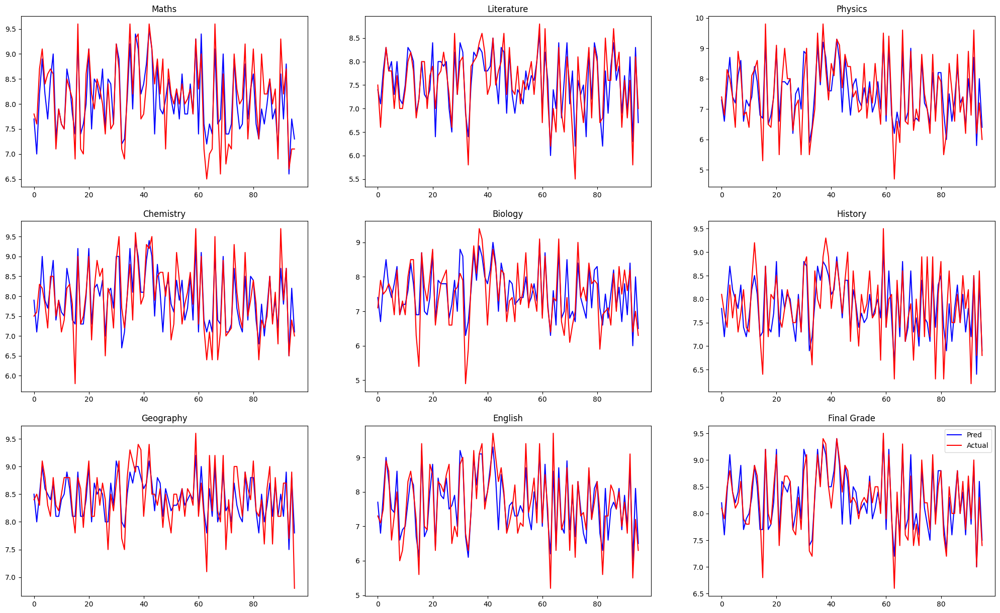

In [ ]:
draw(resultBayesianRidge)

In [ ]:
Accuracy(resultBayesianRidge)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.350000,4.401775,0.201042,0.448377,95.598225
1,Literature,0.316667,4.328278,0.162500,0.403113,95.671722
2,Physics,0.462500,6.431718,0.355833,0.596518,93.568282
3,Chemistry,0.357292,4.618716,0.221146,0.470261,95.381284
4,Biology,0.432292,6.046237,0.299063,0.546866,93.953763
5,History,0.366667,4.768743,0.217708,0.466592,95.231257
6,Geography,0.266667,3.206579,0.104792,0.323715,96.793421
7,English,0.380208,5.126599,0.238646,0.488514,94.873401
8,Grade,0.188542,2.339953,0.057604,0.240009,97.660047


In [ ]:
predModel(ypredBayesianRidge)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.7,7.4,7.3,7.9,7.4,7.8,8.5,7.7,8.2,22.9,22.7,23.0,23.7,22.8,C00,Giỏi
1,7.0,7.1,6.6,7.1,6.7,7.2,8.0,6.8,7.6,20.7,20.4,20.8,22.3,20.9,C00,Khá
2,8.2,7.8,7.7,7.8,7.8,8.0,8.5,7.9,8.4,23.7,23.8,23.8,24.3,23.9,C00,Giỏi
3,8.9,8.3,8.7,9.0,8.5,8.7,9.0,9.0,9.1,26.6,26.6,26.4,26.0,26.2,A00/A01,Xuất sắc
4,8.2,7.8,7.4,7.9,7.7,8.2,8.6,8.3,8.4,23.5,23.9,23.8,24.6,24.3,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,6.9,7.1,7.8,6.9,7.2,8.1,7.0,7.8,22.6,21.8,22.4,22.2,21.6,A00,Khá
92,8.8,8.1,8.7,8.7,8.4,8.5,8.9,8.7,8.9,26.2,26.2,25.9,25.5,25.6,A00/A01,Giỏi
93,6.6,6.3,5.8,6.5,6.0,6.4,7.5,6.0,7.0,18.9,18.4,19.1,20.2,18.9,C00,Khá
94,7.7,8.3,8.0,8.2,8.0,8.4,8.8,8.1,8.6,23.9,23.8,23.9,25.5,24.1,C00,Giỏi


# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

modelRFGrade = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainGrade)
modelRFMaths = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainMaths)
modelRFLiterature = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainLiterature)
modelRFPhysics = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainPhysics)
modelRFChemistry = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainChemistry)
modelRFBiology = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainBiology)
modelRFHistory = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainHistory)
modelRFGeography = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainGeography)
modelRFEnglish = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainEnglish)
# modelRFCivic = RandomForestRegressor(max_depth=2, random_state=0).fit(xtrain, ytrainCivic)

ypredRFGrade = modelRFGrade.predict(xtest).round(1)
ypredRFMaths = modelRFMaths.predict(xtest).round(1)
ypredRFLiterature = modelRFLiterature.predict(xtest).round(1)
ypredRFPhysics = modelRFPhysics.predict(xtest).round(1)
ypredRFChemistry = modelRFChemistry.predict(xtest).round(1)
ypredRFBiology = modelRFBiology.predict(xtest).round(1)
ypredRFHistory = modelRFHistory.predict(xtest).round(1)
ypredRFGeography = modelRFGeography.predict(xtest).round(1)
ypredRFEnglish = modelRFEnglish.predict(xtest).round(1)
# ypredRFCivic = modelRFCivic.predict(xtest).round(1)

modelRF = [modelRFGrade, modelRFMaths, modelRFLiterature, modelRFPhysics, modelRFChemistry,
            modelRFBiology, modelRFHistory, modelRFGeography, modelRFEnglish] #modelRFCivic

ypredRF = [ypredRFGrade, ypredRFMaths, ypredRFLiterature, ypredRFPhysics, ypredRFChemistry,
         ypredRFBiology, ypredRFHistory, ypredRFGeography, ypredRFEnglish] #ypredRFCivic

In [ ]:
resultRF = result(ytest, ypredRF)
resultRF

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.6,7.5,7.4,7.4,7.1,7.5,7.8,7.1,7.4,8.1,7.6,8.4,8.3,7.3,7.6,8.1,8.0
1,7.6,7.2,6.6,7.4,6.8,6.8,7.6,7.4,7.9,6.8,7.7,7.3,8.5,8.0,7.1,6.9,7.9,7.7
2,8.7,8.7,7.6,7.8,8.3,8.2,8.3,7.9,7.5,7.7,7.4,7.7,8.3,8.3,7.5,7.9,8.5,8.5
3,9.1,8.8,8.3,8.0,8.0,8.5,8.2,8.8,7.6,8.3,8.3,8.5,9.1,8.9,8.9,8.6,8.8,8.8
4,8.4,8.3,7.8,8.2,7.4,6.9,7.8,7.7,7.8,7.7,7.6,8.1,8.8,8.6,8.6,8.5,8.4,8.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.6,6.8,7.1,6.8,7.1,7.9,8.0,7.6,7.0,6.2,7.3,8.7,8.2,6.8,7.0,7.9,7.9
92,8.7,8.8,7.6,8.1,9.6,8.4,8.7,8.7,8.2,8.2,8.5,8.5,8.7,8.8,9.1,8.7,9.0,8.8
93,6.7,7.0,5.8,6.4,6.2,6.3,6.5,6.9,6.4,6.5,6.8,7.0,7.7,7.9,5.5,6.5,7.0,7.5
94,7.1,7.5,8.1,8.3,7.2,7.5,7.4,8.1,7.0,7.8,8.6,8.5,8.9,8.8,7.2,8.0,8.3,8.3


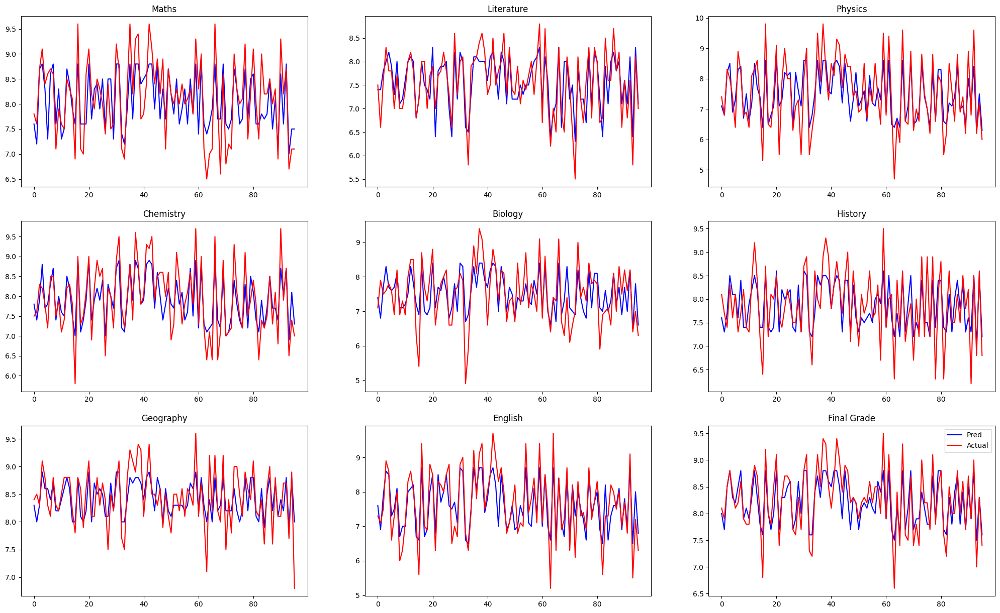

In [ ]:
draw(resultRF)

In [ ]:
Accuracy(resultRF)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.419792,5.246135,0.253646,0.503633,94.753865
1,Literature,0.325000,4.456942,0.171875,0.414578,95.543058
2,Physics,0.530208,7.205001,0.454479,0.674151,92.794999
3,Chemistry,0.370833,4.754609,0.221458,0.470594,95.245391
4,Biology,0.460417,6.391402,0.335208,0.578972,93.608598
5,History,0.401042,5.197407,0.254063,0.504046,94.802593
6,Geography,0.280208,3.357331,0.127396,0.356926,96.642669
7,English,0.415625,5.643688,0.293854,0.542083,94.356312
8,Grade,0.250000,3.053011,0.102500,0.320156,96.946989


In [ ]:
predModel(ypredRF)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.6,7.4,7.1,7.8,7.4,7.6,8.3,7.6,8.0,22.5,22.3,22.8,23.3,22.6,C00,Giỏi
1,7.2,7.4,6.8,7.4,6.8,7.3,8.0,6.9,7.7,21.4,20.9,21.4,22.7,21.5,C00,Khá
2,8.7,7.8,8.2,7.9,7.7,7.7,8.3,7.9,8.5,24.8,24.8,24.3,23.8,24.4,A00/A01,Giỏi
3,8.8,8.0,8.5,8.8,8.3,8.5,8.9,8.6,8.8,26.1,25.9,25.9,25.4,25.4,A00,Giỏi
4,8.3,8.2,6.9,7.7,7.7,8.1,8.6,8.5,8.3,22.9,23.7,23.7,24.9,25.0,D00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.6,7.1,7.1,8.0,7.0,7.3,8.2,7.0,7.9,22.7,21.7,22.6,22.6,21.7,A00,Khá
92,8.8,8.1,8.4,8.7,8.2,8.5,8.8,8.7,8.8,25.9,25.9,25.7,25.4,25.6,A00/A01,Giỏi
93,7.0,6.4,6.3,6.9,6.5,7.0,7.9,6.5,7.5,20.2,19.8,20.4,21.3,19.9,C00,Khá
94,7.5,8.3,7.5,8.1,7.8,8.5,8.8,8.0,8.3,23.1,23.0,23.4,25.6,23.8,C00,Giỏi


# Multi-layer Perceptron Regressor (MLP - NN)

In [ ]:
from sklearn.neural_network import MLPRegressor

modelMLPGrade = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, ytrainGrade)
modelMLPMaths = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, ytrainMaths)
modelMLPLiterature = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, ytrainLiterature)
modelMLPPhysics = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, ytrainPhysics)
modelMLPChemistry = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, ytrainChemistry)
modelMLPBiology = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, ytrainBiology)
modelMLPHistory = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, ytrainHistory)
modelMLPGeography = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, ytrainGeography)
modelMLPEnglish = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, ytrainEnglish)
# modelMLPCivic = MLPRegressor(random_state=1, max_iter=500).fit(xtrain, xtestCivic)

ypredMLPGrade = modelMLPGrade.predict(xtest).round(1)
ypredMLPMaths = modelMLPMaths.predict(xtest).round(1)
ypredMLPLiterature = modelMLPLiterature.predict(xtest).round(1)
ypredMLPPhysics = modelMLPPhysics.predict(xtest).round(1)
ypredMLPChemistry = modelMLPChemistry.predict(xtest).round(1)
ypredMLPBiology = modelMLPBiology.predict(xtest).round(1)
ypredMLPHistory = modelMLPHistory.predict(xtest).round(1)
ypredMLPGeography = modelMLPGeography.predict(xtest).round(1)
ypredMLPEnglish = modelMLPEnglish.predict(xtest).round(1)
# ypredMLPCivic = modelMLPCivic.predict(ytrain).round(1)

modelMLP = [modelMLPGrade, modelMLPMaths, modelMLPLiterature, modelMLPPhysics, modelMLPChemistry,
            modelMLPBiology, modelMLPHistory, modelMLPGeography, modelMLPEnglish] # modelMLPCivic

ypredMLP = [ypredMLPGrade, ypredMLPMaths, ypredMLPLiterature, ypredMLPPhysics, ypredMLPChemistry,
         ypredMLPBiology, ypredMLPHistory, ypredMLPGeography, ypredMLPEnglish] #ypredMLPCivic

In [ ]:
resultMLP = result(ytest, ypredMLP)
resultMLP

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.6,7.5,7.6,7.4,7.4,7.5,7.9,7.1,7.5,8.1,8.0,8.4,8.3,7.3,7.8,8.1,8.1
1,7.6,6.8,6.6,7.2,6.8,6.6,7.6,7.2,7.9,6.8,7.7,7.3,8.5,8.0,7.1,6.9,7.9,7.6
2,8.7,8.2,7.6,8.1,8.3,7.5,8.3,7.9,7.5,8.0,7.4,8.1,8.3,8.7,7.5,8.0,8.5,8.5
3,9.1,9.2,8.3,8.7,8.0,8.8,8.2,9.5,7.6,8.9,8.3,9.2,9.1,9.8,8.9,9.3,8.8,9.5
4,8.4,8.2,7.8,8.0,7.4,7.1,7.8,7.8,7.8,7.7,7.6,8.3,8.8,8.9,8.6,8.3,8.4,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.5,6.8,6.8,6.8,7.1,7.9,7.9,7.6,6.8,6.2,7.0,8.7,8.1,6.8,7.1,7.9,7.8
92,8.7,8.7,7.6,8.3,9.6,8.5,8.7,8.9,8.2,8.4,8.5,8.7,8.7,9.1,9.1,8.8,9.0,9.1
93,6.7,6.0,5.8,6.2,6.2,5.7,6.5,6.0,6.4,5.8,6.8,5.9,7.7,6.7,5.5,6.0,7.0,6.5
94,7.1,8.2,8.1,8.8,7.2,8.1,7.4,8.8,7.0,8.3,8.6,8.9,8.9,9.7,7.2,8.4,8.3,9.2


In [ ]:
Accuracy(resultMLP)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.402083,5.056925,0.293333,0.541603,94.943075
1,Literature,0.413542,5.632345,0.279271,0.528461,94.367655
2,Physics,0.464583,6.295340,0.344792,0.587190,93.704660
3,Chemistry,0.419792,5.427148,0.293437,0.541699,94.572852
4,Biology,0.504167,7.060771,0.398542,0.631302,92.939229
5,History,0.412500,5.338292,0.279583,0.528756,94.661708
6,Geography,0.344792,4.115064,0.180104,0.424387,95.884936
7,English,0.425000,5.799415,0.297708,0.545627,94.200585
8,Grade,0.267708,3.263933,0.116354,0.341107,96.736067


In [ ]:
predModel(ypredMLP)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.6,7.6,7.4,7.9,7.5,8.0,8.3,7.8,8.1,22.9,22.8,23.0,23.9,23.0,C00,Giỏi
1,6.8,7.2,6.6,7.2,6.8,7.3,8.0,6.9,7.6,20.6,20.3,20.8,22.5,20.9,C00,Khá
2,8.2,8.1,7.5,7.9,8.0,8.1,8.7,8.0,8.5,23.6,23.7,24.1,24.9,24.3,C00,Giỏi
3,9.2,8.7,8.8,9.5,8.9,9.2,9.8,9.3,9.5,27.5,27.3,27.6,27.7,27.2,C00,Xuất sắc
4,8.2,8.0,7.1,7.8,7.7,8.3,8.9,8.3,8.5,23.1,23.6,23.7,25.2,24.5,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.5,6.8,7.1,7.9,6.8,7.0,8.1,7.1,7.8,22.5,21.7,22.2,21.9,21.4,A00,Khá
92,8.7,8.3,8.5,8.9,8.4,8.7,9.1,8.8,9.1,26.1,26.0,26.0,26.1,25.8,A00/C00,Xuất sắc
93,6.0,6.2,5.7,6.0,5.8,5.9,6.7,6.0,6.5,17.7,17.7,17.8,18.8,18.2,C00,Trung bình khá
94,8.2,8.8,8.1,8.8,8.3,8.9,9.7,8.4,9.2,25.1,24.7,25.3,27.4,25.4,C00,Xuất sắc


# ElasticNet

In [ ]:
from sklearn.linear_model import ElasticNet

modelElasticNetGrade = ElasticNet(random_state=0).fit(xtrain, ytrainGrade)
modelElasticNetMaths = ElasticNet(random_state=0).fit(xtrain, ytrainMaths)
modelElasticNetLiterature = ElasticNet(random_state=0).fit(xtrain, ytrainLiterature)
modelElasticNetPhysics = ElasticNet(random_state=0).fit(xtrain, ytrainPhysics)
modelElasticNetChemistry = ElasticNet(random_state=0).fit(xtrain, ytrainChemistry)
modelElasticNetBiology = ElasticNet(random_state=0).fit(xtrain, ytrainBiology)
modelElasticNetHistory = ElasticNet(random_state=0).fit(xtrain, ytrainHistory)
modelElasticNetGeography = ElasticNet(random_state=0).fit(xtrain, ytrainGeography)
modelElasticNetEnglish = ElasticNet(random_state=0).fit(xtrain, ytrainEnglish)
# modelElasticNetCivic = ElasticNet(random_state=0).fit(xtrain, xtestCivic)

ypredElasticNetGrade = modelElasticNetGrade.predict(xtest).round(1)
ypredElasticNetMaths = modelElasticNetMaths.predict(xtest).round(1)
ypredElasticNetLiterature = modelElasticNetLiterature.predict(xtest).round(1)
ypredElasticNetPhysics = modelElasticNetPhysics.predict(xtest).round(1)
ypredElasticNetChemistry = modelElasticNetChemistry.predict(xtest).round(1)
ypredElasticNetBiology = modelElasticNetBiology.predict(xtest).round(1)
ypredElasticNetHistory = modelElasticNetHistory.predict(xtest).round(1)
ypredElasticNetGeography = modelElasticNetGeography.predict(xtest).round(1)
ypredElasticNetEnglish = modelElasticNetEnglish.predict(xtest).round(1)
# ypredElasticNetCivic = modelElasticNetCivic.predict(ytrain).round(1)

modelElasticNet = [modelElasticNetGrade, modelElasticNetMaths, modelElasticNetLiterature, modelElasticNetPhysics, modelElasticNetChemistry,
            modelElasticNetBiology, modelElasticNetHistory, modelElasticNetGeography, modelElasticNetEnglish] # modelElasticNetCivic

ypredElasticNet = [ypredElasticNetGrade, ypredElasticNetMaths, ypredElasticNetLiterature, ypredElasticNetPhysics, ypredElasticNetChemistry,
         ypredElasticNetBiology, ypredElasticNetHistory, ypredElasticNetGeography, ypredElasticNetEnglish] #ypredElasticNetCivic

In [ ]:
resultElasticNet = result(ytest, ypredElasticNet)
resultElasticNet

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.9,7.5,7.4,7.4,7.3,7.5,7.8,7.1,7.4,8.1,7.7,8.4,8.4,7.3,7.6,8.1,8.1
1,7.6,7.7,6.6,7.4,6.8,7.0,7.6,7.6,7.9,7.2,7.7,7.7,8.5,8.4,7.1,7.2,7.9,8.1
2,8.7,8.1,7.6,7.5,8.3,7.5,8.3,7.9,7.5,7.5,7.4,7.7,8.3,8.4,7.5,7.7,8.5,8.2
3,9.1,8.2,8.3,7.7,8.0,7.8,8.2,8.2,7.6,7.7,8.3,7.8,9.1,8.4,8.9,8.0,8.8,8.3
4,8.4,8.0,7.8,7.6,7.4,7.3,7.8,7.9,7.8,7.5,7.6,7.8,8.8,8.4,8.6,7.8,8.4,8.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.9,6.8,7.3,6.8,7.3,7.9,7.9,7.6,7.3,6.2,7.7,8.7,8.4,6.8,7.3,7.9,8.1
92,8.7,8.2,7.6,7.6,9.6,8.0,8.7,8.2,8.2,7.8,8.5,7.9,8.7,8.4,9.1,8.0,9.0,8.3
93,6.7,7.7,5.8,7.3,6.2,6.9,6.5,7.6,6.4,7.2,6.8,7.7,7.7,8.4,5.5,7.1,7.0,8.1
94,7.1,8.0,8.1,7.6,7.2,7.6,7.4,8.1,7.0,7.6,8.6,7.9,8.9,8.4,7.2,7.8,8.3,8.3


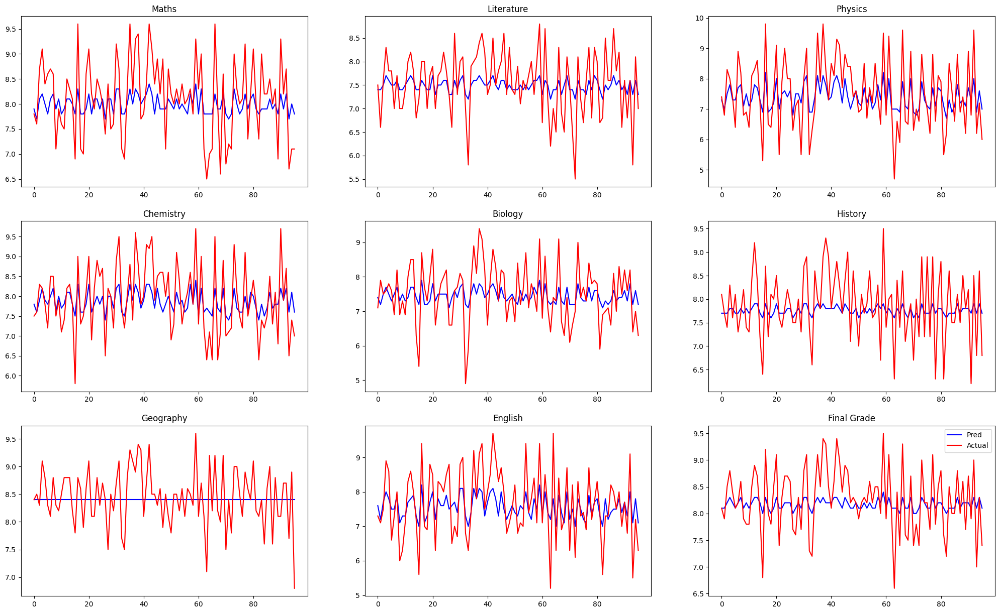

In [ ]:
draw(resultElasticNet)

In [ ]:
Accuracy(resultElasticNet)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.556250,6.886339,0.435625,0.660019,93.113661
1,Literature,0.480208,6.538088,0.346771,0.588873,93.461912
2,Physics,0.709375,9.636421,0.752604,0.867528,90.363579
3,Chemistry,0.538542,6.830579,0.450729,0.671364,93.169421
4,Biology,0.580208,7.946661,0.522187,0.722625,92.053339
5,History,0.543750,6.959115,0.462083,0.679767,93.040885
6,Geography,0.410417,4.903456,0.267917,0.517607,95.096544
7,English,0.617708,8.218185,0.582813,0.763422,91.781815
8,Grade,0.438542,5.334372,0.294896,0.543043,94.665628


In [ ]:
predModel(ypredElasticNet)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.9,7.4,7.3,7.8,7.4,7.7,8.4,7.6,8.1,23.0,22.8,23.1,23.5,22.9,C00,Giỏi
1,7.7,7.4,7.0,7.6,7.2,7.7,8.4,7.2,8.1,22.3,21.9,22.5,23.5,22.3,C00,Giỏi
2,8.1,7.5,7.5,7.9,7.5,7.7,8.4,7.7,8.2,23.5,23.3,23.5,23.6,23.3,C00,Giỏi
3,8.2,7.7,7.8,8.2,7.7,7.8,8.4,8.0,8.3,24.2,24.0,24.1,23.9,23.9,A00,Giỏi
4,8.0,7.6,7.3,7.9,7.5,7.8,8.4,7.8,8.2,23.2,23.1,23.4,23.8,23.4,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.9,7.3,7.3,7.9,7.3,7.7,8.4,7.3,8.1,23.1,22.5,23.1,23.4,22.5,C00,Giỏi
92,8.2,7.6,8.0,8.2,7.8,7.9,8.4,8.0,8.3,24.4,24.2,24.2,23.9,23.8,A00,Giỏi
93,7.7,7.3,6.9,7.6,7.2,7.7,8.4,7.1,8.1,22.2,21.7,22.5,23.4,22.1,C00,Giỏi
94,8.0,7.6,7.6,8.1,7.6,7.9,8.4,7.8,8.3,23.7,23.4,23.7,23.9,23.4,C00,Giỏi


# Polynomial Regression

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

modelPolyGrade = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())]).fit(xtrain, ytrainGrade)
modelPolyMaths = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())]).fit(xtrain, ytrainMaths)
modelPolyLiterature = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())]).fit(xtrain, ytrainLiterature)
modelPolyPhysics = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())]).fit(xtrain, ytrainPhysics)
modelPolyChemistry = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())]).fit(xtrain, ytrainChemistry)
modelPolyBiology = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())]).fit(xtrain, ytrainBiology)
modelPolyHistory = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())]).fit(xtrain, ytrainHistory)
modelPolyGeography = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())]).fit(xtrain, ytrainGeography)
modelPolyEnglish = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())]).fit(xtrain, ytrainEnglish)
# modelPolyCivic = Pipeline([('polynomial',PolynomialFeatures()),('modal',LinearRegression())])).fit(xtrain, xtestCivic)

ypredPolyGrade = modelPolyGrade.predict(xtest).round(1)
ypredPolyMaths = modelPolyMaths.predict(xtest).round(1)
ypredPolyLiterature = modelPolyLiterature.predict(xtest).round(1)
ypredPolyPhysics = modelPolyPhysics.predict(xtest).round(1)
ypredPolyChemistry = modelPolyChemistry.predict(xtest).round(1)
ypredPolyBiology = modelPolyBiology.predict(xtest).round(1)
ypredPolyHistory = modelPolyHistory.predict(xtest).round(1)
ypredPolyGeography = modelPolyGeography.predict(xtest).round(1)
ypredPolyEnglish = modelPolyEnglish.predict(xtest).round(1)
# ypredPolyCivic = modelPolyCivic.predict(ytrain).round(1)

modelPoly = [modelPolyGrade, modelPolyMaths, modelPolyLiterature, modelPolyPhysics, modelPolyChemistry,
            modelPolyBiology, modelPolyHistory, modelPolyGeography, modelPolyEnglish] # modelPolyCivic

ypredPoly = [ypredPolyGrade, ypredPolyMaths, ypredPolyLiterature, ypredPolyPhysics, ypredPolyChemistry,
         ypredPolyBiology, ypredPolyHistory, ypredPolyGeography, ypredPolyEnglish] #ypredPolyCivic

In [ ]:
resultPoly = result(ytest, ypredPoly)
resultPoly

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.4,7.5,7.5,7.4,6.9,7.5,6.0,7.1,7.4,8.1,8.0,8.4,7.7,7.3,7.8,8.1,7.9
1,7.6,6.8,6.6,5.8,6.8,6.4,7.6,6.4,7.9,8.1,7.7,6.8,8.5,8.3,7.1,6.1,7.9,7.6
2,8.7,8.3,7.6,9.1,8.3,8.2,8.3,8.3,7.5,7.8,7.4,7.4,8.3,8.7,7.5,7.3,8.5,8.5
3,9.1,8.9,8.3,8.7,8.0,8.7,8.2,9.2,7.6,8.9,8.3,8.5,9.1,9.1,8.9,8.2,8.8,9.1
4,8.4,7.9,7.8,6.7,7.4,7.7,7.8,7.0,7.8,7.8,7.6,6.8,8.8,8.6,8.6,7.9,8.4,7.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,8.2,6.8,6.3,6.8,10.0,7.9,8.6,7.6,9.5,6.2,6.0,8.7,8.0,6.8,7.5,7.9,8.4
92,8.7,8.4,7.6,8.7,9.6,8.5,8.7,8.8,8.2,8.4,8.5,9.9,8.7,9.4,9.1,8.2,9.0,9.1
93,6.7,6.3,5.8,6.0,6.2,6.9,6.5,6.4,6.4,6.1,6.8,6.3,7.7,7.6,5.5,5.8,7.0,6.9
94,7.1,8.5,8.1,6.4,7.2,5.8,7.4,9.7,7.0,9.2,8.6,9.5,8.9,8.5,7.2,8.6,8.3,8.5


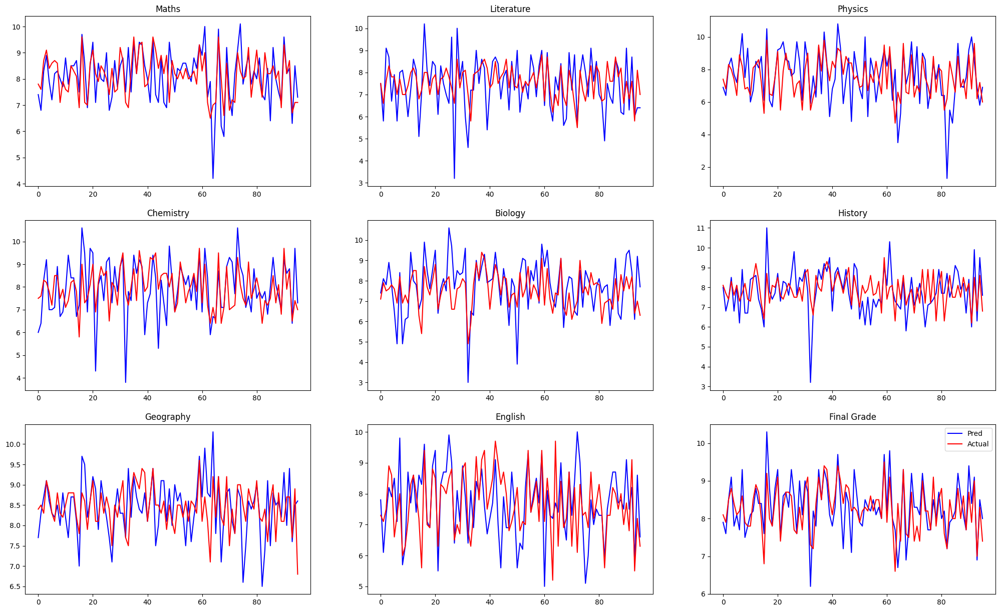

In [ ]:
draw(resultPoly)

In [ ]:
Accuracy(resultPoly)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.644792,8.179775,0.773229,0.879335,91.820225
1,Literature,0.826042,11.147853,1.151979,1.073303,88.852147
2,Physics,1.097917,15.485893,2.121250,1.456451,84.514107
3,Chemistry,0.845833,10.945971,1.263958,1.124259,89.054029
4,Biology,0.886458,12.322724,1.238646,1.112945,87.677276
5,History,0.793750,10.145719,1.046667,1.023067,89.854281
6,Geography,0.529167,6.418801,0.502292,0.708725,93.581199
7,English,0.779167,10.569194,1.153333,1.073934,89.430806
8,Grade,0.403125,4.948212,0.273438,0.522913,95.051788


In [ ]:
predModel(ypredPoly)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.4,7.5,6.9,6.0,7.4,8.0,7.7,7.8,7.9,20.3,22.1,20.8,23.2,22.7,C00,Khá
1,6.8,5.8,6.4,6.4,8.1,6.8,8.3,6.1,7.6,19.6,19.3,21.3,20.9,18.7,B00,Khá
2,8.3,9.1,8.2,8.3,7.8,7.4,8.7,7.3,8.5,24.8,23.8,24.4,25.2,24.7,C00,Giỏi
3,8.9,8.7,8.7,9.2,8.9,8.5,9.1,8.2,9.1,26.8,25.8,27.0,26.3,25.8,B00,Xuất sắc
4,7.9,6.7,7.7,7.0,7.8,6.8,8.6,7.9,7.8,22.6,23.5,22.7,22.1,22.5,A01,Khá
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,6.3,10.0,8.6,9.5,6.0,8.0,7.5,8.4,26.8,25.7,26.3,20.3,22.0,A00,Giỏi
92,8.4,8.7,8.5,8.8,8.4,9.9,9.4,8.2,9.1,25.7,25.1,25.6,28.0,25.3,C00,Xuất sắc
93,6.3,6.0,6.9,6.4,6.1,6.3,7.6,5.8,6.9,19.6,19.0,18.8,19.9,18.1,C00,Trung bình khá
94,8.5,6.4,5.8,9.7,9.2,9.5,8.5,8.6,8.5,24.0,22.9,27.4,24.4,23.5,B00,Giỏi


# SGD

In [ ]:
from sklearn.linear_model import SGDRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

modelSGDGrade = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3)).fit(xtrain, ytrainGrade)
modelSGDMaths = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3)).fit(xtrain, ytrainMaths)
modelSGDLiterature = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3)).fit(xtrain, ytrainLiterature)
modelSGDPhysics = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3)).fit(xtrain, ytrainPhysics)
modelSGDChemistry = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3)).fit(xtrain, ytrainChemistry)
modelSGDBiology = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3)).fit(xtrain, ytrainBiology)
modelSGDHistory = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3)).fit(xtrain, ytrainHistory)
modelSGDGeography = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3)).fit(xtrain, ytrainGeography)
modelSGDEnglish = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3)).fit(xtrain, ytrainEnglish)
# modelSGDCivic = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3))).fit(xtrain, xtestCivic)

ypredSGDGrade = modelSGDGrade.predict(xtest).round(1)
ypredSGDMaths = modelSGDMaths.predict(xtest).round(1)
ypredSGDLiterature = modelSGDLiterature.predict(xtest).round(1)
ypredSGDPhysics = modelSGDPhysics.predict(xtest).round(1)
ypredSGDChemistry = modelSGDChemistry.predict(xtest).round(1)
ypredSGDBiology = modelSGDBiology.predict(xtest).round(1)
ypredSGDHistory = modelSGDHistory.predict(xtest).round(1)
ypredSGDGeography = modelSGDGeography.predict(xtest).round(1)
ypredSGDEnglish = modelSGDEnglish.predict(xtest).round(1)
# ypredSGDCivic = modelSGDCivic.predict(ytrain).round(1)

modelSGD = [modelSGDGrade, modelSGDMaths, modelSGDLiterature, modelSGDPhysics, modelSGDChemistry,
            modelSGDBiology, modelSGDHistory, modelSGDGeography, modelSGDEnglish] # modelSGDCivic

ypredSGD = [ypredSGDGrade, ypredSGDMaths, ypredSGDLiterature, ypredSGDPhysics, ypredSGDChemistry,
         ypredSGDBiology, ypredSGDHistory, ypredSGDGeography, ypredSGDEnglish] #ypredSGDCivic

In [ ]:
resultSGD = result(ytest, ypredSGD)
resultSGD

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.6,7.5,7.4,7.4,7.3,7.5,7.9,7.1,7.3,8.1,7.8,8.4,8.6,7.3,7.8,8.1,8.2
1,7.6,6.9,6.6,7.1,6.8,6.6,7.6,7.2,7.9,6.8,7.7,7.3,8.5,8.0,7.1,6.7,7.9,7.6
2,8.7,8.2,7.6,7.8,8.3,7.7,8.3,7.7,7.5,7.8,7.4,8.0,8.3,8.4,7.5,7.9,8.5,8.3
3,9.1,9.0,8.3,8.4,8.0,8.8,8.2,8.9,7.6,8.5,8.3,8.7,9.1,9.0,8.9,9.0,8.8,9.1
4,8.4,8.2,7.8,7.8,7.4,7.4,7.8,7.7,7.8,7.7,7.6,8.2,8.8,8.7,8.6,8.2,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,6.8,6.8,7.2,7.9,7.9,7.6,6.8,6.2,7.1,8.7,8.0,6.8,7.1,7.9,7.7
92,8.7,8.8,7.6,8.2,9.6,8.8,8.7,8.6,8.2,8.3,8.5,8.5,8.7,8.8,9.1,8.6,9.0,8.9
93,6.7,6.5,5.8,6.2,6.2,5.7,6.5,6.5,6.4,6.0,6.8,6.4,7.7,7.5,5.5,6.0,7.0,6.9
94,7.1,7.6,8.1,8.3,7.2,8.0,7.4,8.1,7.0,8.0,8.6,8.3,8.9,8.8,7.2,8.0,8.3,8.6


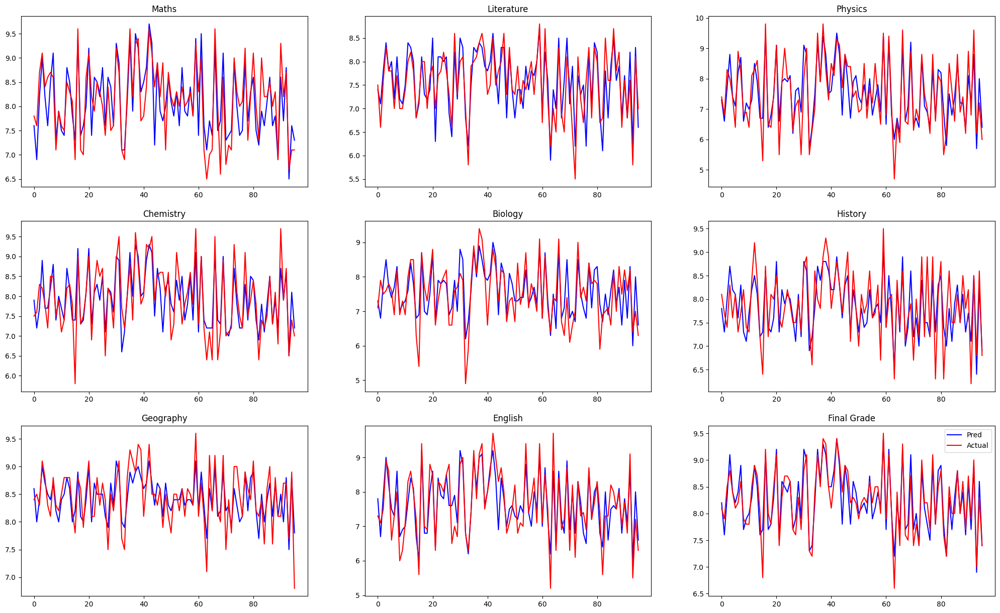

In [ ]:
draw(resultSGD)

In [ ]:
Accuracy(resultSGD)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.365625,4.581283,0.218854,0.467819,95.418717
1,Literature,0.338542,4.612116,0.183438,0.428296,95.387884
2,Physics,0.451042,6.286826,0.335521,0.579242,93.713174
3,Chemistry,0.355208,4.600306,0.231146,0.480776,95.399694
4,Biology,0.428125,6.003171,0.300729,0.548388,93.996829
5,History,0.365625,4.734557,0.210938,0.459279,95.265443
6,Geography,0.254167,3.053321,0.102083,0.319505,96.946679
7,English,0.380208,5.134958,0.236146,0.485948,94.865042
8,Grade,0.187500,2.314133,0.057708,0.240226,97.685867


In [ ]:
predModel(ypredSGD)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.6,7.4,7.3,7.9,7.3,7.8,8.6,7.8,8.2,22.8,22.7,22.8,23.8,22.8,C00,Giỏi
1,6.9,7.1,6.6,7.2,6.8,7.3,8.0,6.7,7.6,20.7,20.2,20.9,22.4,20.7,C00,Khá
2,8.2,7.8,7.7,7.7,7.8,8.0,8.4,7.9,8.3,23.6,23.8,23.7,24.2,23.9,C00,Giỏi
3,9.0,8.4,8.8,8.9,8.5,8.7,9.0,9.0,9.1,26.7,26.8,26.4,26.1,26.4,A01,Xuất sắc
4,8.2,7.8,7.4,7.7,7.7,8.2,8.7,8.2,8.4,23.3,23.8,23.6,24.7,24.2,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,6.8,7.2,7.9,6.8,7.1,8.0,7.1,7.7,22.8,22.0,22.4,21.9,21.6,A00,Khá
92,8.8,8.2,8.8,8.6,8.3,8.5,8.8,8.6,8.9,26.2,26.2,25.7,25.5,25.6,A00/A01,Giỏi
93,6.5,6.2,5.7,6.5,6.0,6.4,7.5,6.0,6.9,18.7,18.2,19.0,20.1,18.7,C00,Trung bình khá
94,7.6,8.3,8.0,8.1,8.0,8.3,8.8,8.0,8.6,23.7,23.6,23.7,25.4,23.9,C00,Giỏi


# Huber Regression

In [ ]:
from sklearn.linear_model import HuberRegressor, LinearRegression

modelHuberGrade = HuberRegressor().fit(xtrain, ytrainGrade)
modelHuberMaths = HuberRegressor().fit(xtrain, ytrainMaths)
modelHuberLiterature = HuberRegressor().fit(xtrain, ytrainLiterature)
modelHuberPhysics = HuberRegressor().fit(xtrain, ytrainPhysics)
modelHuberChemistry = HuberRegressor().fit(xtrain, ytrainChemistry)
modelHuberBiology = HuberRegressor().fit(xtrain, ytrainBiology)
modelHuberHistory = HuberRegressor().fit(xtrain, ytrainHistory)
modelHuberGeography = HuberRegressor().fit(xtrain, ytrainGeography)
modelHuberEnglish = HuberRegressor().fit(xtrain, ytrainEnglish)
# modelHuberCivic = HuberRegressor()).fit(xtrain, xtestCivic)

ypredHuberGrade = modelHuberGrade.predict(xtest).round(1)
ypredHuberMaths = modelHuberMaths.predict(xtest).round(1)
ypredHuberLiterature = modelHuberLiterature.predict(xtest).round(1)
ypredHuberPhysics = modelHuberPhysics.predict(xtest).round(1)
ypredHuberChemistry = modelHuberChemistry.predict(xtest).round(1)
ypredHuberBiology = modelHuberBiology.predict(xtest).round(1)
ypredHuberHistory = modelHuberHistory.predict(xtest).round(1)
ypredHuberGeography = modelHuberGeography.predict(xtest).round(1)
ypredHuberEnglish = modelHuberEnglish.predict(xtest).round(1)
# ypredHuberCivic = modelHuberCivic.predict(ytrain).round(1)

modelHuber = [modelHuberGrade, modelHuberMaths, modelHuberLiterature, modelHuberPhysics, modelHuberChemistry,
            modelHuberBiology, modelHuberHistory, modelHuberGeography, modelHuberEnglish] # modelHuberCivic

ypredHuber = [ypredHuberGrade, ypredHuberMaths, ypredHuberLiterature, ypredHuberPhysics, ypredHuberChemistry,
         ypredHuberBiology, ypredHuberHistory, ypredHuberGeography, ypredHuberEnglish] #ypredHuberCivic

In [ ]:
resultHuber = result(ytest, ypredHuber)
resultHuber

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.7,7.5,7.4,7.4,7.3,7.5,7.9,7.1,7.5,8.1,8.0,8.4,8.5,7.3,7.7,8.1,8.2
1,7.6,6.9,6.6,7.2,6.8,6.8,7.6,7.3,7.9,6.7,7.7,7.2,8.5,8.1,7.1,6.8,7.9,7.6
2,8.7,8.2,7.6,7.7,8.3,7.5,8.3,7.6,7.5,7.8,7.4,8.0,8.3,8.4,7.5,7.8,8.5,8.2
3,9.1,8.9,8.3,8.3,8.0,8.6,8.2,9.0,7.6,8.6,8.3,8.7,9.1,9.0,8.9,9.0,8.8,9.2
4,8.4,8.2,7.8,7.9,7.4,7.2,7.8,7.8,7.8,7.7,7.6,8.2,8.8,8.7,8.6,8.3,8.4,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.8,6.8,6.8,6.8,7.2,7.9,7.9,7.6,6.6,6.2,7.2,8.7,8.1,6.8,7.0,7.9,7.8
92,8.7,8.7,7.6,8.0,9.6,8.6,8.7,8.7,8.2,8.5,8.5,8.5,8.7,8.9,9.1,8.6,9.0,9.0
93,6.7,6.6,5.8,6.3,6.2,5.9,6.5,6.5,6.4,5.9,6.8,6.4,7.7,7.4,5.5,5.9,7.0,6.9
94,7.1,7.4,8.1,8.3,7.2,7.9,7.4,8.2,7.0,8.0,8.6,8.4,8.9,8.9,7.2,8.0,8.3,8.7


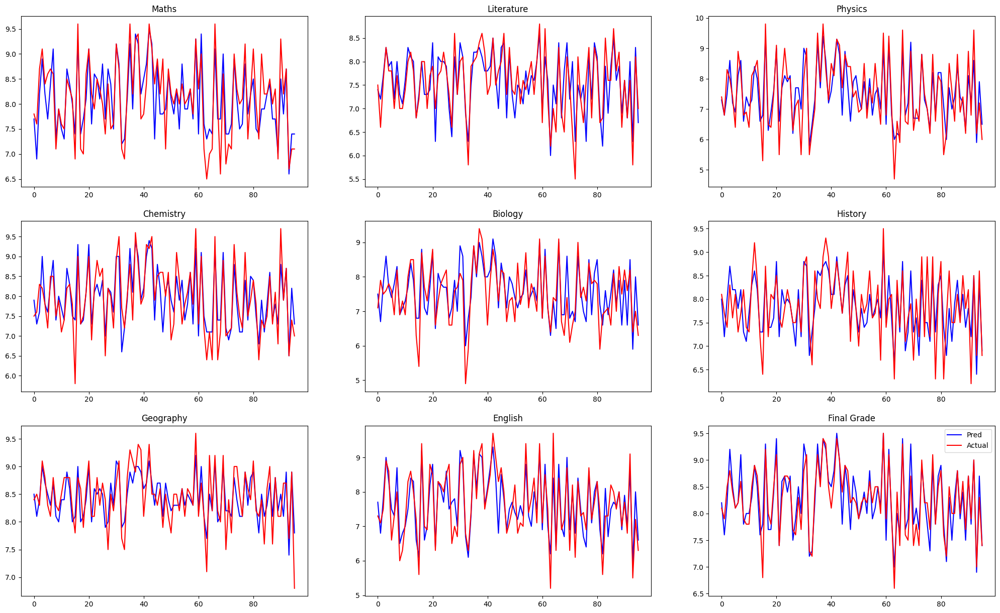

In [ ]:
draw(resultHuber)

In [ ]:
Accuracy(resultHuber)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.355208,4.469111,0.207604,0.455636,95.530889
1,Literature,0.329167,4.511323,0.185000,0.430116,95.488677
2,Physics,0.459375,6.410286,0.345938,0.588165,93.589714
3,Chemistry,0.356250,4.623431,0.226875,0.476314,95.376569
4,Biology,0.445833,6.230434,0.321042,0.566605,93.769566
5,History,0.379167,4.937081,0.221042,0.470151,95.062919
6,Geography,0.256250,3.088729,0.100417,0.316886,96.911271
7,English,0.384375,5.165714,0.241979,0.491914,94.834286
8,Grade,0.207292,2.563866,0.073021,0.270224,97.436134


In [ ]:
predModel(ypredHuber)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.7,7.4,7.3,7.9,7.5,8.0,8.5,7.7,8.2,22.9,22.7,23.1,23.9,22.8,C00,Giỏi
1,6.9,7.2,6.8,7.3,6.7,7.2,8.1,6.8,7.6,21.0,20.5,20.9,22.5,20.9,C00,Khá
2,8.2,7.7,7.5,7.6,7.8,8.0,8.4,7.8,8.2,23.3,23.5,23.6,24.1,23.7,C00,Giỏi
3,8.9,8.3,8.6,9.0,8.6,8.7,9.0,9.0,9.2,26.5,26.5,26.5,26.0,26.2,A00/A01/B00,Xuất sắc
4,8.2,7.9,7.2,7.8,7.7,8.2,8.7,8.3,8.5,23.2,23.7,23.7,24.8,24.4,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.8,6.8,7.2,7.9,6.6,7.2,8.1,7.0,7.8,22.9,22.0,22.3,22.1,21.6,A00,Khá
92,8.7,8.0,8.6,8.7,8.5,8.5,8.9,8.6,9.0,26.0,25.9,25.9,25.4,25.3,A00,Xuất sắc
93,6.6,6.3,5.9,6.5,5.9,6.4,7.4,5.9,6.9,19.0,18.4,19.0,20.1,18.8,C00,Trung bình khá
94,7.4,8.3,7.9,8.2,8.0,8.4,8.9,8.0,8.7,23.5,23.3,23.6,25.6,23.7,C00,Giỏi


# Lars

In [ ]:
modelLarsGrade = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, ytrainGrade)
modelLarsMaths = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, ytrainMaths)
modelLarsLiterature = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, ytrainLiterature)
modelLarsPhysics = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, ytrainPhysics)
modelLarsChemistry = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, ytrainChemistry)
modelLarsBiology = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, ytrainBiology)
modelLarsHistory = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, ytrainHistory)
modelLarsGeography = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, ytrainGeography)
modelLarsEnglish = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, ytrainEnglish)
# modelLarsCivic = linear_model.Lars(n_nonzero_coefs=1).fit(xtrain, xtestCivic)

ypredLarsGrade = modelLarsGrade.predict(xtest).round(1)
ypredLarsMaths = modelLarsMaths.predict(xtest).round(1)
ypredLarsLiterature = modelLarsLiterature.predict(xtest).round(1)
ypredLarsPhysics = modelLarsPhysics.predict(xtest).round(1)
ypredLarsChemistry = modelLarsChemistry.predict(xtest).round(1)
ypredLarsBiology = modelLarsBiology.predict(xtest).round(1)
ypredLarsHistory = modelLarsHistory.predict(xtest).round(1)
ypredLarsGeography = modelLarsGeography.predict(xtest).round(1)
ypredLarsEnglish = modelLarsEnglish.predict(xtest).round(1)
# ypredLarsCivic = modelLarsCivic.predict(ytrain).round(1)

modelLars = [modelLarsGrade, modelLarsMaths, modelLarsLiterature, modelLarsPhysics, modelLarsChemistry,
            modelLarsBiology, modelLarsHistory, modelLarsGeography, modelLarsEnglish] # modelLarsCivic

ypredLars = [ypredLarsGrade, ypredLarsMaths, ypredLarsLiterature, ypredLarsPhysics, ypredLarsChemistry,
         ypredLarsBiology, ypredLarsHistory, ypredLarsGeography, ypredLarsEnglish] #ypredLarsCivic

In [ ]:
resultLars = result(ytest, ypredLars)
resultLars

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,8.0,7.5,7.5,7.4,7.3,7.5,7.8,7.1,7.4,8.1,7.7,8.4,8.4,7.3,7.5,8.1,8.1
1,7.6,7.9,6.6,7.4,6.8,7.3,7.6,7.8,7.9,7.4,7.7,7.7,8.5,8.4,7.1,7.4,7.9,8.1
2,8.7,8.0,7.6,7.5,8.3,7.3,8.3,7.8,7.5,7.4,7.4,7.7,8.3,8.4,7.5,7.5,8.5,8.2
3,9.1,8.0,8.3,7.5,8.0,7.3,8.2,7.9,7.6,7.5,8.3,7.9,9.1,8.4,8.9,7.6,8.8,8.2
4,8.4,8.0,7.8,7.5,7.4,7.3,7.8,7.8,7.8,7.5,7.6,7.8,8.8,8.4,8.6,7.6,8.4,8.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.9,6.8,7.4,6.8,7.3,7.9,7.8,7.6,7.3,6.2,7.7,8.7,8.4,6.8,7.4,7.9,8.1
92,8.7,8.0,7.6,7.5,9.6,7.3,8.7,7.9,8.2,7.5,8.5,7.9,8.7,8.4,9.1,7.6,9.0,8.2
93,6.7,7.9,5.8,7.5,6.2,7.3,6.5,7.8,6.4,7.4,6.8,7.7,7.7,8.4,5.5,7.4,7.0,8.1
94,7.1,8.0,8.1,7.5,7.2,7.3,7.4,7.9,7.0,7.5,8.6,7.9,8.9,8.4,7.2,7.6,8.3,8.2


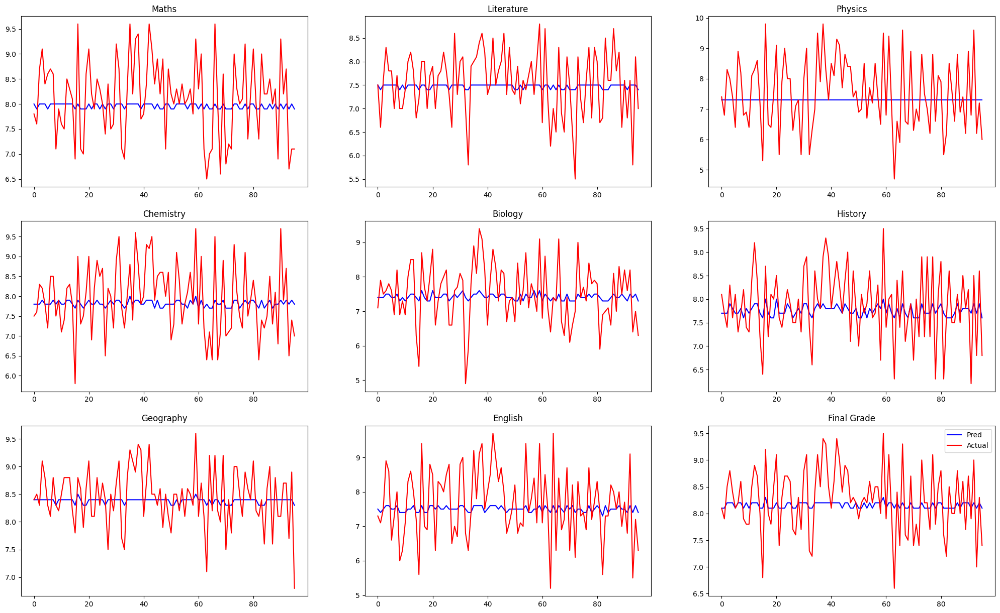

In [ ]:
draw(resultLars)

In [ ]:
Accuracy(resultLars)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.643750,7.933630,0.597292,0.772846,92.066370
1,Literature,0.548958,7.459729,0.449063,0.670121,92.540271
2,Physics,0.975000,13.062777,1.392708,1.180131,86.937223
3,Chemistry,0.673958,8.496596,0.681771,0.825694,91.503404
4,Biology,0.642708,8.756135,0.653229,0.808226,91.243865
5,History,0.538542,6.894244,0.455521,0.674923,93.105756
6,Geography,0.398958,4.753777,0.248646,0.498644,95.246223
7,English,0.785417,10.373605,0.928958,0.963825,89.626395
8,Grade,0.470833,5.717173,0.337917,0.581306,94.282827


In [ ]:
predModel(ypredLars)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,8.0,7.5,7.3,7.8,7.4,7.7,8.4,7.5,8.1,23.1,22.8,23.2,23.6,23.0,C00,Giỏi
1,7.9,7.4,7.3,7.8,7.4,7.7,8.4,7.4,8.1,23.0,22.6,23.1,23.5,22.7,C00,Giỏi
2,8.0,7.5,7.3,7.8,7.4,7.7,8.4,7.5,8.2,23.1,22.8,23.2,23.6,23.0,C00,Giỏi
3,8.0,7.5,7.3,7.9,7.5,7.9,8.4,7.6,8.2,23.2,22.9,23.4,23.8,23.1,C00,Giỏi
4,8.0,7.5,7.3,7.8,7.5,7.8,8.4,7.6,8.2,23.1,22.9,23.3,23.7,23.1,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.9,7.4,7.3,7.8,7.3,7.7,8.4,7.4,8.1,23.0,22.6,23.0,23.5,22.7,C00,Giỏi
92,8.0,7.5,7.3,7.9,7.5,7.9,8.4,7.6,8.2,23.2,22.9,23.4,23.8,23.1,C00,Giỏi
93,7.9,7.5,7.3,7.8,7.4,7.7,8.4,7.4,8.1,23.0,22.6,23.1,23.6,22.8,C00,Giỏi
94,8.0,7.5,7.3,7.9,7.5,7.9,8.4,7.6,8.2,23.2,22.9,23.4,23.8,23.1,C00,Giỏi


# Ridge

In [ ]:
from sklearn.linear_model import Ridge

modelRidgeGrade = Ridge(alpha=1.0).fit(xtrain, ytrainGrade)
modelRidgeMaths = Ridge(alpha=1.0).fit(xtrain, ytrainMaths)
modelRidgeLiterature = Ridge(alpha=1.0).fit(xtrain, ytrainLiterature)
modelRidgePhysics = Ridge(alpha=1.0).fit(xtrain, ytrainPhysics)
modelRidgeChemistry = Ridge(alpha=1.0).fit(xtrain, ytrainChemistry)
modelRidgeBiology = Ridge(alpha=1.0).fit(xtrain, ytrainBiology)
modelRidgeHistory = Ridge(alpha=1.0).fit(xtrain, ytrainHistory)
modelRidgeGeography = Ridge(alpha=1.0).fit(xtrain, ytrainGeography)
modelRidgeEnglish = Ridge(alpha=1.0).fit(xtrain, ytrainEnglish)
# modelRidgeCivic = Ridge(alpha=1.0).fit(xtrain, xtestCivic)

ypredRidgeGrade = modelRidgeGrade.predict(xtest).round(1)
ypredRidgeMaths = modelRidgeMaths.predict(xtest).round(1)
ypredRidgeLiterature = modelRidgeLiterature.predict(xtest).round(1)
ypredRidgePhysics = modelRidgePhysics.predict(xtest).round(1)
ypredRidgeChemistry = modelRidgeChemistry.predict(xtest).round(1)
ypredRidgeBiology = modelRidgeBiology.predict(xtest).round(1)
ypredRidgeHistory = modelRidgeHistory.predict(xtest).round(1)
ypredRidgeGeography = modelRidgeGeography.predict(xtest).round(1)
ypredRidgeEnglish = modelRidgeEnglish.predict(xtest).round(1)
# ypredRidgeCivic = modelRidgeCivic.predict(ytrain).round(1)

modelRidge = [modelRidgeGrade, modelRidgeMaths, modelRidgeLiterature, modelRidgePhysics, modelRidgeChemistry,
            modelRidgeBiology, modelRidgeHistory, modelRidgeGeography, modelRidgeEnglish] # modelRidgeCivic

ypredRidge = [ypredRidgeGrade, ypredRidgeMaths, ypredRidgeLiterature, ypredRidgePhysics, ypredRidgeChemistry,
         ypredRidgeBiology, ypredRidgeHistory, ypredRidgeGeography, ypredRidgeEnglish] #ypredRidgeCivic

In [ ]:
resultRidge = result(ytest, ypredRidge)
resultRidge

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.7,7.5,7.4,7.4,7.3,7.5,7.9,7.1,7.3,8.1,7.9,8.4,8.5,7.3,7.7,8.1,8.2
1,7.6,6.9,6.6,7.1,6.8,6.7,7.6,7.2,7.9,6.8,7.7,7.2,8.5,8.0,7.1,6.8,7.9,7.6
2,8.7,8.1,7.6,7.7,8.3,7.6,8.3,7.7,7.5,7.8,7.4,8.0,8.3,8.4,7.5,7.9,8.5,8.3
3,9.1,8.8,8.3,8.3,8.0,8.7,8.2,9.0,7.6,8.5,8.3,8.7,9.1,9.0,8.9,9.0,8.8,9.1
4,8.4,8.2,7.8,7.8,7.4,7.3,7.8,7.8,7.8,7.6,7.6,8.3,8.8,8.7,8.6,8.4,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,6.8,6.8,7.1,7.9,7.9,7.6,6.8,6.2,7.1,8.7,8.0,6.8,7.0,7.9,7.8
92,8.7,8.7,7.6,8.1,9.6,8.7,8.7,8.7,8.2,8.3,8.5,8.5,8.7,8.9,9.1,8.6,9.0,8.9
93,6.7,6.6,5.8,6.3,6.2,5.9,6.5,6.5,6.4,6.0,6.8,6.3,7.7,7.4,5.5,6.0,7.0,7.0
94,7.1,7.5,8.1,8.2,7.2,8.0,7.4,8.2,7.0,8.0,8.6,8.4,8.9,8.9,7.2,8.1,8.3,8.6


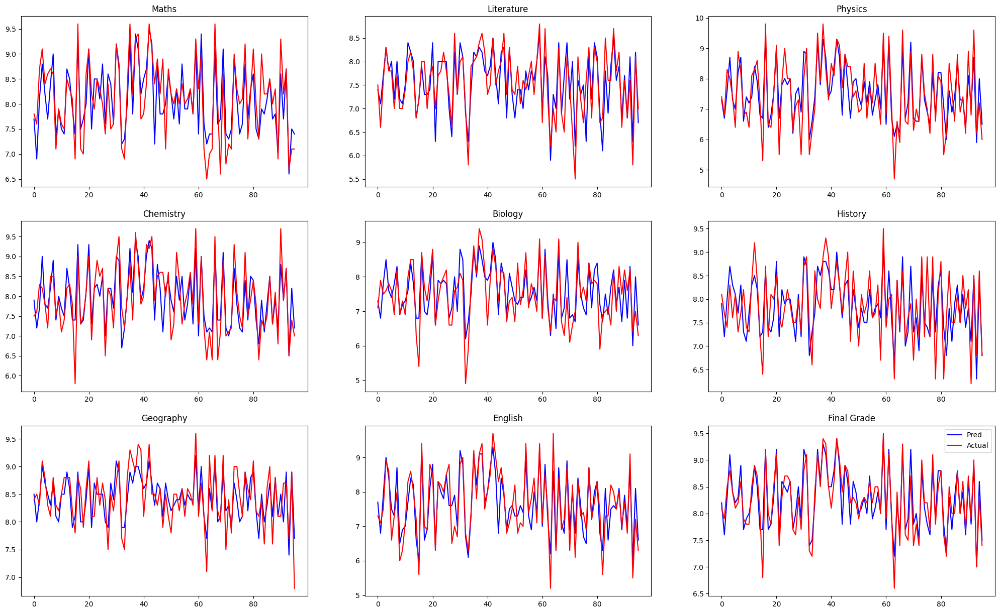

In [ ]:
draw(resultRidge)

In [ ]:
Accuracy(resultRidge)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.357292,4.481808,0.210729,0.459052,95.518192
1,Literature,0.316667,4.338106,0.176250,0.419821,95.661894
2,Physics,0.460417,6.447824,0.347917,0.589845,93.552176
3,Chemistry,0.359375,4.661898,0.229687,0.479257,95.338102
4,Biology,0.429167,6.003554,0.302292,0.549811,93.996446
5,History,0.379167,4.927413,0.230833,0.480451,95.072587
6,Geography,0.254167,3.052714,0.100000,0.316228,96.947286
7,English,0.375000,5.066657,0.236667,0.486484,94.933343
8,Grade,0.187500,2.325075,0.058542,0.241954,97.674925


In [ ]:
predModel(ypredRidge)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.7,7.4,7.3,7.9,7.3,7.9,8.5,7.7,8.2,22.9,22.7,22.9,23.8,22.8,C00,Giỏi
1,6.9,7.1,6.7,7.2,6.8,7.2,8.0,6.8,7.6,20.8,20.4,20.9,22.3,20.8,C00,Khá
2,8.1,7.7,7.6,7.7,7.8,8.0,8.4,7.9,8.3,23.4,23.6,23.6,24.1,23.7,C00,Giỏi
3,8.8,8.3,8.7,9.0,8.5,8.7,9.0,9.0,9.1,26.5,26.5,26.3,26.0,26.1,A00/A01,Xuất sắc
4,8.2,7.8,7.3,7.8,7.6,8.3,8.7,8.4,8.4,23.3,23.9,23.6,24.8,24.4,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,6.8,7.1,7.9,6.8,7.1,8.0,7.0,7.8,22.7,21.8,22.4,21.9,21.5,A00,Khá
92,8.7,8.1,8.7,8.7,8.3,8.5,8.9,8.6,8.9,26.1,26.0,25.7,25.5,25.4,A00,Giỏi
93,6.6,6.3,5.9,6.5,6.0,6.3,7.4,6.0,7.0,19.0,18.5,19.1,20.0,18.9,C00,Khá
94,7.5,8.2,8.0,8.2,8.0,8.4,8.9,8.1,8.6,23.7,23.6,23.7,25.5,23.8,C00,Giỏi


# TheilSen Regression

In [ ]:
from sklearn.linear_model import TheilSenRegressor

modelTheilSenGrade = TheilSenRegressor(random_state=0).fit(xtrain, ytrainGrade)
modelTheilSenMaths = TheilSenRegressor(random_state=0).fit(xtrain, ytrainMaths)
modelTheilSenLiterature = TheilSenRegressor(random_state=0).fit(xtrain, ytrainLiterature)
modelTheilSenPhysics = TheilSenRegressor(random_state=0).fit(xtrain, ytrainPhysics)
modelTheilSenChemistry = TheilSenRegressor(random_state=0).fit(xtrain, ytrainChemistry)
modelTheilSenBiology = TheilSenRegressor(random_state=0).fit(xtrain, ytrainBiology)
modelTheilSenHistory = TheilSenRegressor(random_state=0).fit(xtrain, ytrainHistory)
modelTheilSenGeography = TheilSenRegressor(random_state=0).fit(xtrain, ytrainGeography)
modelTheilSenEnglish = TheilSenRegressor(random_state=0).fit(xtrain, ytrainEnglish)
# modelTheilSenCivic = TheilSenRegressor(random_state=0).fit(xtrain, xtestCivic)

ypredTheilSenGrade = modelTheilSenGrade.predict(xtest).round(1)
ypredTheilSenMaths = modelTheilSenMaths.predict(xtest).round(1)
ypredTheilSenLiterature = modelTheilSenLiterature.predict(xtest).round(1)
ypredTheilSenPhysics = modelTheilSenPhysics.predict(xtest).round(1)
ypredTheilSenChemistry = modelTheilSenChemistry.predict(xtest).round(1)
ypredTheilSenBiology = modelTheilSenBiology.predict(xtest).round(1)
ypredTheilSenHistory = modelTheilSenHistory.predict(xtest).round(1)
ypredTheilSenGeography = modelTheilSenGeography.predict(xtest).round(1)
ypredTheilSenEnglish = modelTheilSenEnglish.predict(xtest).round(1)
# ypredTheilSenCivic = modelTheilSenCivic.predict(ytrain).round(1)

modelTheilSen = [modelTheilSenGrade, modelTheilSenMaths, modelTheilSenLiterature, modelTheilSenPhysics, modelTheilSenChemistry,
            modelTheilSenBiology, modelTheilSenHistory, modelTheilSenGeography, modelTheilSenEnglish] # modelTheilSenCivic

ypredTheilSen = [ypredTheilSenGrade, ypredTheilSenMaths, ypredTheilSenLiterature, ypredTheilSenPhysics, ypredTheilSenChemistry,
         ypredTheilSenBiology, ypredTheilSenHistory, ypredTheilSenGeography, ypredTheilSenEnglish] #ypredTheilSenCivic

In [ ]:
resultTheilSen = result(ytest, ypredTheilSen)
resultTheilSen

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.6,7.5,7.5,7.4,7.3,7.5,7.9,7.1,7.5,8.1,7.9,8.4,8.5,7.3,7.7,8.1,8.2
1,7.6,6.9,6.6,7.2,6.8,6.6,7.6,7.3,7.9,6.8,7.7,7.1,8.5,8.0,7.1,6.8,7.9,7.6
2,8.7,8.1,7.6,7.6,8.3,7.6,8.3,7.7,7.5,7.7,7.4,8.0,8.3,8.3,7.5,7.9,8.5,8.3
3,9.1,8.9,8.3,8.2,8.0,8.8,8.2,9.1,7.6,8.6,8.3,8.8,9.1,9.1,8.9,9.0,8.8,9.1
4,8.4,8.1,7.8,7.9,7.4,7.3,7.8,7.7,7.8,7.7,7.6,8.2,8.8,8.6,8.6,8.3,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.6,6.8,6.8,6.8,7.3,7.9,8.0,7.6,6.7,6.2,7.0,8.7,8.0,6.8,7.0,7.9,7.8
92,8.7,8.8,7.6,8.0,9.6,8.7,8.7,8.7,8.2,8.3,8.5,8.5,8.7,8.9,9.1,8.6,9.0,8.9
93,6.7,6.6,5.8,6.3,6.2,5.8,6.5,6.4,6.4,5.8,6.8,6.2,7.7,7.4,5.5,6.0,7.0,6.9
94,7.1,7.5,8.1,8.3,7.2,7.8,7.4,8.3,7.0,8.0,8.6,8.4,8.9,8.9,7.2,8.1,8.3,8.6


In [ ]:
Accuracy(resultTheilSen)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.346875,4.350988,0.204687,0.452424,95.649012
1,Literature,0.327083,4.481622,0.179167,0.423281,95.518378
2,Physics,0.469792,6.585093,0.360938,0.600781,93.414907
3,Chemistry,0.367708,4.783541,0.248854,0.498853,95.216459
4,Biology,0.434375,6.091735,0.308437,0.555371,93.908265
5,History,0.389583,5.060067,0.235833,0.485627,94.939933
6,Geography,0.258333,3.116528,0.106875,0.326917,96.883472
7,English,0.367708,4.961854,0.229479,0.479040,95.038146
8,Grade,0.192708,2.389519,0.060521,0.246010,97.610481


In [ ]:
predModel(ypredTheilSen)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.6,7.5,7.3,7.9,7.5,7.9,8.5,7.7,8.2,22.8,22.6,23.0,23.9,22.8,C00,Giỏi
1,6.9,7.2,6.6,7.3,6.8,7.1,8.0,6.8,7.6,20.8,20.3,21.0,22.3,20.9,C00,Khá
2,8.1,7.6,7.6,7.7,7.7,8.0,8.3,7.9,8.3,23.4,23.6,23.5,23.9,23.6,C00,Giỏi
3,8.9,8.2,8.8,9.1,8.6,8.8,9.1,9.0,9.1,26.8,26.7,26.6,26.1,26.1,A00,Xuất sắc
4,8.1,7.9,7.3,7.7,7.7,8.2,8.6,8.3,8.4,23.1,23.7,23.5,24.7,24.3,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.6,6.8,7.3,8.0,6.7,7.0,8.0,7.0,7.8,22.9,21.9,22.3,21.8,21.4,A00,Khá
92,8.8,8.0,8.7,8.7,8.3,8.5,8.9,8.6,8.9,26.2,26.1,25.8,25.4,25.4,A00,Giỏi
93,6.6,6.3,5.8,6.4,5.8,6.2,7.4,6.0,6.9,18.8,18.4,18.8,19.9,18.9,C00,Trung bình khá
94,7.5,8.3,7.8,8.3,8.0,8.4,8.9,8.1,8.6,23.6,23.4,23.8,25.6,23.9,C00,Giỏi


# KernelRidge

In [ ]:
from sklearn.kernel_ridge import KernelRidge

modelKernelRidgeGrade = KernelRidge(alpha=1.0).fit(xtrain, ytrainGrade)
modelKernelRidgeMaths = KernelRidge(alpha=1.0).fit(xtrain, ytrainMaths)
modelKernelRidgeLiterature = KernelRidge(alpha=1.0).fit(xtrain, ytrainLiterature)
modelKernelRidgePhysics = KernelRidge(alpha=1.0).fit(xtrain, ytrainPhysics)
modelKernelRidgeChemistry = KernelRidge(alpha=1.0).fit(xtrain, ytrainChemistry)
modelKernelRidgeBiology = KernelRidge(alpha=1.0).fit(xtrain, ytrainBiology)
modelKernelRidgeHistory = KernelRidge(alpha=1.0).fit(xtrain, ytrainHistory)
modelKernelRidgeGeography = KernelRidge(alpha=1.0).fit(xtrain, ytrainGeography)
modelKernelRidgeEnglish = KernelRidge(alpha=1.0).fit(xtrain, ytrainEnglish)
# modelKernelRidgeCivic = KernelRidge(alpha=1.0).fit(xtrain, xtestCivic)

ypredKernelRidgeGrade = modelKernelRidgeGrade.predict(xtest).round(1)
ypredKernelRidgeMaths = modelKernelRidgeMaths.predict(xtest).round(1)
ypredKernelRidgeLiterature = modelKernelRidgeLiterature.predict(xtest).round(1)
ypredKernelRidgePhysics = modelKernelRidgePhysics.predict(xtest).round(1)
ypredKernelRidgeChemistry = modelKernelRidgeChemistry.predict(xtest).round(1)
ypredKernelRidgeBiology = modelKernelRidgeBiology.predict(xtest).round(1)
ypredKernelRidgeHistory = modelKernelRidgeHistory.predict(xtest).round(1)
ypredKernelRidgeGeography = modelKernelRidgeGeography.predict(xtest).round(1)
ypredKernelRidgeEnglish = modelKernelRidgeEnglish.predict(xtest).round(1)
# ypredKernelRidgeCivic = modelKernelRidgeCivic.predict(ytrain).round(1)

modelKernelRidge = [modelKernelRidgeGrade, modelKernelRidgeMaths, modelKernelRidgeLiterature, modelKernelRidgePhysics, modelKernelRidgeChemistry,
            modelKernelRidgeBiology, modelKernelRidgeHistory, modelKernelRidgeGeography, modelKernelRidgeEnglish] # modelKernelRidgeCivic

ypredKernelRidge = [ypredKernelRidgeGrade, ypredKernelRidgeMaths, ypredKernelRidgeLiterature, ypredKernelRidgePhysics, ypredKernelRidgeChemistry,
         ypredKernelRidgeBiology, ypredKernelRidgeHistory, ypredKernelRidgeGeography, ypredKernelRidgeEnglish] #ypredKernelRidgeCivic

In [ ]:
resultKernelRidge = result(ytest, ypredKernelRidge)
resultKernelRidge

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.6,7.5,7.4,7.4,7.3,7.5,7.8,7.1,7.3,8.1,7.8,8.4,8.3,7.3,7.7,8.1,8.1
1,7.6,6.7,6.6,7.0,6.8,6.7,7.6,7.1,7.9,6.7,7.7,7.1,8.5,7.7,7.1,6.8,7.9,7.4
2,8.7,8.4,7.6,7.9,8.3,7.7,8.3,7.9,7.5,8.0,7.4,8.3,8.3,8.8,7.5,8.0,8.5,8.6
3,9.1,9.4,8.3,8.6,8.0,8.9,8.2,9.4,7.6,8.8,8.3,9.2,9.1,9.9,8.9,9.2,8.8,9.7
4,8.4,8.4,7.8,7.9,7.4,7.4,7.8,8.0,7.8,7.7,7.6,8.4,8.8,9.0,8.6,8.4,8.4,8.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.5,6.8,6.7,6.8,7.1,7.9,7.7,7.6,6.6,6.2,6.8,8.7,7.6,6.8,7.0,7.9,7.6
92,8.7,8.9,7.6,8.2,9.6,8.7,8.7,8.9,8.2,8.4,8.5,8.7,8.7,9.3,9.1,8.7,9.0,9.1
93,6.7,6.0,5.8,6.0,6.2,5.7,6.5,6.0,6.4,5.7,6.8,5.8,7.7,6.4,5.5,5.9,7.0,6.3
94,7.1,8.1,8.1,8.5,7.2,8.2,7.4,8.7,7.0,8.3,8.6,8.8,8.9,9.7,7.2,8.2,8.3,9.2


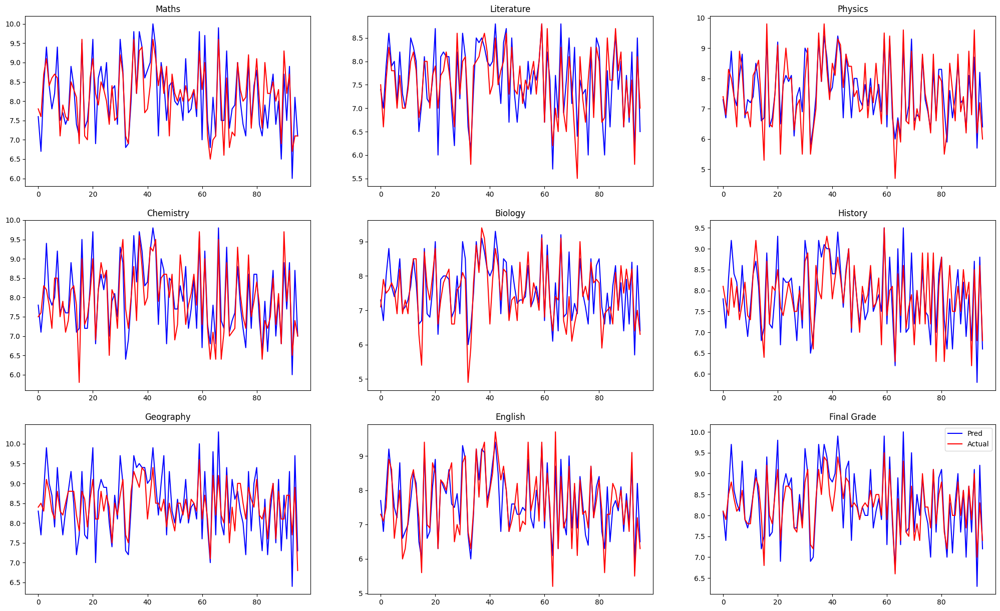

In [ ]:
draw(resultKernelRidge)

In [ ]:
Accuracy(resultKernelRidge)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.450000,5.629486,0.331042,0.575362,94.370514
1,Literature,0.373958,5.081553,0.238854,0.488727,94.918447
2,Physics,0.446875,6.224959,0.339063,0.582291,93.775041
3,Chemistry,0.439583,5.660465,0.310417,0.557150,94.339535
4,Biology,0.459375,6.379988,0.341146,0.584077,93.620012
5,History,0.439583,5.691737,0.310208,0.556963,94.308263
6,Geography,0.446875,5.302739,0.291354,0.539772,94.697261
7,English,0.385417,5.201500,0.243542,0.493499,94.798500
8,Grade,0.331250,4.028946,0.176042,0.419573,95.971054


In [ ]:
predModel(ypredKernelRidge)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.6,7.4,7.3,7.8,7.3,7.8,8.3,7.7,8.1,22.7,22.6,22.7,23.5,22.7,C00,Giỏi
1,6.7,7.0,6.7,7.1,6.7,7.1,7.7,6.8,7.4,20.5,20.2,20.5,21.8,20.5,C00,Khá
2,8.4,7.9,7.7,7.9,8.0,8.3,8.8,8.0,8.6,24.0,24.1,24.3,25.0,24.3,C00,Giỏi
3,9.4,8.6,8.9,9.4,8.8,9.2,9.9,9.2,9.7,27.7,27.5,27.6,27.7,27.2,A00/C00,Xuất sắc
4,8.4,7.9,7.4,8.0,7.7,8.4,9.0,8.4,8.6,23.8,24.2,24.1,25.3,24.7,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.5,6.7,7.1,7.7,6.6,6.8,7.6,7.0,7.6,22.3,21.6,21.8,21.1,21.2,A00,Khá
92,8.9,8.2,8.7,8.9,8.4,8.7,9.3,8.7,9.1,26.5,26.3,26.2,26.2,25.8,A00,Xuất sắc
93,6.0,6.0,5.7,6.0,5.7,5.8,6.4,5.9,6.3,17.7,17.6,17.7,18.2,17.9,C00,Trung bình khá
94,8.1,8.5,8.2,8.7,8.3,8.8,9.7,8.2,9.2,25.0,24.5,25.1,27.0,24.8,C00,Xuất sắc


# NuSVR

In [ ]:
from sklearn.svm import NuSVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

modelNuSVRGrade = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, ytrainGrade)
modelNuSVRMaths = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, ytrainMaths)
modelNuSVRLiterature = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, ytrainLiterature)
modelNuSVRPhysics = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, ytrainPhysics)
modelNuSVRChemistry = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, ytrainChemistry)
modelNuSVRBiology = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, ytrainBiology)
modelNuSVRHistory = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, ytrainHistory)
modelNuSVRGeography = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, ytrainGeography)
modelNuSVREnglish = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, ytrainEnglish)
# modelNuSVRCivic = make_pipeline(StandardScaler(), NuSVR(C=1.0, nu=0.1)).fit(xtrain, xtestCivic)

ypredNuSVRGrade = modelNuSVRGrade.predict(xtest).round(1)
ypredNuSVRMaths = modelNuSVRMaths.predict(xtest).round(1)
ypredNuSVRLiterature = modelNuSVRLiterature.predict(xtest).round(1)
ypredNuSVRPhysics = modelNuSVRPhysics.predict(xtest).round(1)
ypredNuSVRChemistry = modelNuSVRChemistry.predict(xtest).round(1)
ypredNuSVRBiology = modelNuSVRBiology.predict(xtest).round(1)
ypredNuSVRHistory = modelNuSVRHistory.predict(xtest).round(1)
ypredNuSVRGeography = modelNuSVRGeography.predict(xtest).round(1)
ypredNuSVREnglish = modelNuSVREnglish.predict(xtest).round(1)
# ypredNuSVRCivic = modelNuSVRCivic.predict(ytrain).round(1)

modelNuSVR = [modelNuSVRGrade, modelNuSVRMaths, modelNuSVRLiterature, modelNuSVRPhysics, modelNuSVRChemistry,
            modelNuSVRBiology, modelNuSVRHistory, modelNuSVRGeography, modelNuSVREnglish] # modelNuSVRCivic

ypredNuSVR = [ypredNuSVRGrade, ypredNuSVRMaths, ypredNuSVRLiterature, ypredNuSVRPhysics, ypredNuSVRChemistry,
         ypredNuSVRBiology, ypredNuSVRHistory, ypredNuSVRGeography, ypredNuSVREnglish] #ypredNuSVRCivic

In [ ]:
resultNuSVR = result(ytest, ypredNuSVR)
resultNuSVR

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.9,7.5,7.7,7.4,7.4,7.5,7.9,7.1,7.4,8.1,7.8,8.4,8.6,7.3,7.8,8.1,8.3
1,7.6,7.0,6.6,7.1,6.8,6.4,7.6,6.8,7.9,6.6,7.7,7.1,8.5,7.8,7.1,6.7,7.9,7.6
2,8.7,8.3,7.6,7.8,8.3,7.7,8.3,8.1,7.5,7.7,7.4,8.0,8.3,8.6,7.5,8.0,8.5,8.5
3,9.1,8.8,8.3,8.2,8.0,8.7,8.2,8.8,7.6,8.5,8.3,8.6,9.1,9.0,8.9,8.7,8.8,9.0
4,8.4,8.1,7.8,7.9,7.4,7.3,7.8,7.8,7.8,7.4,7.6,8.2,8.8,8.7,8.6,8.2,8.4,8.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,7.1,6.8,7.1,7.9,7.8,7.6,7.1,6.2,7.1,8.7,8.2,6.8,7.2,7.9,7.9
92,8.7,8.8,7.6,8.0,9.6,8.7,8.7,8.7,8.2,8.4,8.5,8.6,8.7,8.9,9.1,8.6,9.0,8.9
93,6.7,6.6,5.8,6.4,6.2,5.9,6.5,6.4,6.4,6.0,6.8,6.4,7.7,7.5,5.5,6.1,7.0,6.9
94,7.1,8.1,8.1,8.0,7.2,7.8,7.4,8.1,7.0,7.8,8.6,8.4,8.9,8.6,7.2,8.2,8.3,8.5


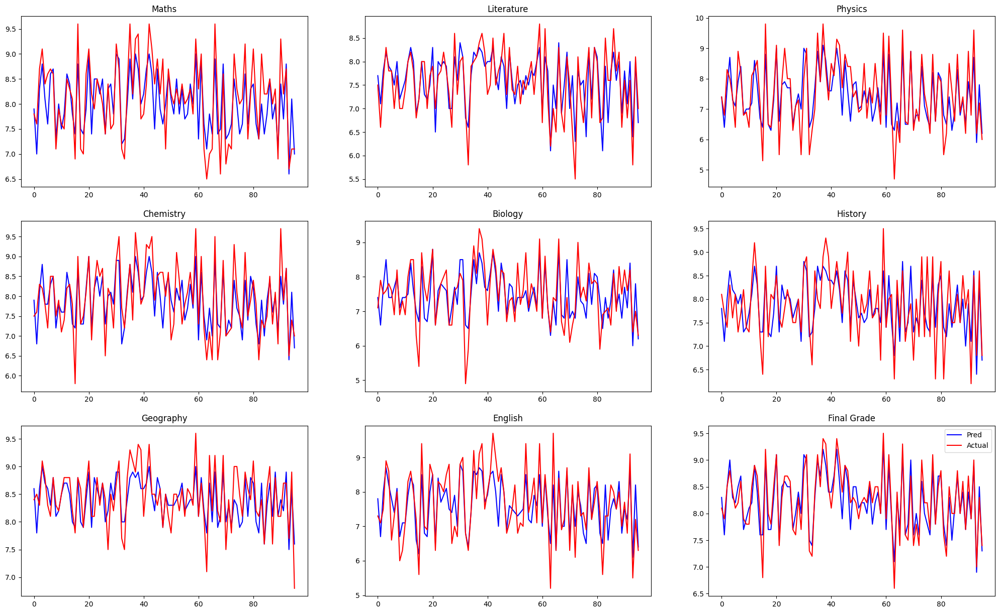

In [ ]:
draw(resultNuSVR)

In [ ]:
Accuracy(resultNuSVR)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.392708,4.858600,0.238437,0.488301,95.141400
1,Literature,0.330208,4.544626,0.175937,0.419449,95.455374
2,Physics,0.489583,6.686056,0.406667,0.637704,93.313944
3,Chemistry,0.383333,4.917432,0.250833,0.500833,95.082568
4,Biology,0.438542,6.053102,0.310104,0.556870,93.946898
5,History,0.390625,5.062100,0.240104,0.490004,94.937900
6,Geography,0.265625,3.169852,0.114271,0.338040,96.830148
7,English,0.436458,5.809717,0.320104,0.565777,94.190283
8,Grade,0.197917,2.430213,0.058958,0.242813,97.569787


In [ ]:
predModel(ypredNuSVR)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.9,7.7,7.4,7.9,7.4,7.8,8.6,7.8,8.3,23.2,23.1,23.2,24.1,23.4,C00,Giỏi
1,7.0,7.1,6.4,6.8,6.6,7.1,7.8,6.7,7.6,20.2,20.1,20.4,22.0,20.8,C00,Khá
2,8.3,7.8,7.7,8.1,7.7,8.0,8.6,8.0,8.5,24.1,24.0,24.1,24.4,24.1,C00,Giỏi
3,8.8,8.2,8.7,8.8,8.5,8.6,9.0,8.7,9.0,26.3,26.2,26.1,25.8,25.7,A00,Xuất sắc
4,8.1,7.9,7.3,7.8,7.4,8.2,8.7,8.2,8.3,23.2,23.6,23.3,24.8,24.2,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,7.1,7.1,7.8,7.1,7.1,8.2,7.2,7.9,22.6,22.0,22.6,22.4,22.0,A00/B00,Khá
92,8.8,8.0,8.7,8.7,8.4,8.6,8.9,8.6,8.9,26.2,26.1,25.9,25.5,25.4,A00,Giỏi
93,6.6,6.4,5.9,6.4,6.0,6.4,7.5,6.1,6.9,18.9,18.6,19.0,20.3,19.1,C00,Trung bình khá
94,8.1,8.0,7.8,8.1,7.8,8.4,8.6,8.2,8.5,24.0,24.1,24.0,25.0,24.3,C00,Giỏi


# LinearSVR

In [ ]:
from sklearn.svm import LinearSVR
from sklearn.preprocessing import StandardScaler

modelLinearSVRGrade = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, ytrainGrade)
modelLinearSVRMaths = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, ytrainMaths)
modelLinearSVRLiterature = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, ytrainLiterature)
modelLinearSVRPhysics = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, ytrainPhysics)
modelLinearSVRChemistry = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, ytrainChemistry)
modelLinearSVRBiology = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, ytrainBiology)
modelLinearSVRHistory = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, ytrainHistory)
modelLinearSVRGeography = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, ytrainGeography)
modelLinearSVREnglish = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, ytrainEnglish)
# modelLinearSVRCivic = make_pipeline(StandardScaler(), LinearSVR(random_state=0, tol=1e-5)).fit(xtrain, xtestCivic)

ypredLinearSVRGrade = modelLinearSVRGrade.predict(xtest).round(1)
ypredLinearSVRMaths = modelLinearSVRMaths.predict(xtest).round(1)
ypredLinearSVRLiterature = modelLinearSVRLiterature.predict(xtest).round(1)
ypredLinearSVRPhysics = modelLinearSVRPhysics.predict(xtest).round(1)
ypredLinearSVRChemistry = modelLinearSVRChemistry.predict(xtest).round(1)
ypredLinearSVRBiology = modelLinearSVRBiology.predict(xtest).round(1)
ypredLinearSVRHistory = modelLinearSVRHistory.predict(xtest).round(1)
ypredLinearSVRGeography = modelLinearSVRGeography.predict(xtest).round(1)
ypredLinearSVREnglish = modelLinearSVREnglish.predict(xtest).round(1)
# ypredLinearSVRCivic = modelLinearSVRCivic.predict(ytrain).round(1)

modelLinearSVR = [modelLinearSVRGrade, modelLinearSVRMaths, modelLinearSVRLiterature, modelLinearSVRPhysics, modelLinearSVRChemistry,
            modelLinearSVRBiology, modelLinearSVRHistory, modelLinearSVRGeography, modelLinearSVREnglish] # modelLinearSVRCivic

ypredLinearSVR = [ypredLinearSVRGrade, ypredLinearSVRMaths, ypredLinearSVRLiterature, ypredLinearSVRPhysics, ypredLinearSVRChemistry,
         ypredLinearSVRBiology, ypredLinearSVRHistory, ypredLinearSVRGeography, ypredLinearSVREnglish] #ypredLinearSVRCivic

In [ ]:
resultLinearSVR = result(ytest, ypredLinearSVR)
resultLinearSVR

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.6,7.5,7.4,7.4,7.3,7.5,7.9,7.1,7.3,8.1,8.1,8.4,8.4,7.3,7.6,8.1,8.2
1,7.6,7.0,6.6,7.2,6.8,6.7,7.6,7.4,7.9,6.7,7.7,7.2,8.5,8.0,7.1,6.8,7.9,7.6
2,8.7,8.1,7.6,7.8,8.3,7.5,8.3,7.6,7.5,8.1,7.4,8.0,8.3,8.4,7.5,7.7,8.5,8.4
3,9.1,8.8,8.3,8.2,8.0,8.5,8.2,9.1,7.6,8.6,8.3,8.7,9.1,9.1,8.9,8.9,8.8,9.1
4,8.4,8.3,7.8,7.7,7.4,7.2,7.8,7.8,7.8,7.6,7.6,8.3,8.8,8.7,8.6,8.3,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.8,6.8,6.9,6.8,7.2,7.9,8.0,7.6,6.7,6.2,7.2,8.7,8.1,6.8,6.9,7.9,7.9
92,8.7,8.7,7.6,8.1,9.6,8.4,8.7,8.7,8.2,8.4,8.5,8.5,8.7,9.0,9.1,8.6,9.0,8.9
93,6.7,6.8,5.8,6.4,6.2,5.8,6.5,6.5,6.4,5.9,6.8,6.4,7.7,7.4,5.5,5.9,7.0,7.1
94,7.1,7.5,8.1,8.3,7.2,7.7,7.4,8.1,7.0,7.8,8.6,8.4,8.9,8.9,7.2,8.0,8.3,8.5


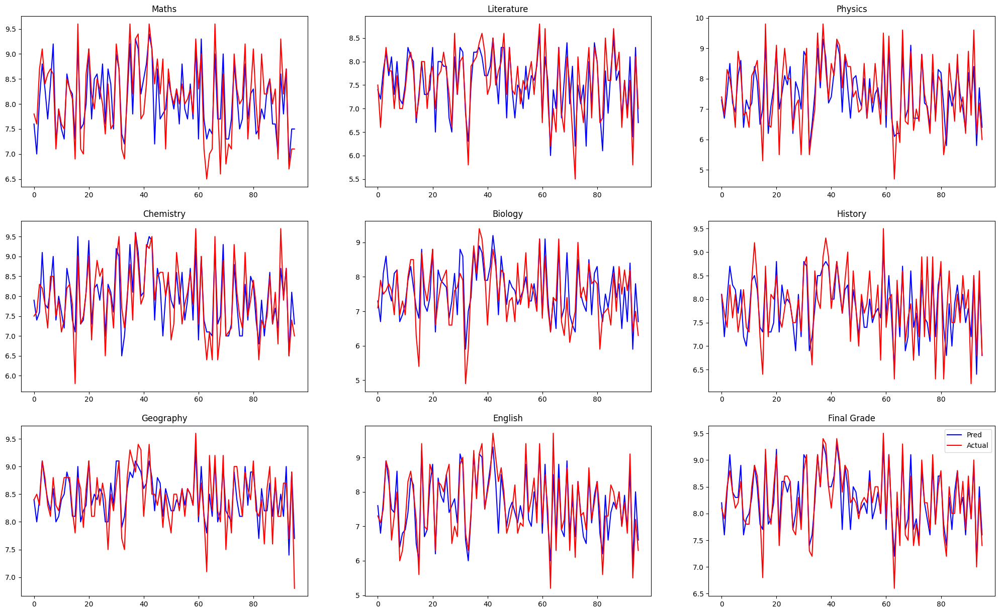

In [ ]:
draw(resultLinearSVR)

In [ ]:
Accuracy(resultLinearSVR)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.369792,4.631804,0.220938,0.470040,95.368196
1,Literature,0.331250,4.517810,0.181042,0.425490,95.482190
2,Physics,0.493750,6.889056,0.387708,0.622662,93.110944
3,Chemistry,0.365625,4.721002,0.235521,0.485305,95.278998
4,Biology,0.478125,6.662772,0.357812,0.598174,93.337228
5,History,0.379167,4.929025,0.227708,0.477188,95.070975
6,Geography,0.259375,3.132156,0.105104,0.324198,96.867844
7,English,0.375000,5.019690,0.233750,0.483477,94.980310
8,Grade,0.190625,2.363088,0.060312,0.245586,97.636912


In [ ]:
predModel(ypredLinearSVR)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.6,7.4,7.3,7.9,7.3,8.1,8.4,7.6,8.2,22.8,22.5,22.8,23.9,22.6,C00,Giỏi
1,7.0,7.2,6.7,7.4,6.7,7.2,8.0,6.8,7.6,21.1,20.5,21.1,22.4,21.0,C00,Khá
2,8.1,7.8,7.5,7.6,8.1,8.0,8.4,7.7,8.4,23.2,23.3,23.8,24.2,23.6,C00,Giỏi
3,8.8,8.2,8.5,9.1,8.6,8.7,9.1,8.9,9.1,26.4,26.2,26.5,26.0,25.9,B00,Xuất sắc
4,8.3,7.7,7.2,7.8,7.6,8.3,8.7,8.3,8.4,23.3,23.8,23.7,24.7,24.3,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.8,6.9,7.2,8.0,6.7,7.2,8.1,6.9,7.9,23.0,21.9,22.5,22.2,21.6,A00,Khá
92,8.7,8.1,8.4,8.7,8.4,8.5,9.0,8.6,8.9,25.8,25.7,25.8,25.6,25.4,A00/B00,Giỏi
93,6.8,6.4,5.8,6.5,5.9,6.4,7.4,5.9,7.1,19.1,18.5,19.2,20.2,19.1,C00,Khá
94,7.5,8.3,7.7,8.1,7.8,8.4,8.9,8.0,8.5,23.3,23.2,23.4,25.6,23.8,C00,Giỏi


# AdaBoost

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.datasets import make_regression

modelAdaBoostGrade = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, ytrainGrade)
modelAdaBoostMaths = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, ytrainMaths)
modelAdaBoostLiterature = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, ytrainLiterature)
modelAdaBoostPhysics = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, ytrainPhysics)
modelAdaBoostChemistry = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, ytrainChemistry)
modelAdaBoostBiology = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, ytrainBiology)
modelAdaBoostHistory = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, ytrainHistory)
modelAdaBoostGeography = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, ytrainGeography)
modelAdaBoostEnglish = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, ytrainEnglish)
# modelAdaBoostCivic = AdaBoostRegressor(random_state=0, n_estimators=100).fit(xtrain, xtestCivic)

ypredAdaBoostGrade = modelAdaBoostGrade.predict(xtest).round(1)
ypredAdaBoostMaths = modelAdaBoostMaths.predict(xtest).round(1)
ypredAdaBoostLiterature = modelAdaBoostLiterature.predict(xtest).round(1)
ypredAdaBoostPhysics = modelAdaBoostPhysics.predict(xtest).round(1)
ypredAdaBoostChemistry = modelAdaBoostChemistry.predict(xtest).round(1)
ypredAdaBoostBiology = modelAdaBoostBiology.predict(xtest).round(1)
ypredAdaBoostHistory = modelAdaBoostHistory.predict(xtest).round(1)
ypredAdaBoostGeography = modelAdaBoostGeography.predict(xtest).round(1)
ypredAdaBoostEnglish = modelAdaBoostEnglish.predict(xtest).round(1)
# ypredAdaBoostCivic = modelAdaBoostCivic.predict(ytrain).round(1)

modelAdaBoost = [modelAdaBoostGrade, modelAdaBoostMaths, modelAdaBoostLiterature, modelAdaBoostPhysics, modelAdaBoostChemistry,
            modelAdaBoostBiology, modelAdaBoostHistory, modelAdaBoostGeography, modelAdaBoostEnglish] # modelAdaBoostCivic

ypredAdaBoost = [ypredAdaBoostGrade, ypredAdaBoostMaths, ypredAdaBoostLiterature, ypredAdaBoostPhysics, ypredAdaBoostChemistry,
         ypredAdaBoostBiology, ypredAdaBoostHistory, ypredAdaBoostGeography, ypredAdaBoostEnglish] #ypredAdaBoostCivic

In [ ]:
resultAdaBoost = result(ytest, ypredAdaBoost)
resultAdaBoost

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.9,7.5,7.4,7.4,7.4,7.5,8.0,7.1,7.3,8.1,7.9,8.4,8.5,7.3,7.8,8.1,8.2
1,7.6,7.0,6.6,7.1,6.8,6.7,7.6,7.3,7.9,6.7,7.7,7.2,8.5,7.9,7.1,6.7,7.9,7.7
2,8.7,8.3,7.6,7.8,8.3,7.8,8.3,8.1,7.5,7.5,7.4,7.9,8.3,8.5,7.5,8.0,8.5,8.3
3,9.1,8.8,8.3,8.2,8.0,8.6,8.2,8.8,7.6,8.4,8.3,8.7,9.1,9.1,8.9,8.6,8.8,8.9
4,8.4,8.4,7.8,8.0,7.4,7.3,7.8,8.1,7.8,7.7,7.6,8.4,8.8,8.7,8.6,8.3,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,7.3,6.8,7.1,7.9,8.0,7.6,7.2,6.2,7.0,8.7,8.1,6.8,7.0,7.9,7.9
92,8.7,8.8,7.6,8.1,9.6,8.5,8.7,8.7,8.2,8.3,8.5,8.6,8.7,8.9,9.1,8.8,9.0,8.9
93,6.7,6.4,5.8,6.2,6.2,5.7,6.5,6.4,6.4,6.0,6.8,6.4,7.7,7.6,5.5,6.0,7.0,6.9
94,7.1,7.6,8.1,8.3,7.2,8.1,7.4,8.4,7.0,8.0,8.6,8.6,8.9,8.9,7.2,8.0,8.3,8.8


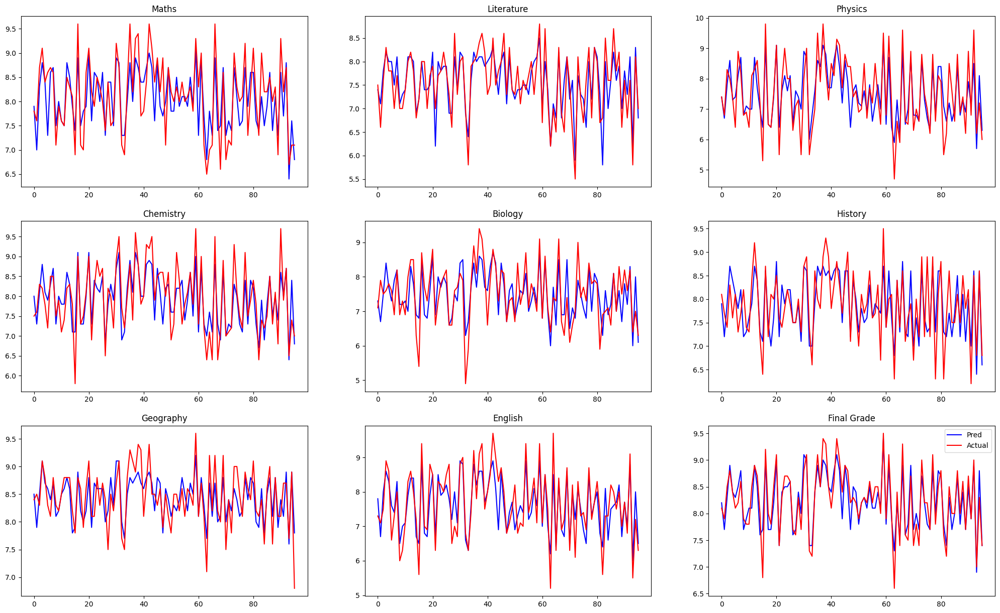

In [ ]:
draw(resultAdaBoost)

In [ ]:
Accuracy(resultAdaBoost)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.396875,4.936114,0.237396,0.487233,95.063886
1,Literature,0.307292,4.188721,0.155729,0.394625,95.811279
2,Physics,0.504167,6.880434,0.407083,0.638031,93.119566
3,Chemistry,0.378125,4.852217,0.234479,0.484230,95.147783
4,Biology,0.434375,5.998207,0.308021,0.554996,94.001793
5,History,0.381250,4.929128,0.233750,0.483477,95.070872
6,Geography,0.270833,3.240976,0.109375,0.330719,96.759024
7,English,0.408333,5.477728,0.268542,0.518210,94.522272
8,Grade,0.191667,2.349718,0.061458,0.247908,97.650282


In [ ]:
predModel(ypredAdaBoost)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.9,7.4,7.4,8.0,7.3,7.9,8.5,7.8,8.2,23.3,23.1,23.2,23.8,23.1,C00,Giỏi
1,7.0,7.1,6.7,7.3,6.7,7.2,7.9,6.7,7.7,21.0,20.4,21.0,22.2,20.8,C00,Khá
2,8.3,7.8,7.8,8.1,7.5,7.9,8.5,8.0,8.3,24.2,24.1,23.9,24.2,24.1,A00/C00,Giỏi
3,8.8,8.2,8.6,8.8,8.4,8.7,9.1,8.6,8.9,26.2,26.0,26.0,26.0,25.6,A00,Giỏi
4,8.4,8.0,7.3,8.1,7.7,8.4,8.7,8.3,8.4,23.8,24.0,24.2,25.1,24.7,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,7.3,7.1,8.0,7.2,7.0,8.1,7.0,7.9,22.8,21.8,22.9,22.4,22.0,B00,Khá
92,8.8,8.1,8.5,8.7,8.3,8.6,8.9,8.8,8.9,26.0,26.1,25.8,25.6,25.7,A01,Giỏi
93,6.4,6.2,5.7,6.4,6.0,6.4,7.6,6.0,6.9,18.5,18.1,18.8,20.2,18.6,C00,Trung bình khá
94,7.6,8.3,8.1,8.4,8.0,8.6,8.9,8.0,8.8,24.1,23.7,24.0,25.8,23.9,C00,Giỏi


# Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

modelGradientBoostingGrade = GradientBoostingRegressor(random_state=0).fit(xtrain, ytrainGrade)
modelGradientBoostingMaths = GradientBoostingRegressor(random_state=0).fit(xtrain, ytrainMaths)
modelGradientBoostingLiterature = GradientBoostingRegressor(random_state=0).fit(xtrain, ytrainLiterature)
modelGradientBoostingPhysics = GradientBoostingRegressor(random_state=0).fit(xtrain, ytrainPhysics)
modelGradientBoostingChemistry = GradientBoostingRegressor(random_state=0).fit(xtrain, ytrainChemistry)
modelGradientBoostingBiology = GradientBoostingRegressor(random_state=0).fit(xtrain, ytrainBiology)
modelGradientBoostingHistory = GradientBoostingRegressor(random_state=0).fit(xtrain, ytrainHistory)
modelGradientBoostingGeography = GradientBoostingRegressor(random_state=0).fit(xtrain, ytrainGeography)
modelGradientBoostingEnglish = GradientBoostingRegressor(random_state=0).fit(xtrain, ytrainEnglish)
# modelGradientBoostingCivic = GradientBoostingRegressor(random_state=0).fit(xtrain, xtestCivic)

ypredGradientBoostingGrade = modelGradientBoostingGrade.predict(xtest).round(1)
ypredGradientBoostingMaths = modelGradientBoostingMaths.predict(xtest).round(1)
ypredGradientBoostingLiterature = modelGradientBoostingLiterature.predict(xtest).round(1)
ypredGradientBoostingPhysics = modelGradientBoostingPhysics.predict(xtest).round(1)
ypredGradientBoostingChemistry = modelGradientBoostingChemistry.predict(xtest).round(1)
ypredGradientBoostingBiology = modelGradientBoostingBiology.predict(xtest).round(1)
ypredGradientBoostingHistory = modelGradientBoostingHistory.predict(xtest).round(1)
ypredGradientBoostingGeography = modelGradientBoostingGeography.predict(xtest).round(1)
ypredGradientBoostingEnglish = modelGradientBoostingEnglish.predict(xtest).round(1)
# ypredGradientBoostingCivic = modelGradientBoostingCivic.predict(ytrain).round(1)

modelGradientBoosting = [modelGradientBoostingGrade, modelGradientBoostingMaths, modelGradientBoostingLiterature, modelGradientBoostingPhysics, modelGradientBoostingChemistry,
            modelGradientBoostingBiology, modelGradientBoostingHistory, modelGradientBoostingGeography, modelGradientBoostingEnglish] # modelGradientBoostingCivic

ypredGradientBoosting = [ypredGradientBoostingGrade, ypredGradientBoostingMaths, ypredGradientBoostingLiterature, ypredGradientBoostingPhysics, ypredGradientBoostingChemistry,
         ypredGradientBoostingBiology, ypredGradientBoostingHistory, ypredGradientBoostingGeography, ypredGradientBoostingEnglish] #ypredGradientBoostingCivic

In [ ]:
resultGradientBoosting = result(ytest, ypredGradientBoosting)
resultGradientBoosting

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.6,7.5,7.3,7.4,7.4,7.5,7.9,7.1,7.5,8.1,7.9,8.4,8.3,7.3,7.5,8.1,8.3
1,7.6,6.9,6.6,7.3,6.8,6.9,7.6,6.9,7.9,6.5,7.7,7.3,8.5,7.9,7.1,6.8,7.9,7.8
2,8.7,8.6,7.6,7.7,8.3,7.8,8.3,8.0,7.5,7.7,7.4,8.0,8.3,8.3,7.5,8.0,8.5,8.6
3,9.1,8.8,8.3,8.3,8.0,8.2,8.2,9.0,7.6,8.4,8.3,8.7,9.1,8.9,8.9,9.0,8.8,9.0
4,8.4,8.4,7.8,8.2,7.4,6.7,7.8,7.8,7.8,7.9,7.6,8.1,8.8,8.7,8.6,8.3,8.4,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.4,6.8,7.1,6.8,7.3,7.9,7.7,7.6,7.0,6.2,7.0,8.7,8.2,6.8,7.0,7.9,7.8
92,8.7,9.0,7.6,7.9,9.6,8.6,8.7,8.6,8.2,8.3,8.5,8.7,8.7,8.8,9.1,8.8,9.0,8.9
93,6.7,6.7,5.8,6.0,6.2,5.5,6.5,6.0,6.4,5.7,6.8,6.3,7.7,7.3,5.5,5.5,7.0,6.8
94,7.1,7.5,8.1,8.5,7.2,8.1,7.4,8.3,7.0,8.1,8.6,8.6,8.9,8.8,7.2,7.9,8.3,8.6


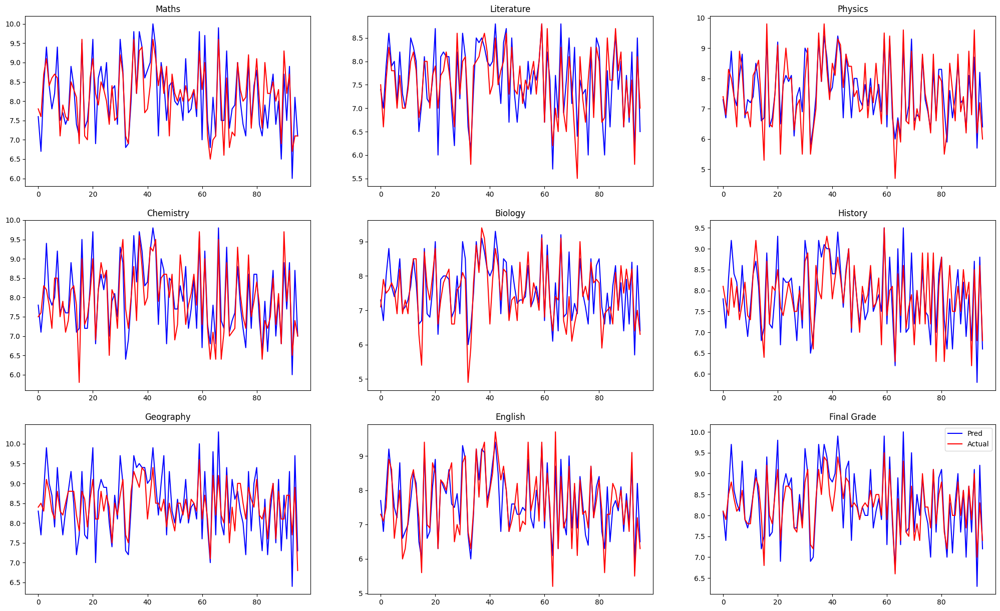

In [ ]:
draw(resultKernelRidge)

In [ ]:
Accuracy(resultGradientBoosting)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.391667,4.897374,0.233750,0.483477,95.102626
1,Literature,0.331250,4.526837,0.195208,0.441824,95.473163
2,Physics,0.517708,7.131472,0.432396,0.657568,92.868528
3,Chemistry,0.357292,4.631860,0.213021,0.461542,95.368140
4,Biology,0.465625,6.509122,0.337396,0.580858,93.490878
5,History,0.400000,5.182048,0.241458,0.491384,94.817952
6,Geography,0.267708,3.216359,0.117812,0.343238,96.783641
7,English,0.379167,5.098498,0.226250,0.475657,94.901502
8,Grade,0.204167,2.520502,0.065000,0.254951,97.479498


In [ ]:
predModel(ypredGradientBoosting)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.6,7.3,7.4,7.9,7.5,7.9,8.3,7.5,8.3,22.9,22.5,23.0,23.5,22.4,C00,Giỏi
1,6.9,7.3,6.9,6.9,6.5,7.3,7.9,6.8,7.8,20.7,20.6,20.3,22.5,21.0,C00,Khá
2,8.6,7.7,7.8,8.0,7.7,8.0,8.3,8.0,8.6,24.4,24.4,24.3,24.0,24.3,A00/A01,Giỏi
3,8.8,8.3,8.2,9.0,8.4,8.7,8.9,9.0,9.0,26.0,26.0,26.2,25.9,26.1,B00,Xuất sắc
4,8.4,8.2,6.7,7.8,7.9,8.1,8.7,8.3,8.5,22.9,23.4,24.1,25.0,24.9,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.4,7.1,7.3,7.7,7.0,7.0,8.2,7.0,7.8,22.4,21.7,22.1,22.3,21.5,A00,Khá
92,9.0,7.9,8.6,8.6,8.3,8.7,8.8,8.8,8.9,26.2,26.4,25.9,25.4,25.7,A01,Giỏi
93,6.7,6.0,5.5,6.0,5.7,6.3,7.3,5.5,6.8,18.2,17.7,18.4,19.6,18.2,C00,Trung bình khá
94,7.5,8.5,8.1,8.3,8.1,8.6,8.8,7.9,8.6,23.9,23.5,23.9,25.9,23.9,C00,Giỏi


# ARD Regression

In [ ]:
from sklearn import linear_model

modelARDGrade = linear_model.ARDRegression().fit(xtrain, ytrainGrade)
modelARDMaths = linear_model.ARDRegression().fit(xtrain, ytrainMaths)
modelARDLiterature = linear_model.ARDRegression().fit(xtrain, ytrainLiterature)
modelARDPhysics = linear_model.ARDRegression().fit(xtrain, ytrainPhysics)
modelARDChemistry = linear_model.ARDRegression().fit(xtrain, ytrainChemistry)
modelARDBiology = linear_model.ARDRegression().fit(xtrain, ytrainBiology)
modelARDHistory = linear_model.ARDRegression().fit(xtrain, ytrainHistory)
modelARDGeography = linear_model.ARDRegression().fit(xtrain, ytrainGeography)
modelARDEnglish = linear_model.ARDRegression().fit(xtrain, ytrainEnglish)
# modelARDCivic = linear_model.ARDRegression().fit(xtrain, xtestCivic)

ypredARDGrade = modelARDGrade.predict(xtest).round(1)
ypredARDMaths = modelARDMaths.predict(xtest).round(1)
ypredARDLiterature = modelARDLiterature.predict(xtest).round(1)
ypredARDPhysics = modelARDPhysics.predict(xtest).round(1)
ypredARDChemistry = modelARDChemistry.predict(xtest).round(1)
ypredARDBiology = modelARDBiology.predict(xtest).round(1)
ypredARDHistory = modelARDHistory.predict(xtest).round(1)
ypredARDGeography = modelARDGeography.predict(xtest).round(1)
ypredARDEnglish = modelARDEnglish.predict(xtest).round(1)
# ypredARDCivic = modelARDCivic.predict(ytrain).round(1)

modelARD = [modelARDGrade, modelARDMaths, modelARDLiterature, modelARDPhysics, modelARDChemistry,
            modelARDBiology, modelARDHistory, modelARDGeography, modelARDEnglish] # modelARDCivic

ypredARD = [ypredARDGrade, ypredARDMaths, ypredARDLiterature, ypredARDPhysics, ypredARDChemistry,
         ypredARDBiology, ypredARDHistory, ypredARDGeography, ypredARDEnglish] #ypredARDCivic

In [ ]:
resultARD = result(ytest, ypredARD)
resultARD

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.7,7.5,7.4,7.4,7.4,7.5,7.9,7.1,7.5,8.1,7.9,8.4,8.5,7.3,7.8,8.1,8.2
1,7.6,7.0,6.6,7.2,6.8,6.6,7.6,7.1,7.9,6.7,7.7,7.4,8.5,8.1,7.1,6.8,7.9,7.6
2,8.7,8.2,7.6,7.7,8.3,7.8,8.3,7.8,7.5,7.7,7.4,7.9,8.3,8.4,7.5,7.9,8.5,8.3
3,9.1,8.8,8.3,8.3,8.0,8.7,8.2,9.0,7.6,8.5,8.3,8.6,9.1,9.0,8.9,9.0,8.8,9.1
4,8.4,8.2,7.8,7.9,7.4,7.2,7.8,7.8,7.8,7.6,7.6,8.2,8.8,8.7,8.6,8.3,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,6.8,6.8,7.3,7.9,8.0,7.6,6.9,6.2,7.1,8.7,8.1,6.8,7.0,7.9,7.9
92,8.7,8.7,7.6,8.1,9.6,8.7,8.7,8.7,8.2,8.3,8.5,8.4,8.7,8.8,9.1,8.7,9.0,8.9
93,6.7,6.7,5.8,6.3,6.2,5.9,6.5,6.5,6.4,5.9,6.8,6.4,7.7,7.6,5.5,6.0,7.0,7.0
94,7.1,7.6,8.1,8.3,7.2,7.9,7.4,8.3,7.0,8.0,8.6,8.5,8.9,8.8,7.2,8.2,8.3,8.6


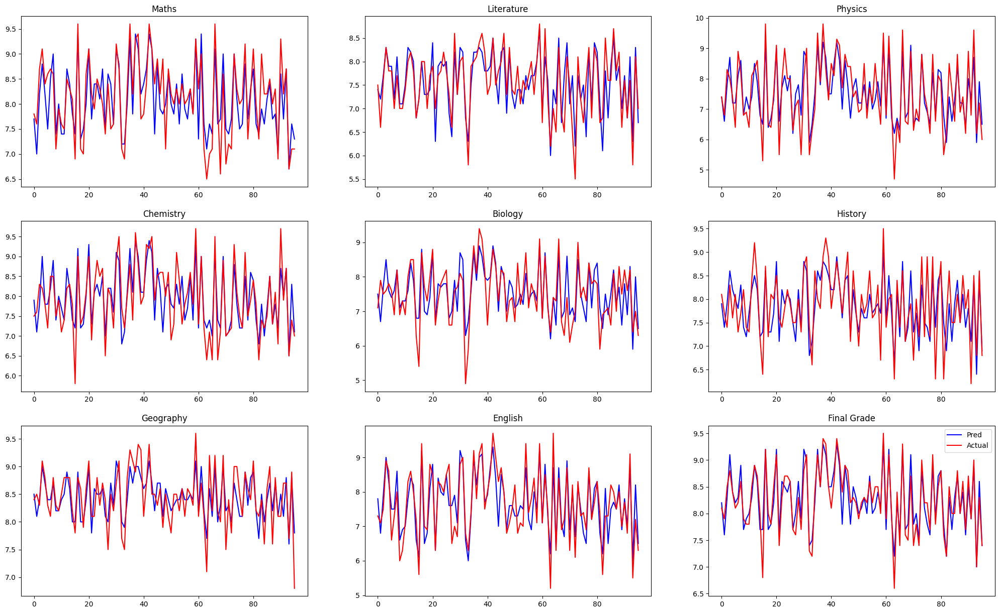

In [ ]:
draw(resultARD)

In [ ]:
Accuracy(resultARD)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.350000,4.396061,0.200417,0.447679,95.603939
1,Literature,0.319792,4.380104,0.167604,0.409395,95.619896
2,Physics,0.465625,6.426826,0.339688,0.582827,93.573174
3,Chemistry,0.361458,4.664657,0.226354,0.475767,95.335343
4,Biology,0.428125,5.998087,0.296771,0.544767,94.001913
5,History,0.368750,4.788900,0.219167,0.468152,95.211100
6,Geography,0.252083,3.033872,0.098125,0.313249,96.966128
7,English,0.384375,5.198909,0.236563,0.486377,94.801091
8,Grade,0.184375,2.278563,0.056771,0.238266,97.721437


In [ ]:
predModel(ypredARD)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.7,7.4,7.4,7.9,7.5,7.9,8.5,7.8,8.2,23.0,22.9,23.1,23.8,22.9,C00,Giỏi
1,7.0,7.2,6.6,7.1,6.7,7.4,8.1,6.8,7.6,20.7,20.4,20.8,22.7,21.0,C00,Khá
2,8.2,7.7,7.8,7.8,7.7,7.9,8.4,7.9,8.3,23.8,23.9,23.7,24.0,23.8,C00,Giỏi
3,8.8,8.3,8.7,9.0,8.5,8.6,9.0,9.0,9.1,26.5,26.5,26.3,25.9,26.1,A00/A01,Xuất sắc
4,8.2,7.9,7.2,7.8,7.6,8.2,8.7,8.3,8.4,23.2,23.7,23.6,24.8,24.4,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,6.8,7.3,8.0,6.9,7.1,8.1,7.0,7.9,23.0,22.0,22.6,22.0,21.5,A00,Khá
92,8.7,8.1,8.7,8.7,8.3,8.4,8.8,8.7,8.9,26.1,26.1,25.7,25.3,25.5,A00/A01,Giỏi
93,6.7,6.3,5.9,6.5,5.9,6.4,7.6,6.0,7.0,19.1,18.6,19.1,20.3,19.0,C00,Khá
94,7.6,8.3,7.9,8.3,8.0,8.5,8.8,8.2,8.6,23.8,23.7,23.9,25.6,24.1,C00,Giỏi


# Poisson Regression

In [ ]:
from sklearn import linear_model

modelPoissonGrade = linear_model.PoissonRegressor().fit(xtrain, ytrainGrade)
modelPoissonMaths = linear_model.PoissonRegressor().fit(xtrain, ytrainMaths)
modelPoissonLiterature = linear_model.PoissonRegressor().fit(xtrain, ytrainLiterature)
modelPoissonPhysics = linear_model.PoissonRegressor().fit(xtrain, ytrainPhysics)
modelPoissonChemistry = linear_model.PoissonRegressor().fit(xtrain, ytrainChemistry)
modelPoissonBiology = linear_model.PoissonRegressor().fit(xtrain, ytrainBiology)
modelPoissonHistory = linear_model.PoissonRegressor().fit(xtrain, ytrainHistory)
modelPoissonGeography = linear_model.PoissonRegressor().fit(xtrain, ytrainGeography)
modelPoissonEnglish = linear_model.PoissonRegressor().fit(xtrain, ytrainEnglish)
# modelPoissonCivic = linear_model.PoissonRegressor().fit(xtrain, xtestCivic)

ypredPoissonGrade = modelPoissonGrade.predict(xtest).round(1)
ypredPoissonMaths = modelPoissonMaths.predict(xtest).round(1)
ypredPoissonLiterature = modelPoissonLiterature.predict(xtest).round(1)
ypredPoissonPhysics = modelPoissonPhysics.predict(xtest).round(1)
ypredPoissonChemistry = modelPoissonChemistry.predict(xtest).round(1)
ypredPoissonBiology = modelPoissonBiology.predict(xtest).round(1)
ypredPoissonHistory = modelPoissonHistory.predict(xtest).round(1)
ypredPoissonGeography = modelPoissonGeography.predict(xtest).round(1)
ypredPoissonEnglish = modelPoissonEnglish.predict(xtest).round(1)
# ypredPoissonCivic = modelPoissonCivic.predict(ytrain).round(1)

modelPoisson = [modelPoissonGrade, modelPoissonMaths, modelPoissonLiterature, modelPoissonPhysics, modelPoissonChemistry,
            modelPoissonBiology, modelPoissonHistory, modelPoissonGeography, modelPoissonEnglish] # modelPoissonCivic

ypredPoisson = [ypredPoissonGrade, ypredPoissonMaths, ypredPoissonLiterature, ypredPoissonPhysics, ypredPoissonChemistry,
         ypredPoissonBiology, ypredPoissonHistory, ypredPoissonGeography, ypredPoissonEnglish] #ypredPoissonCivic

In [ ]:
resultPoisson = result(ytest, ypredPoisson)
resultPoisson

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.7,7.5,7.4,7.4,7.3,7.5,7.8,7.1,7.4,8.1,7.8,8.4,8.5,7.3,7.7,8.1,8.2
1,7.6,7.1,6.6,7.1,6.8,6.6,7.6,7.1,7.9,6.7,7.7,7.2,8.5,8.0,7.1,6.7,7.9,7.6
2,8.7,8.2,7.6,7.8,8.3,7.6,8.3,7.7,7.5,7.8,7.4,8.0,8.3,8.4,7.5,7.9,8.5,8.4
3,9.1,8.9,8.3,8.3,8.0,8.8,8.2,9.0,7.6,8.6,8.3,8.7,9.1,9.0,8.9,9.1,8.8,9.1
4,8.4,8.2,7.8,7.8,7.4,7.3,7.8,7.8,7.8,7.6,7.6,8.2,8.8,8.7,8.6,8.2,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,6.9,6.8,7.1,7.9,7.9,7.6,6.8,6.2,7.1,8.7,8.0,6.8,7.0,7.9,7.8
92,8.7,8.7,7.6,8.1,9.6,8.7,8.7,8.7,8.2,8.3,8.5,8.5,8.7,8.9,9.1,8.7,9.0,8.9
93,6.7,6.7,5.8,6.4,6.2,5.9,6.5,6.6,6.4,6.0,6.8,6.5,7.7,7.5,5.5,6.1,7.0,7.0
94,7.1,7.6,8.1,8.3,7.2,7.9,7.4,8.2,7.0,8.0,8.6,8.4,8.9,8.8,7.2,8.1,8.3,8.6


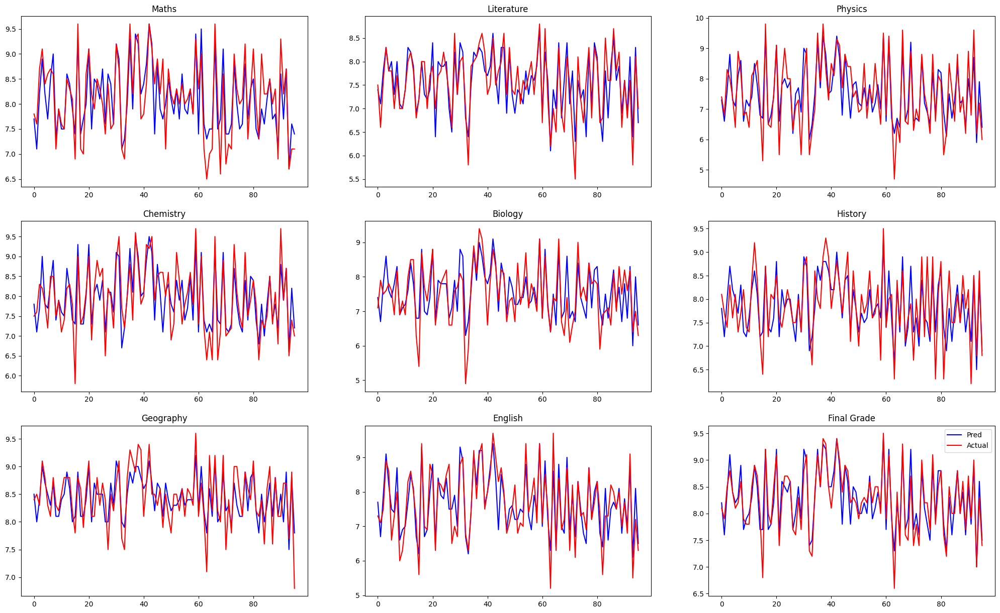

In [ ]:
draw(resultPoisson)

In [ ]:
Accuracy(resultPoisson)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.352083,4.427264,0.205625,0.453459,95.572736
1,Literature,0.308333,4.220669,0.160417,0.400520,95.779331
2,Physics,0.456250,6.357273,0.347917,0.589845,93.642727
3,Chemistry,0.361458,4.672149,0.223229,0.472471,95.327851
4,Biology,0.427083,5.967800,0.301250,0.548862,94.032200
5,History,0.364583,4.735128,0.214375,0.463006,95.264872
6,Geography,0.258333,3.107463,0.102500,0.320156,96.892537
7,English,0.377083,5.109411,0.242292,0.492231,94.890589
8,Grade,0.189583,2.356226,0.059792,0.244523,97.643774


In [ ]:
predModel(ypredPoisson)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.7,7.4,7.3,7.8,7.4,7.8,8.5,7.7,8.2,22.8,22.7,22.9,23.7,22.8,C00,Giỏi
1,7.1,7.1,6.6,7.1,6.7,7.2,8.0,6.7,7.6,20.8,20.4,20.9,22.3,20.9,C00,Khá
2,8.2,7.8,7.6,7.7,7.8,8.0,8.4,7.9,8.4,23.5,23.7,23.7,24.2,23.9,C00,Giỏi
3,8.9,8.3,8.8,9.0,8.6,8.7,9.0,9.1,9.1,26.7,26.8,26.5,26.0,26.3,A01,Xuất sắc
4,8.2,7.8,7.3,7.8,7.6,8.2,8.7,8.2,8.4,23.3,23.7,23.6,24.7,24.2,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,6.9,7.1,7.9,6.8,7.1,8.0,7.0,7.8,22.7,21.8,22.4,22.0,21.6,A00,Khá
92,8.7,8.1,8.7,8.7,8.3,8.5,8.9,8.7,8.9,26.1,26.1,25.7,25.5,25.5,A00/A01,Giỏi
93,6.7,6.4,5.9,6.6,6.0,6.5,7.5,6.1,7.0,19.2,18.7,19.3,20.4,19.2,C00,Khá
94,7.6,8.3,7.9,8.2,8.0,8.4,8.8,8.1,8.6,23.7,23.6,23.8,25.5,24.0,C00,Giỏi


# Tweedie Regression

In [ ]:
from sklearn import linear_model

modelTweedieGrade = linear_model.TweedieRegressor().fit(xtrain, ytrainGrade)
modelTweedieMaths = linear_model.TweedieRegressor().fit(xtrain, ytrainMaths)
modelTweedieLiterature = linear_model.TweedieRegressor().fit(xtrain, ytrainLiterature)
modelTweediePhysics = linear_model.TweedieRegressor().fit(xtrain, ytrainPhysics)
modelTweedieChemistry = linear_model.TweedieRegressor().fit(xtrain, ytrainChemistry)
modelTweedieBiology = linear_model.TweedieRegressor().fit(xtrain, ytrainBiology)
modelTweedieHistory = linear_model.TweedieRegressor().fit(xtrain, ytrainHistory)
modelTweedieGeography = linear_model.TweedieRegressor().fit(xtrain, ytrainGeography)
modelTweedieEnglish = linear_model.TweedieRegressor().fit(xtrain, ytrainEnglish)
# modelTweedieCivic = linear_model.TweedieRegressor().fit(xtrain, xtestCivic)

ypredTweedieGrade = modelTweedieGrade.predict(xtest).round(1)
ypredTweedieMaths = modelTweedieMaths.predict(xtest).round(1)
ypredTweedieLiterature = modelTweedieLiterature.predict(xtest).round(1)
ypredTweediePhysics = modelTweediePhysics.predict(xtest).round(1)
ypredTweedieChemistry = modelTweedieChemistry.predict(xtest).round(1)
ypredTweedieBiology = modelTweedieBiology.predict(xtest).round(1)
ypredTweedieHistory = modelTweedieHistory.predict(xtest).round(1)
ypredTweedieGeography = modelTweedieGeography.predict(xtest).round(1)
ypredTweedieEnglish = modelTweedieEnglish.predict(xtest).round(1)
# ypredTweedieCivic = modelTweedieCivic.predict(ytrain).round(1)

modelTweedie = [modelTweedieGrade, modelTweedieMaths, modelTweedieLiterature, modelTweediePhysics, modelTweedieChemistry,
            modelTweedieBiology, modelTweedieHistory, modelTweedieGeography, modelTweedieEnglish] # modelTweedieCivic

ypredTweedie = [ypredTweedieGrade, ypredTweedieMaths, ypredTweedieLiterature, ypredTweediePhysics, ypredTweedieChemistry,
         ypredTweedieBiology, ypredTweedieHistory, ypredTweedieGeography, ypredTweedieEnglish] #ypredTweedieCivic

In [ ]:
resultTweedie = result(ytest, ypredTweedie)
resultTweedie

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.8,7.5,7.5,7.4,7.3,7.5,7.8,7.1,7.4,8.1,7.8,8.4,8.4,7.3,7.6,8.1,8.2
1,7.6,7.2,6.6,7.0,6.8,6.5,7.6,7.1,7.9,6.8,7.7,7.3,8.5,8.1,7.1,6.8,7.9,7.6
2,8.7,8.2,7.6,7.8,8.3,7.7,8.3,8.0,7.5,7.8,7.4,8.0,8.3,8.5,7.5,7.9,8.5,8.4
3,9.1,8.9,8.3,8.3,8.0,8.7,8.2,8.9,7.6,8.5,8.3,8.6,9.1,8.9,8.9,8.8,8.8,9.0
4,8.4,8.2,7.8,7.8,7.4,7.5,7.8,8.0,7.8,7.7,7.6,8.1,8.8,8.6,8.6,8.1,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,7.0,6.8,7.0,7.9,7.7,7.6,7.0,6.2,7.3,8.7,8.1,6.8,7.0,7.9,7.9
92,8.7,8.9,7.6,8.3,9.6,8.7,8.7,8.8,8.2,8.4,8.5,8.5,8.7,8.9,9.1,8.7,9.0,9.0
93,6.7,6.8,5.8,6.4,6.2,5.8,6.5,6.6,6.4,6.1,6.8,6.6,7.7,7.6,5.5,6.1,7.0,7.1
94,7.1,8.1,8.1,8.2,7.2,8.0,7.4,8.3,7.0,8.0,8.6,8.4,8.9,8.8,7.2,8.2,8.3,8.7


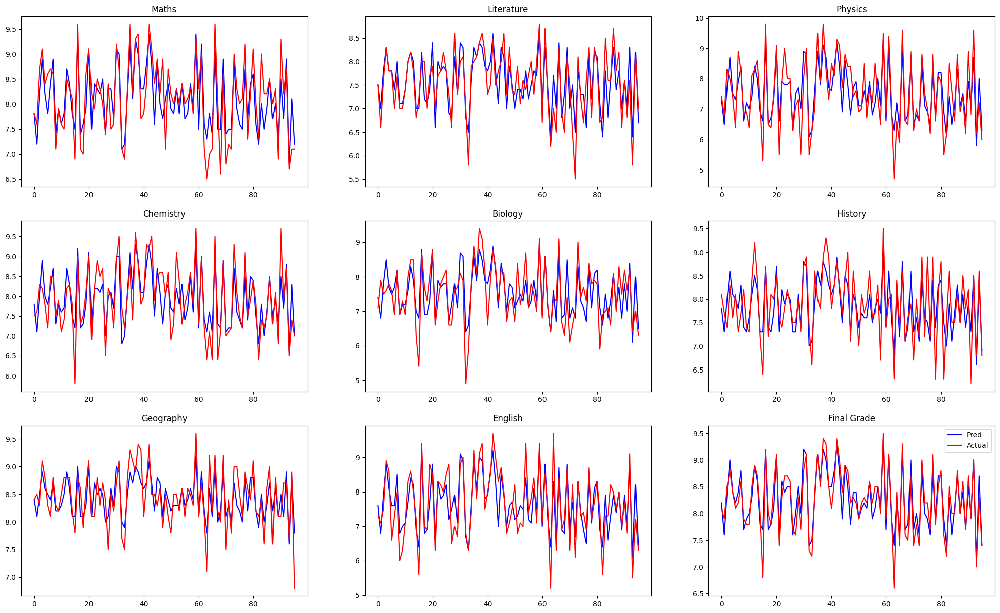

In [ ]:
draw(resultTweedie)

In [ ]:
Accuracy(resultTweedie)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.360417,4.530821,0.203333,0.450925,95.469179
1,Literature,0.320833,4.396667,0.161875,0.402337,95.603333
2,Physics,0.478125,6.601446,0.377812,0.614665,93.398554
3,Chemistry,0.359375,4.634634,0.219271,0.468264,95.365366
4,Biology,0.422917,5.896903,0.289167,0.537742,94.103097
5,History,0.368750,4.789281,0.220208,0.469264,95.210719
6,Geography,0.263542,3.162838,0.104688,0.323554,96.837162
7,English,0.408333,5.500377,0.283958,0.532877,94.499623
8,Grade,0.184375,2.294248,0.058646,0.242169,97.705752


In [ ]:
predModel(ypredTweedie)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.8,7.5,7.3,7.8,7.4,7.8,8.4,7.6,8.2,22.9,22.7,23.0,23.7,22.9,C00,Giỏi
1,7.2,7.0,6.5,7.1,6.8,7.3,8.1,6.8,7.6,20.8,20.5,21.1,22.4,21.0,C00,Khá
2,8.2,7.8,7.7,8.0,7.8,8.0,8.5,7.9,8.4,23.9,23.8,24.0,24.3,23.9,C00,Giỏi
3,8.9,8.3,8.7,8.9,8.5,8.6,8.9,8.8,9.0,26.5,26.4,26.3,25.8,26.0,A00,Xuất sắc
4,8.2,7.8,7.5,8.0,7.7,8.1,8.6,8.1,8.4,23.7,23.8,23.9,24.5,24.1,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,7.0,7.0,7.7,7.0,7.3,8.1,7.0,7.9,22.4,21.7,22.4,22.4,21.7,A00/B00/C00,Khá
92,8.9,8.3,8.7,8.8,8.4,8.5,8.9,8.7,9.0,26.4,26.3,26.1,25.7,25.9,A00,Xuất sắc
93,6.8,6.4,5.8,6.6,6.1,6.6,7.6,6.1,7.1,19.2,18.7,19.5,20.6,19.3,C00,Khá
94,8.1,8.2,8.0,8.3,8.0,8.4,8.8,8.2,8.7,24.4,24.3,24.4,25.4,24.5,C00,Giỏi


# Gamma Regression

In [ ]:
from sklearn import linear_model

modelGammaGrade = linear_model.GammaRegressor().fit(xtrain, ytrainGrade)
modelGammaMaths = linear_model.GammaRegressor().fit(xtrain, ytrainMaths)
modelGammaLiterature = linear_model.GammaRegressor().fit(xtrain, ytrainLiterature)
modelGammaPhysics = linear_model.GammaRegressor().fit(xtrain, ytrainPhysics)
modelGammaChemistry = linear_model.GammaRegressor().fit(xtrain, ytrainChemistry)
modelGammaBiology = linear_model.GammaRegressor().fit(xtrain, ytrainBiology)
modelGammaHistory = linear_model.GammaRegressor().fit(xtrain, ytrainHistory)
modelGammaGeography = linear_model.GammaRegressor().fit(xtrain, ytrainGeography)
modelGammaEnglish = linear_model.GammaRegressor().fit(xtrain, ytrainEnglish)
# modelGammaCivic = linear_model.GammaRegressor().fit(xtrain, xtestCivic)

ypredGammaGrade = modelGammaGrade.predict(xtest).round(1)
ypredGammaMaths = modelGammaMaths.predict(xtest).round(1)
ypredGammaLiterature = modelGammaLiterature.predict(xtest).round(1)
ypredGammaPhysics = modelGammaPhysics.predict(xtest).round(1)
ypredGammaChemistry = modelGammaChemistry.predict(xtest).round(1)
ypredGammaBiology = modelGammaBiology.predict(xtest).round(1)
ypredGammaHistory = modelGammaHistory.predict(xtest).round(1)
ypredGammaGeography = modelGammaGeography.predict(xtest).round(1)
ypredGammaEnglish = modelGammaEnglish.predict(xtest).round(1)
# ypredGammaCivic = modelGammaCivic.predict(ytrain).round(1)

modelGamma = [modelGammaGrade, modelGammaMaths, modelGammaLiterature, modelGammaPhysics, modelGammaChemistry,
            modelGammaBiology, modelGammaHistory, modelGammaGeography, modelGammaEnglish] # modelGammaCivic

ypredGamma = [ypredGammaGrade, ypredGammaMaths, ypredGammaLiterature, ypredGammaPhysics, ypredGammaChemistry,
         ypredGammaBiology, ypredGammaHistory, ypredGammaGeography, ypredGammaEnglish] #ypredGammaCivic

In [ ]:
resultGamma = result(ytest, ypredGamma)
resultGamma

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.8,7.5,7.4,7.4,7.3,7.5,7.8,7.1,7.4,8.1,7.8,8.4,8.4,7.3,7.6,8.1,8.2
1,7.6,7.2,6.6,7.0,6.8,6.5,7.6,7.1,7.9,6.8,7.7,7.3,8.5,8.1,7.1,6.8,7.9,7.6
2,8.7,8.2,7.6,7.8,8.3,7.7,8.3,7.9,7.5,7.7,7.4,8.0,8.3,8.5,7.5,7.9,8.5,8.4
3,9.1,8.9,8.3,8.4,8.0,8.7,8.2,8.9,7.6,8.5,8.3,8.7,9.1,9.0,8.9,8.9,8.8,9.1
4,8.4,8.2,7.8,7.8,7.4,7.5,7.8,7.9,7.8,7.7,7.6,8.1,8.8,8.6,8.6,8.1,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.7,6.8,7.0,6.8,7.0,7.9,7.7,7.6,7.0,6.2,7.3,8.7,8.1,6.8,7.0,7.9,7.9
92,8.7,8.9,7.6,8.3,9.6,8.7,8.7,8.8,8.2,8.4,8.5,8.5,8.7,8.9,9.1,8.8,9.0,9.0
93,6.7,6.8,5.8,6.4,6.2,5.9,6.5,6.6,6.4,6.1,6.8,6.6,7.7,7.7,5.5,6.2,7.0,7.1
94,7.1,8.1,8.1,8.2,7.2,8.0,7.4,8.3,7.0,8.0,8.6,8.4,8.9,8.8,7.2,8.2,8.3,8.7


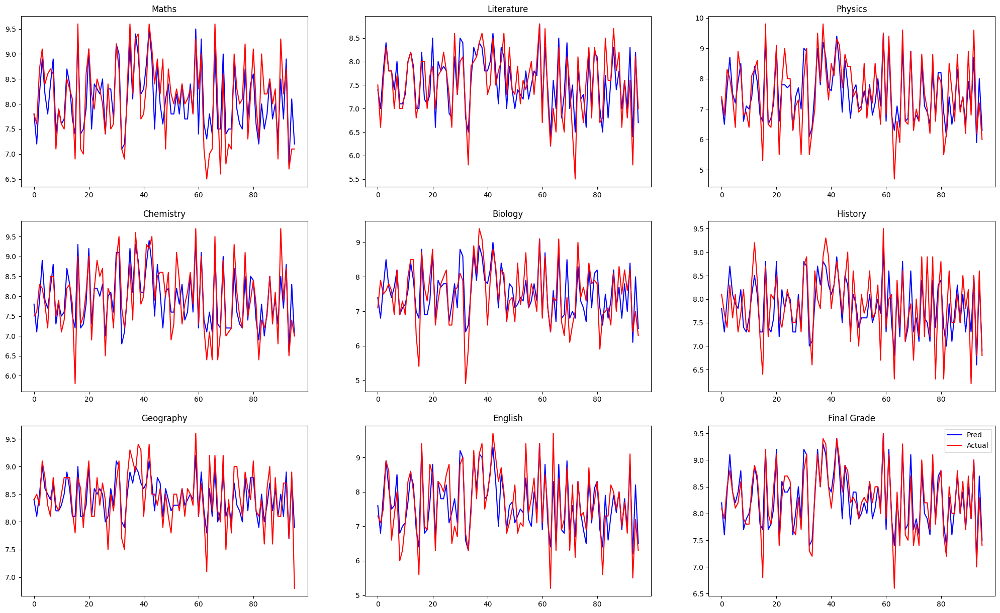

In [ ]:
draw(resultGamma)

In [ ]:
Accuracy(resultGamma)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.365625,4.585422,0.209479,0.457689,95.414578
1,Literature,0.322917,4.410673,0.163958,0.404918,95.589327
2,Physics,0.463542,6.418314,0.370521,0.608704,93.581686
3,Chemistry,0.365625,4.700582,0.221562,0.470704,95.299418
4,Biology,0.419792,5.857347,0.287187,0.535899,94.142653
5,History,0.375000,4.865108,0.222292,0.471478,95.134892
6,Geography,0.260417,3.128593,0.105625,0.325000,96.871407
7,English,0.404167,5.462200,0.285417,0.534244,94.537800
8,Grade,0.182292,2.270784,0.057812,0.240442,97.729216


In [ ]:
predModel(ypredGamma)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.8,7.4,7.3,7.8,7.4,7.8,8.4,7.6,8.2,22.9,22.7,23.0,23.6,22.8,C00,Giỏi
1,7.2,7.0,6.5,7.1,6.8,7.3,8.1,6.8,7.6,20.8,20.5,21.1,22.4,21.0,C00,Khá
2,8.2,7.8,7.7,7.9,7.7,8.0,8.5,7.9,8.4,23.8,23.8,23.8,24.3,23.9,C00,Giỏi
3,8.9,8.4,8.7,8.9,8.5,8.7,9.0,8.9,9.1,26.5,26.5,26.3,26.1,26.2,A00/A01,Xuất sắc
4,8.2,7.8,7.5,7.9,7.7,8.1,8.6,8.1,8.4,23.6,23.8,23.8,24.5,24.1,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.7,7.0,7.0,7.7,7.0,7.3,8.1,7.0,7.9,22.4,21.7,22.4,22.4,21.7,A00/B00/C00,Khá
92,8.9,8.3,8.7,8.8,8.4,8.5,8.9,8.8,9.0,26.4,26.4,26.1,25.7,26.0,A00/A01,Xuất sắc
93,6.8,6.4,5.9,6.6,6.1,6.6,7.7,6.2,7.1,19.3,18.9,19.5,20.7,19.4,C00,Khá
94,8.1,8.2,8.0,8.3,8.0,8.4,8.8,8.2,8.7,24.4,24.3,24.4,25.4,24.5,C00,Giỏi


# Cross-validated Orthogonal Matching Pursuit model (OMP).

In [ ]:
from sklearn.linear_model import OrthogonalMatchingPursuitCV

modelOMPGrade = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, ytrainGrade)
modelOMPMaths = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, ytrainMaths)
modelOMPLiterature = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, ytrainLiterature)
modelOMPPhysics = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, ytrainPhysics)
modelOMPChemistry = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, ytrainChemistry)
modelOMPBiology = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, ytrainBiology)
modelOMPHistory = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, ytrainHistory)
modelOMPGeography = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, ytrainGeography)
modelOMPEnglish = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, ytrainEnglish)
# modelOMPCivic = OrthogonalMatchingPursuitCV(cv=5).fit(xtrain, xtestCivic)

ypredOMPGrade = modelOMPGrade.predict(xtest).round(1)
ypredOMPMaths = modelOMPMaths.predict(xtest).round(1)
ypredOMPLiterature = modelOMPLiterature.predict(xtest).round(1)
ypredOMPPhysics = modelOMPPhysics.predict(xtest).round(1)
ypredOMPChemistry = modelOMPChemistry.predict(xtest).round(1)
ypredOMPBiology = modelOMPBiology.predict(xtest).round(1)
ypredOMPHistory = modelOMPHistory.predict(xtest).round(1)
ypredOMPGeography = modelOMPGeography.predict(xtest).round(1)
ypredOMPEnglish = modelOMPEnglish.predict(xtest).round(1)
# ypredOMPCivic = modelOMPCivic.predict(ytrain).round(1)

modelOMP = [modelOMPGrade, modelOMPMaths, modelOMPLiterature, modelOMPPhysics, modelOMPChemistry,
            modelOMPBiology, modelOMPHistory, modelOMPGeography, modelOMPEnglish] # modelOMPCivic

ypredOMP = [ypredOMPGrade, ypredOMPMaths, ypredOMPLiterature, ypredOMPPhysics, ypredOMPChemistry,
         ypredOMPBiology, ypredOMPHistory, ypredOMPGeography, ypredOMPEnglish] #ypredOMPCivic

In [ ]:
resultOMP = result(ytest, ypredOMP)
resultOMP

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.9,7.5,7.6,7.4,7.2,7.5,8.0,7.1,7.6,8.1,8.1,8.4,8.6,7.3,7.9,8.1,8.4
1,7.6,7.0,6.6,7.4,6.8,6.7,7.6,7.1,7.9,6.7,7.7,7.4,8.5,8.1,7.1,6.7,7.9,7.6
2,8.7,8.3,7.6,7.5,8.3,7.8,8.3,7.9,7.5,7.5,7.4,7.7,8.3,8.3,7.5,7.8,8.5,8.2
3,9.1,8.8,8.3,8.3,8.0,8.4,8.2,8.9,7.6,8.5,8.3,8.8,9.1,9.0,8.9,9.0,8.8,9.1
4,8.4,8.1,7.8,8.0,7.4,7.3,7.8,7.8,7.8,7.9,7.6,8.1,8.8,8.6,8.6,8.0,8.4,8.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.9,6.8,6.8,6.8,7.4,7.9,8.2,7.6,6.8,6.2,7.3,8.7,8.2,6.8,7.2,7.9,7.7
92,8.7,8.7,7.6,8.1,9.6,8.5,8.7,8.6,8.2,8.3,8.5,8.4,8.7,8.8,9.1,8.7,9.0,8.8
93,6.7,6.7,5.8,6.4,6.2,6.1,6.5,6.6,6.4,6.0,6.8,6.6,7.7,7.6,5.5,6.0,7.0,7.0
94,7.1,7.8,8.1,8.3,7.2,7.4,7.4,8.2,7.0,7.9,8.6,8.5,8.9,8.8,7.2,8.1,8.3,8.6


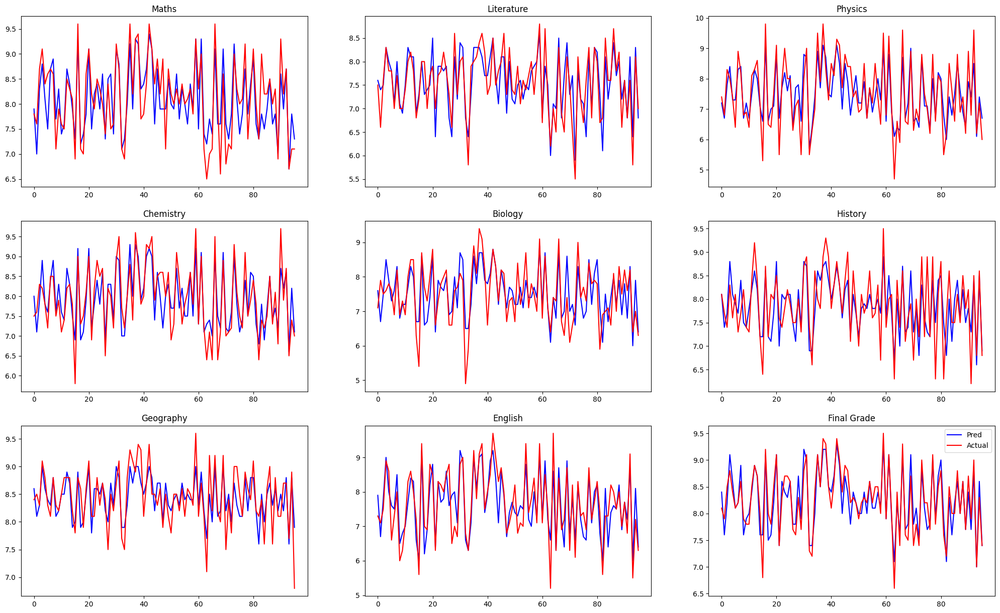

In [ ]:
draw(resultOMP)

In [ ]:
Accuracy(resultOMP)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.357292,4.492900,0.208229,0.456321,95.507100
1,Literature,0.315625,4.299738,0.166771,0.408376,95.700262
2,Physics,0.465625,6.392149,0.346979,0.589049,93.607851
3,Chemistry,0.361458,4.658701,0.209271,0.457461,95.341299
4,Biology,0.452083,6.311247,0.319792,0.565501,93.688753
5,History,0.375000,4.863125,0.231667,0.481318,95.136875
6,Geography,0.255208,3.065897,0.106563,0.326439,96.934103
7,English,0.403125,5.428212,0.263646,0.513465,94.571788
8,Grade,0.191667,2.357007,0.060208,0.245374,97.642993


In [ ]:
predModel(ypredOMP)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.9,7.6,7.2,8.0,7.6,8.1,8.6,7.9,8.4,23.1,23.0,23.5,24.3,23.4,C00,Giỏi
1,7.0,7.4,6.7,7.1,6.7,7.4,8.1,6.7,7.6,20.8,20.4,20.8,22.9,21.1,C00,Khá
2,8.3,7.5,7.8,7.9,7.5,7.7,8.3,7.8,8.2,24.0,23.9,23.7,23.5,23.6,A00,Giỏi
3,8.8,8.3,8.4,8.9,8.5,8.8,9.0,9.0,9.1,26.1,26.2,26.2,26.1,26.1,A01/B00,Xuất sắc
4,8.1,8.0,7.3,7.8,7.9,8.1,8.6,8.0,8.6,23.2,23.4,23.8,24.7,24.1,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.9,6.8,7.4,8.2,6.8,7.3,8.2,7.2,7.7,23.5,22.5,22.9,22.3,21.9,A00,Khá
92,8.7,8.1,8.5,8.6,8.3,8.4,8.8,8.7,8.8,25.8,25.9,25.6,25.3,25.5,A01,Giỏi
93,6.7,6.4,6.1,6.6,6.0,6.6,7.6,6.0,7.0,19.4,18.8,19.3,20.6,19.1,C00,Khá
94,7.8,8.3,7.4,8.2,7.9,8.5,8.8,8.1,8.6,23.4,23.3,23.9,25.6,24.2,C00,Giỏi


# Quantile Regression

In [ ]:
from sklearn.linear_model import QuantileRegressor
from sklearn.utils.fixes import sp_version, parse_version
solver = "highs" if sp_version >= parse_version("1.6.0") else "interior-point"

modelQuantileGrade = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, ytrainGrade)
modelQuantileMaths = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, ytrainMaths)
modelQuantileLiterature = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, ytrainLiterature)
modelQuantilePhysics = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, ytrainPhysics)
modelQuantileChemistry = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, ytrainChemistry)
modelQuantileBiology = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, ytrainBiology)
modelQuantileHistory = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, ytrainHistory)
modelQuantileGeography = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, ytrainGeography)
modelQuantileEnglish = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, ytrainEnglish)
# modelQuantileCivic = QuantileRegressor(quantile=0.8, solver=solver).fit(xtrain, xtestCivic)

ypredQuantileGrade = modelQuantileGrade.predict(xtest).round(1)
ypredQuantileMaths = modelQuantileMaths.predict(xtest).round(1)
ypredQuantileLiterature = modelQuantileLiterature.predict(xtest).round(1)
ypredQuantilePhysics = modelQuantilePhysics.predict(xtest).round(1)
ypredQuantileChemistry = modelQuantileChemistry.predict(xtest).round(1)
ypredQuantileBiology = modelQuantileBiology.predict(xtest).round(1)
ypredQuantileHistory = modelQuantileHistory.predict(xtest).round(1)
ypredQuantileGeography = modelQuantileGeography.predict(xtest).round(1)
ypredQuantileEnglish = modelQuantileEnglish.predict(xtest).round(1)
# ypredQuantileCivic = modelQuantileCivic.predict(ytrain).round(1)

modelQuantile = [modelQuantileGrade, modelQuantileMaths, modelQuantileLiterature, modelQuantilePhysics, modelQuantileChemistry,
            modelQuantileBiology, modelQuantileHistory, modelQuantileGeography, modelQuantileEnglish] # modelQuantileCivic

ypredQuantile = [ypredQuantileGrade, ypredQuantileMaths, ypredQuantileLiterature, ypredQuantilePhysics, ypredQuantileChemistry,
         ypredQuantileBiology, ypredQuantileHistory, ypredQuantileGeography, ypredQuantileEnglish] #ypredQuantileCivic

In [ ]:
resultQuantile = result(ytest, ypredQuantile)
resultQuantile

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,8.7,7.5,8.2,7.4,8.2,7.5,8.6,7.1,8.2,8.1,8.4,8.4,8.8,7.3,8.4,8.1,8.7
1,7.6,8.7,6.6,8.2,6.8,8.2,7.6,8.6,7.9,8.2,7.7,8.4,8.5,8.8,7.1,8.4,7.9,8.7
2,8.7,8.7,7.6,8.2,8.3,8.2,8.3,8.6,7.5,8.2,7.4,8.4,8.3,8.8,7.5,8.4,8.5,8.7
3,9.1,8.7,8.3,8.2,8.0,8.2,8.2,8.6,7.6,8.2,8.3,8.4,9.1,8.8,8.9,8.4,8.8,8.7
4,8.4,8.7,7.8,8.2,7.4,8.2,7.8,8.6,7.8,8.2,7.6,8.4,8.8,8.8,8.6,8.4,8.4,8.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,8.7,6.8,8.2,6.8,8.2,7.9,8.6,7.6,8.2,6.2,8.4,8.7,8.8,6.8,8.4,7.9,8.7
92,8.7,8.7,7.6,8.2,9.6,8.2,8.7,8.6,8.2,8.2,8.5,8.4,8.7,8.8,9.1,8.4,9.0,8.7
93,6.7,8.7,5.8,8.2,6.2,8.2,6.5,8.6,6.4,8.2,6.8,8.4,7.7,8.8,5.5,8.4,7.0,8.7
94,7.1,8.7,8.1,8.2,7.2,8.2,7.4,8.6,7.0,8.2,8.6,8.4,8.9,8.8,7.2,8.4,8.3,8.7


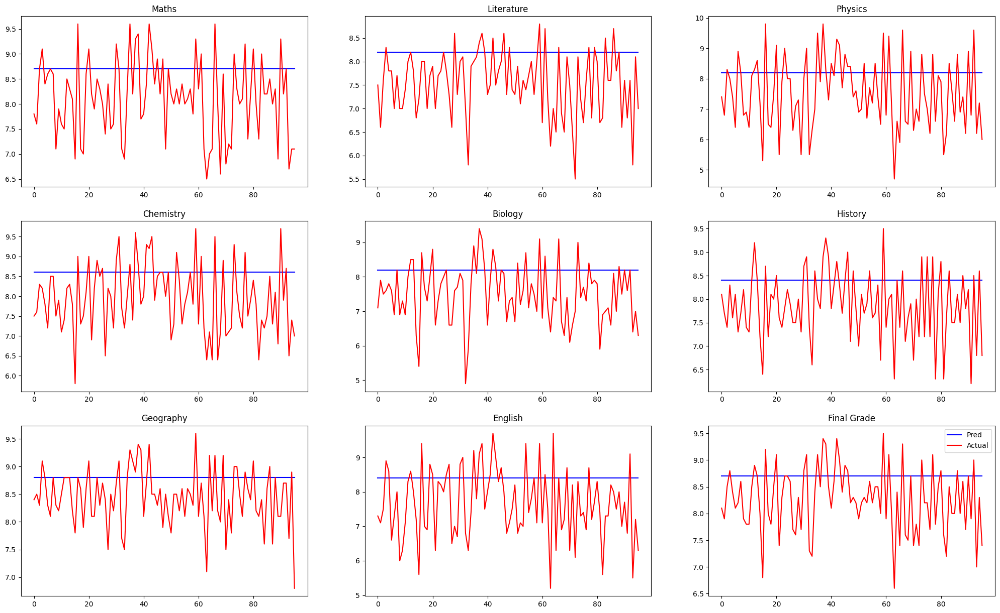

In [ ]:
draw(resultQuantile)

In [ ]:
Accuracy(resultQuantile)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.782292,10.307408,0.934062,0.966469,89.692592
1,Literature,0.743750,10.694006,0.904583,0.951096,89.305994
2,Physics,1.118750,16.540069,1.805208,1.343580,83.459931
3,Chemistry,0.901042,12.215132,1.186354,1.089199,87.784868
4,Biology,0.876042,12.776670,1.200937,1.095873,87.223330
5,History,0.719792,9.796307,0.807396,0.898552,90.203693
6,Geography,0.489583,6.057455,0.389583,0.624166,93.942545
7,English,1.016667,14.678942,1.565417,1.251166,85.321058
8,Grade,0.598958,7.644314,0.562604,0.750069,92.355686


In [ ]:
predModel(ypredQuantile)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,8.7,8.2,8.2,8.6,8.2,8.4,8.8,8.4,8.7,25.5,25.3,25.5,25.4,25.3,A00/B00,Giỏi
1,8.7,8.2,8.2,8.6,8.2,8.4,8.8,8.4,8.7,25.5,25.3,25.5,25.4,25.3,A00/B00,Giỏi
2,8.7,8.2,8.2,8.6,8.2,8.4,8.8,8.4,8.7,25.5,25.3,25.5,25.4,25.3,A00/B00,Giỏi
3,8.7,8.2,8.2,8.6,8.2,8.4,8.8,8.4,8.7,25.5,25.3,25.5,25.4,25.3,A00/B00,Giỏi
4,8.7,8.2,8.2,8.6,8.2,8.4,8.8,8.4,8.7,25.5,25.3,25.5,25.4,25.3,A00/B00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.7,8.2,8.2,8.6,8.2,8.4,8.8,8.4,8.7,25.5,25.3,25.5,25.4,25.3,A00/B00,Giỏi
92,8.7,8.2,8.2,8.6,8.2,8.4,8.8,8.4,8.7,25.5,25.3,25.5,25.4,25.3,A00/B00,Giỏi
93,8.7,8.2,8.2,8.6,8.2,8.4,8.8,8.4,8.7,25.5,25.3,25.5,25.4,25.3,A00/B00,Giỏi
94,8.7,8.2,8.2,8.6,8.2,8.4,8.8,8.4,8.7,25.5,25.3,25.5,25.4,25.3,A00/B00,Giỏi


# RANSAC Regression

In [ ]:
from sklearn.linear_model import RANSACRegressor

modelRANSACGrade = RANSACRegressor(random_state=0).fit(xtrain, ytrainGrade)
modelRANSACMaths = RANSACRegressor(random_state=0).fit(xtrain, ytrainMaths)
modelRANSACLiterature = RANSACRegressor(random_state=0).fit(xtrain, ytrainLiterature)
modelRANSACPhysics = RANSACRegressor(random_state=0).fit(xtrain, ytrainPhysics)
modelRANSACChemistry = RANSACRegressor(random_state=0).fit(xtrain, ytrainChemistry)
modelRANSACBiology = RANSACRegressor(random_state=0).fit(xtrain, ytrainBiology)
modelRANSACHistory = RANSACRegressor(random_state=0).fit(xtrain, ytrainHistory)
modelRANSACGeography = RANSACRegressor(random_state=0).fit(xtrain, ytrainGeography)
modelRANSACEnglish = RANSACRegressor(random_state=0).fit(xtrain, ytrainEnglish)
# modelRANSACCivic = RANSACRegressor(random_state=0).fit(xtrain, xtestCivic)

ypredRANSACGrade = modelRANSACGrade.predict(xtest).round(1)
ypredRANSACMaths = modelRANSACMaths.predict(xtest).round(1)
ypredRANSACLiterature = modelRANSACLiterature.predict(xtest).round(1)
ypredRANSACPhysics = modelRANSACPhysics.predict(xtest).round(1)
ypredRANSACChemistry = modelRANSACChemistry.predict(xtest).round(1)
ypredRANSACBiology = modelRANSACBiology.predict(xtest).round(1)
ypredRANSACHistory = modelRANSACHistory.predict(xtest).round(1)
ypredRANSACGeography = modelRANSACGeography.predict(xtest).round(1)
ypredRANSACEnglish = modelRANSACEnglish.predict(xtest).round(1)
# ypredRANSACCivic = modelRANSACCivic.predict(ytrain).round(1)

modelRANSAC = [modelRANSACGrade, modelRANSACMaths, modelRANSACLiterature, modelRANSACPhysics, modelRANSACChemistry,
            modelRANSACBiology, modelRANSACHistory, modelRANSACGeography, modelRANSACEnglish] # modelRANSACCivic

ypredRANSAC = [ypredRANSACGrade, ypredRANSACMaths, ypredRANSACLiterature, ypredRANSACPhysics, ypredRANSACChemistry,
         ypredRANSACBiology, ypredRANSACHistory, ypredRANSACGeography, ypredRANSACEnglish] #ypredRANSACCivic

In [ ]:
resultRANSAC = result(ytest, ypredRANSAC)
resultRANSAC

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.1,7.5,6.4,7.4,7.3,7.5,7.8,7.1,6.6,8.1,7.6,8.4,9.8,7.3,8.4,8.1,8.4
1,7.6,7.6,6.6,7.0,6.8,6.3,7.6,6.3,7.9,6.8,7.7,8.0,8.5,8.0,7.1,6.3,7.9,7.8
2,8.7,7.1,7.6,8.8,8.3,6.2,8.3,8.8,7.5,8.8,7.4,5.9,8.3,6.3,7.5,8.2,8.5,8.3
3,9.1,8.5,8.3,7.7,8.0,9.0,8.2,9.1,7.6,8.7,8.3,9.5,9.1,9.2,8.9,9.6,8.8,9.3
4,8.4,9.0,7.8,8.3,7.4,7.7,7.8,7.0,7.8,7.6,7.6,9.1,8.8,10.1,8.6,8.5,8.4,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.4,6.8,5.9,6.8,5.2,7.9,7.9,7.6,6.7,6.2,7.2,8.7,7.3,6.8,7.8,7.9,7.7
92,8.7,8.1,7.6,7.8,9.6,7.7,8.7,8.6,8.2,8.5,8.5,9.3,8.7,9.7,9.1,9.0,9.0,9.1
93,6.7,6.9,5.8,6.2,6.2,5.5,6.5,5.7,6.4,5.8,6.8,6.3,7.7,8.2,5.5,6.6,7.0,6.9
94,7.1,7.5,8.1,7.8,7.2,7.1,7.4,7.8,7.0,8.1,8.6,10.8,8.9,10.0,7.2,8.4,8.3,8.6


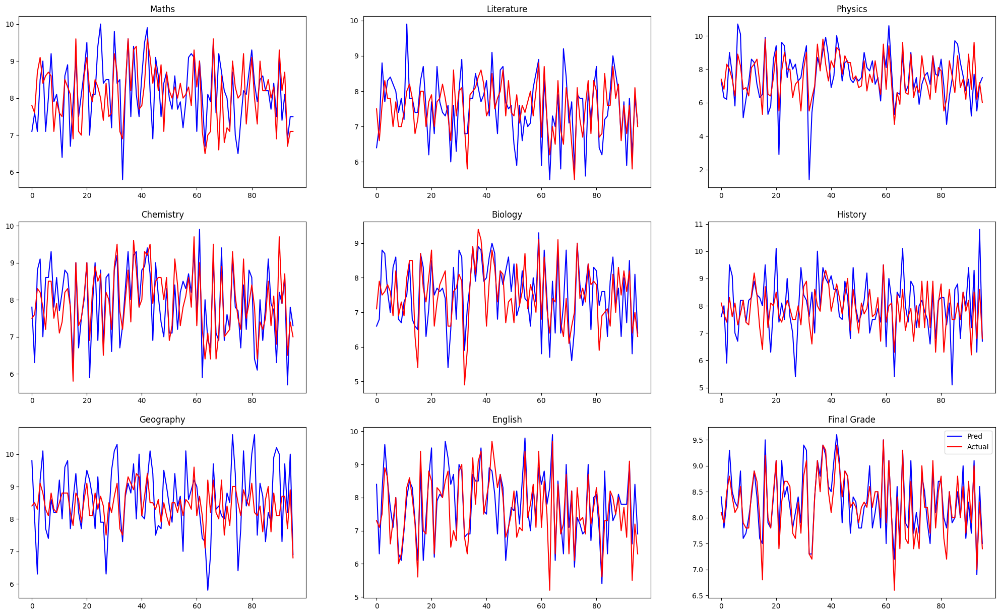

In [ ]:
draw(resultRANSAC)

In [ ]:
Accuracy(resultRANSAC)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.644792,8.177392,0.671979,0.819743,91.822608
1,Literature,0.589583,7.951716,0.573542,0.757325,92.048284
2,Physics,0.876042,12.326202,1.295312,1.138118,87.673798
3,Chemistry,0.517708,6.626974,0.418854,0.647189,93.373026
4,Biology,0.632292,8.767535,0.599479,0.774260,91.232465
5,History,0.742708,9.676791,0.913854,0.955957,90.323209
6,Geography,0.790625,9.325004,0.958021,0.978785,90.674996
7,English,0.526042,7.290682,0.533229,0.730225,92.709318
8,Grade,0.218750,2.703362,0.080417,0.283578,97.296638


In [ ]:
predModel(ypredRANSAC)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.1,6.4,7.3,7.8,6.6,7.6,9.8,8.4,8.4,22.2,22.8,21.5,23.8,21.9,C00,Giỏi
1,7.6,7.0,6.3,6.3,6.8,8.0,8.0,6.3,7.8,20.2,20.2,20.7,23.0,20.9,C00,Khá
2,7.1,8.8,6.2,8.8,8.8,5.9,6.3,8.2,8.3,22.1,21.5,24.7,21.0,24.1,B00,Giỏi
3,8.5,7.7,9.0,9.1,8.7,9.5,9.2,9.6,9.3,26.6,27.1,26.3,26.4,25.8,A01,Xuất sắc
4,9.0,8.3,7.7,7.0,7.6,9.1,10.1,8.5,8.5,23.7,25.2,23.6,27.5,25.8,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.4,5.9,5.2,7.9,6.7,7.2,7.3,7.8,7.7,20.5,20.4,22.0,20.4,21.1,B00,Khá
92,8.1,7.8,7.7,8.6,8.5,9.3,9.7,9.0,9.1,24.4,24.8,25.2,26.8,24.9,C00,Xuất sắc
93,6.9,6.2,5.5,5.7,5.8,6.3,8.2,6.6,6.9,18.1,19.0,18.4,20.7,19.7,C00,Trung bình khá
94,7.5,7.8,7.1,7.8,8.1,10.8,10.0,8.4,8.6,22.4,23.0,23.4,28.6,23.7,C00,Giỏi


# Passive Aggressive Regressor

In [ ]:
from sklearn.linear_model import PassiveAggressiveRegressor

modelPARGrade = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, ytrainGrade)
modelPARMaths = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, ytrainMaths)
modelPARLiterature = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, ytrainLiterature)
modelPARPhysics = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, ytrainPhysics)
modelPARChemistry = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, ytrainChemistry)
modelPARBiology = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, ytrainBiology)
modelPARHistory = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, ytrainHistory)
modelPARGeography = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, ytrainGeography)
modelPAREnglish = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, ytrainEnglish)
# modelPARCivic = PassiveAggressiveRegressor(max_iter=100, random_state=0,tol=1e-3).fit(xtrain, xtestCivic)

ypredPARGrade = modelPARGrade.predict(xtest).round(1)
ypredPARMaths = modelPARMaths.predict(xtest).round(1)
ypredPARLiterature = modelPARLiterature.predict(xtest).round(1)
ypredPARPhysics = modelPARPhysics.predict(xtest).round(1)
ypredPARChemistry = modelPARChemistry.predict(xtest).round(1)
ypredPARBiology = modelPARBiology.predict(xtest).round(1)
ypredPARHistory = modelPARHistory.predict(xtest).round(1)
ypredPARGeography = modelPARGeography.predict(xtest).round(1)
ypredPAREnglish = modelPAREnglish.predict(xtest).round(1)
# ypredPARCivic = modelPARCivic.predict(ytrain).round(1)

modelPAR = [modelPARGrade, modelPARMaths, modelPARLiterature, modelPARPhysics, modelPARChemistry,
            modelPARBiology, modelPARHistory, modelPARGeography, modelPAREnglish] # modelPARCivic

ypredPAR = [ypredPARGrade, ypredPARMaths, ypredPARLiterature, ypredPARPhysics, ypredPARChemistry,
         ypredPARBiology, ypredPARHistory, ypredPARGeography, ypredPAREnglish] #ypredPARCivic

In [ ]:
resultPAR = result(ytest, ypredPAR)
resultPAR

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,8.7,7.5,7.0,7.4,6.9,7.5,8.6,7.1,7.5,8.1,8.5,8.4,8.5,7.3,8.4,8.1,8.8
1,7.6,7.6,6.6,6.6,6.8,6.2,7.6,7.6,7.9,6.8,7.7,7.7,8.5,7.8,7.1,7.2,7.9,8.0
2,8.7,9.6,7.6,7.6,8.3,7.3,8.3,9.0,7.5,8.3,7.4,9.0,8.3,9.1,7.5,8.7,8.5,9.5
3,9.1,10.8,8.3,8.2,8.0,8.3,8.2,10.4,7.6,9.1,8.3,10.1,9.1,10.2,8.9,10.0,8.8,10.6
4,8.4,9.6,7.8,7.6,7.4,7.0,7.8,9.0,7.8,8.1,7.6,9.2,8.8,9.3,8.6,9.0,8.4,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,8.4,6.8,6.4,6.8,6.6,7.9,8.3,7.6,6.9,6.2,7.5,8.7,7.7,6.8,7.6,7.9,8.2
92,8.7,10.4,7.6,7.9,9.6,8.2,8.7,9.9,8.2,8.8,8.5,9.6,8.7,9.6,9.1,9.6,9.0,10.2
93,6.7,6.7,5.8,5.6,6.2,5.3,6.5,6.5,6.4,5.9,6.8,6.3,7.7,6.6,5.5,6.3,7.0,6.8
94,7.1,9.3,8.1,8.1,7.2,7.7,7.4,9.5,7.0,8.6,8.6,9.8,8.9,9.9,7.2,9.0,8.3,10.1


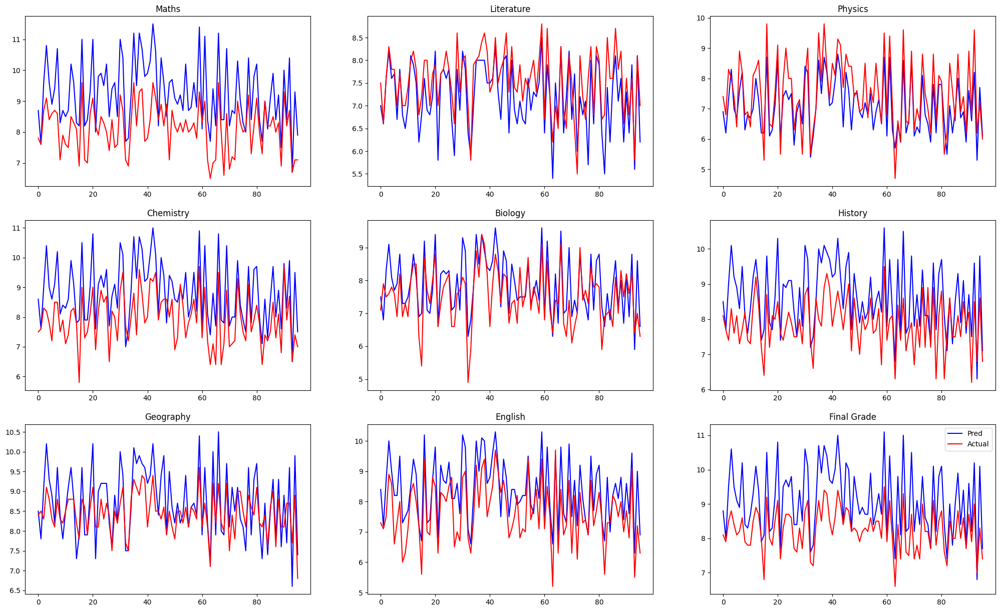

In [ ]:
draw(resultPAR)

In [ ]:
Accuracy(resultPAR)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,1.157292,14.323053,1.722812,1.312560,85.676947
1,Literature,0.453125,6.073440,0.339896,0.583006,93.926560
2,Physics,0.588542,7.671696,0.544063,0.737606,92.328304
3,Chemistry,0.941667,12.020767,1.189792,1.090776,87.979233
4,Biology,0.556250,7.730039,0.469375,0.685109,92.269961
5,History,0.831250,10.653286,0.957500,0.978519,89.346714
6,Geography,0.513542,6.020930,0.395104,0.628573,93.979070
7,English,0.775000,10.453088,0.786250,0.886707,89.546912
8,Grade,0.863542,10.279636,0.979479,0.989686,89.720364


In [ ]:
predModel(ypredPAR)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,8.7,7.0,6.9,8.6,7.5,8.5,8.5,8.4,8.8,24.2,24.0,24.8,24.0,24.1,B00,Giỏi
1,7.6,6.6,6.2,7.6,6.8,7.7,7.8,7.2,8.0,21.4,21.0,22.0,22.1,21.4,C00,Giỏi
2,9.6,7.6,7.3,9.0,8.3,9.0,9.1,8.7,9.5,25.9,25.6,26.9,25.7,25.9,B00,Xuất sắc
3,10.8,8.2,8.3,10.4,9.1,10.1,10.2,10.0,10.6,29.5,29.1,30.3,28.5,29.0,B00,Xuất sắc
4,9.6,7.6,7.0,9.0,8.1,9.2,9.3,9.0,9.5,25.6,25.6,26.7,26.1,26.2,B00,Xuất sắc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.4,6.4,6.6,8.3,6.9,7.5,7.7,7.6,8.2,23.3,22.6,23.6,21.6,22.4,B00,Giỏi
92,10.4,7.9,8.2,9.9,8.8,9.6,9.6,9.6,10.2,28.5,28.2,29.1,27.1,27.9,B00,Xuất sắc
93,6.7,5.6,5.3,6.5,5.9,6.3,6.6,6.3,6.8,18.5,18.3,19.1,18.5,18.6,B00,Trung bình khá
94,9.3,8.1,7.7,9.5,8.6,9.8,9.9,9.0,10.1,26.5,26.0,27.4,27.8,26.4,C00,Xuất sắc


# Extra Tree Regressor

In [ ]:
from sklearn.datasets import load_diabetes
from sklearn.model_selection import train_test_split
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import ExtraTreeRegressor

extra_tree = ExtraTreeRegressor(random_state=0)

modelETGrade = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, ytrainGrade)
modelETMaths = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, ytrainMaths)
modelETLiterature = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, ytrainLiterature)
modelETPhysics = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, ytrainPhysics)
modelETChemistry = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, ytrainChemistry)
modelETBiology = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, ytrainBiology)
modelETHistory = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, ytrainHistory)
modelETGeography = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, ytrainGeography)
modelETEnglish = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, ytrainEnglish)
# modelETCivic = BaggingRegressor(extra_tree, random_state=0).fit(xtrain, xtestCivic)

ypredETGrade = modelETGrade.predict(xtest).round(1)
ypredETMaths = modelETMaths.predict(xtest).round(1)
ypredETLiterature = modelETLiterature.predict(xtest).round(1)
ypredETPhysics = modelETPhysics.predict(xtest).round(1)
ypredETChemistry = modelETChemistry.predict(xtest).round(1)
ypredETBiology = modelETBiology.predict(xtest).round(1)
ypredETHistory = modelETHistory.predict(xtest).round(1)
ypredETGeography = modelETGeography.predict(xtest).round(1)
ypredETEnglish = modelETEnglish.predict(xtest).round(1)
# ypredETCivic = modelETCivic.predict(ytrain).round(1)

modelET = [modelETGrade, modelETMaths, modelETLiterature, modelETPhysics, modelETChemistry,
            modelETBiology, modelETHistory, modelETGeography, modelETEnglish] # modelETCivic

ypredET = [ypredETGrade, ypredETMaths, ypredETLiterature, ypredETPhysics, ypredETChemistry,
         ypredETBiology, ypredETHistory, ypredETGeography, ypredETEnglish] #ypredETCivic

In [ ]:
resultET = result(ytest, ypredET)
resultET

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,7.4,7.5,7.4,7.4,7.3,7.5,8.0,7.1,7.5,8.1,7.6,8.4,8.4,7.3,8.0,8.1,8.2
1,7.6,7.0,6.6,7.3,6.8,6.5,7.6,7.2,7.9,6.8,7.7,7.4,8.5,8.0,7.1,6.9,7.9,7.7
2,8.7,8.4,7.6,8.1,8.3,8.2,8.3,8.3,7.5,7.7,7.4,8.0,8.3,8.8,7.5,8.1,8.5,8.5
3,9.1,8.6,8.3,8.4,8.0,8.3,8.2,9.1,7.6,8.4,8.3,8.7,9.1,9.0,8.9,8.9,8.8,8.9
4,8.4,8.2,7.8,8.2,7.4,7.4,7.8,7.8,7.8,7.6,7.6,7.7,8.8,8.7,8.6,8.5,8.4,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,7.4,6.8,7.2,6.8,6.9,7.9,8.2,7.6,6.9,6.2,7.2,8.7,8.1,6.8,7.0,7.9,7.9
92,8.7,8.5,7.6,7.8,9.6,8.4,8.7,9.0,8.2,8.2,8.5,8.5,8.7,8.8,9.1,8.9,9.0,8.8
93,6.7,6.4,5.8,6.2,6.2,5.7,6.5,6.1,6.4,6.1,6.8,6.7,7.7,7.6,5.5,6.0,7.0,6.8
94,7.1,7.7,8.1,8.5,7.2,8.2,7.4,8.3,7.0,8.0,8.6,8.5,8.9,8.9,7.2,8.1,8.3,8.6


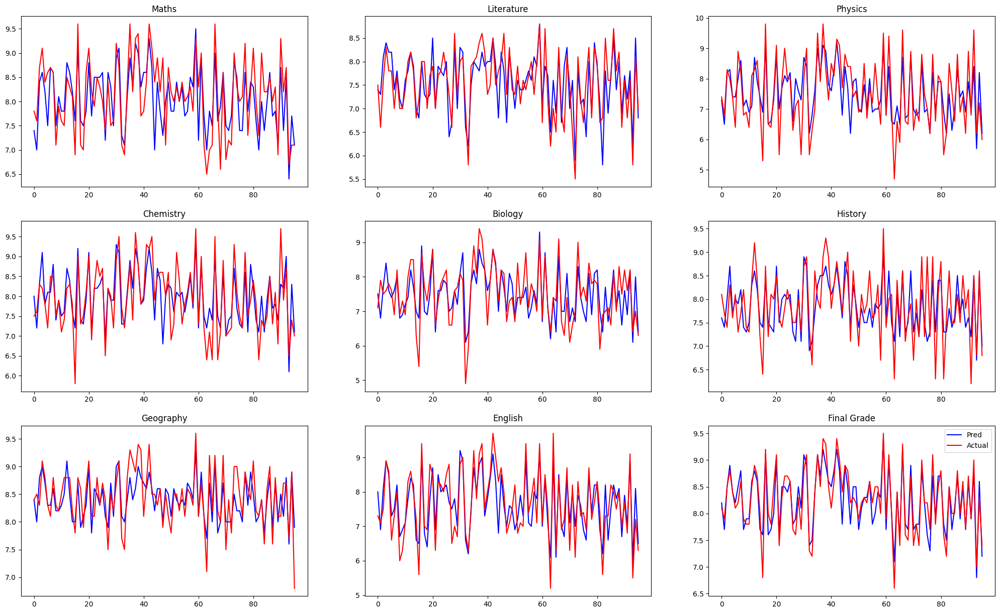

In [ ]:
draw(resultET)

In [ ]:
Accuracy(resultET)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.428125,5.348647,0.281146,0.530232,94.651353
1,Literature,0.354167,4.809637,0.204583,0.452309,95.190363
2,Physics,0.545833,7.564452,0.496458,0.704598,92.435548
3,Chemistry,0.387500,5.030062,0.277708,0.526980,94.969938
4,Biology,0.432292,5.976425,0.294479,0.542659,94.023575
5,History,0.397917,5.145160,0.249792,0.499792,94.854840
6,Geography,0.262500,3.135614,0.113125,0.336341,96.864386
7,English,0.418750,5.677845,0.267917,0.517607,94.322155
8,Grade,0.195833,2.423427,0.062500,0.250000,97.576573


In [ ]:
predModel(ypredET)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,7.4,7.4,7.3,8.0,7.5,7.6,8.4,8.0,8.2,22.7,22.7,22.9,23.4,22.8,C00,Giỏi
1,7.0,7.3,6.5,7.2,6.8,7.4,8.0,6.9,7.7,20.7,20.4,21.0,22.7,21.2,C00,Khá
2,8.4,8.1,8.2,8.3,7.7,8.0,8.8,8.1,8.5,24.9,24.7,24.4,24.9,24.6,A00/C00,Giỏi
3,8.6,8.4,8.3,9.1,8.4,8.7,9.0,8.9,8.9,26.0,25.8,26.1,26.1,25.9,B00/C00,Giỏi
4,8.2,8.2,7.4,7.8,7.6,7.7,8.7,8.5,8.4,23.4,24.1,23.6,24.6,24.9,D00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,7.4,7.2,6.9,8.2,6.9,7.2,8.1,7.0,7.9,22.5,21.3,22.5,22.5,21.6,A00/B00/C00,Khá
92,8.5,7.8,8.4,9.0,8.2,8.5,8.8,8.9,8.8,25.9,25.8,25.7,25.1,25.2,A00,Giỏi
93,6.4,6.2,5.7,6.1,6.1,6.7,7.6,6.0,6.8,18.2,18.1,18.6,20.5,18.6,C00,Trung bình khá
94,7.7,8.5,8.2,8.3,8.0,8.5,8.9,8.1,8.6,24.2,24.0,24.0,25.9,24.3,C00,Giỏi


# Dummy Regressor

In [ ]:
from sklearn.dummy import DummyRegressor

modelDummyGrade = DummyRegressor(strategy="mean").fit(xtrain, ytrainGrade)
modelDummyMaths = DummyRegressor(strategy="mean").fit(xtrain, ytrainMaths)
modelDummyLiterature = DummyRegressor(strategy="mean").fit(xtrain, ytrainLiterature)
modelDummyPhysics = DummyRegressor(strategy="mean").fit(xtrain, ytrainPhysics)
modelDummyChemistry = DummyRegressor(strategy="mean").fit(xtrain, ytrainChemistry)
modelDummyBiology = DummyRegressor(strategy="mean").fit(xtrain, ytrainBiology)
modelDummyHistory = DummyRegressor(strategy="mean").fit(xtrain, ytrainHistory)
modelDummyGeography = DummyRegressor(strategy="mean").fit(xtrain, ytrainGeography)
modelDummyEnglish = DummyRegressor(strategy="mean").fit(xtrain, ytrainEnglish)
# modelDummyCivic = DummyRegressor(strategy="mean").fit(xtrain, xtestCivic)

ypredDummyGrade = modelDummyGrade.predict(xtest).round(1)
ypredDummyMaths = modelDummyMaths.predict(xtest).round(1)
ypredDummyLiterature = modelDummyLiterature.predict(xtest).round(1)
ypredDummyPhysics = modelDummyPhysics.predict(xtest).round(1)
ypredDummyChemistry = modelDummyChemistry.predict(xtest).round(1)
ypredDummyBiology = modelDummyBiology.predict(xtest).round(1)
ypredDummyHistory = modelDummyHistory.predict(xtest).round(1)
ypredDummyGeography = modelDummyGeography.predict(xtest).round(1)
ypredDummyEnglish = modelDummyEnglish.predict(xtest).round(1)
# ypredDummyCivic = modelDummyCivic.predict(ytrain).round(1)

modelDummy = [modelDummyGrade, modelDummyMaths, modelDummyLiterature, modelDummyPhysics, modelDummyChemistry,
            modelDummyBiology, modelDummyHistory, modelDummyGeography, modelDummyEnglish] # modelDummyCivic

ypredDummy = [ypredDummyGrade, ypredDummyMaths, ypredDummyLiterature, ypredDummyPhysics, ypredDummyChemistry,
         ypredDummyBiology, ypredDummyHistory, ypredDummyGeography, ypredDummyEnglish] #ypredDummyCivic

In [ ]:
ypredDummy[0].shape

(96,)

In [ ]:
resultDummy = result(ytest, ypredDummy)
resultDummy

,Maths,Maths_pred,Literature,Literature_pred,Physics,Physics_pred,Chemistry,Chemistry_pred,Biology,Biology_pred,History,History_pred,Geography,Geography_pred,English,English_pred,Grade,Grade_pred
0,7.8,8.0,7.5,7.5,7.4,7.3,7.5,7.8,7.1,7.4,8.1,7.8,8.4,8.4,7.3,7.5,8.1,8.2
1,7.6,8.0,6.6,7.5,6.8,7.3,7.6,7.8,7.9,7.4,7.7,7.8,8.5,8.4,7.1,7.5,7.9,8.2
2,8.7,8.0,7.6,7.5,8.3,7.3,8.3,7.8,7.5,7.4,7.4,7.8,8.3,8.4,7.5,7.5,8.5,8.2
3,9.1,8.0,8.3,7.5,8.0,7.3,8.2,7.8,7.6,7.4,8.3,7.8,9.1,8.4,8.9,7.5,8.8,8.2
4,8.4,8.0,7.8,7.5,7.4,7.3,7.8,7.8,7.8,7.4,7.6,7.8,8.8,8.4,8.6,7.5,8.4,8.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.2,8.0,6.8,7.5,6.8,7.3,7.9,7.8,7.6,7.4,6.2,7.8,8.7,8.4,6.8,7.5,7.9,8.2
92,8.7,8.0,7.6,7.5,9.6,7.3,8.7,7.8,8.2,7.4,8.5,7.8,8.7,8.4,9.1,7.5,9.0,8.2
93,6.7,8.0,5.8,7.5,6.2,7.3,6.5,7.8,6.4,7.4,6.8,7.8,7.7,8.4,5.5,7.5,7.0,8.2
94,7.1,8.0,8.1,7.5,7.2,7.3,7.4,7.8,7.0,7.4,8.6,7.8,8.9,8.4,7.2,7.5,8.3,8.2


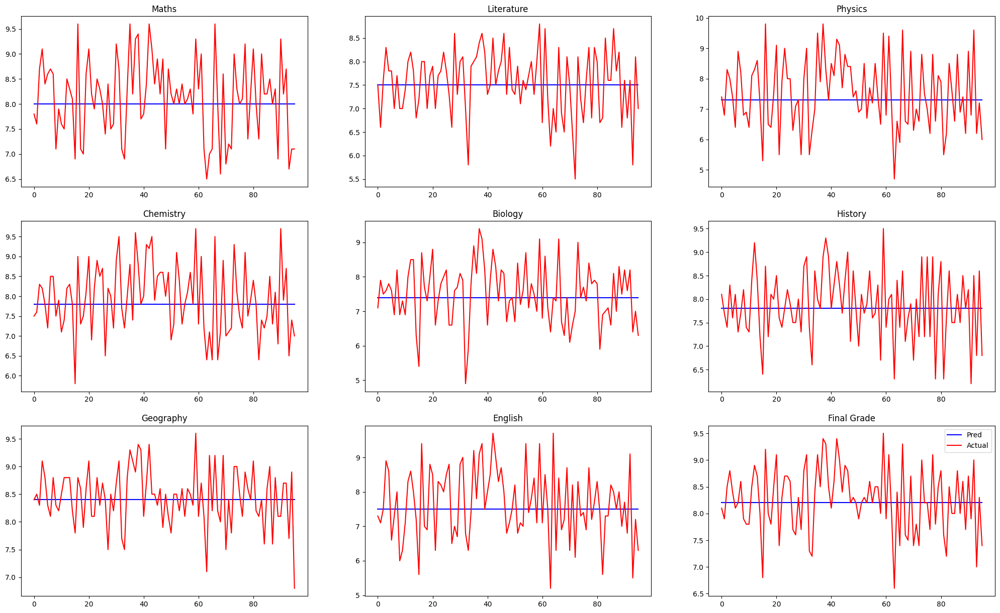

In [ ]:
draw(resultDummy)

In [ ]:
Accuracy(resultDummy)

,Subject,MAE,MAPE (%),MSE,RMSE,Accuracy (%)
0,Maths,0.644792,7.986237,0.620521,0.787731,92.013763
1,Literature,0.562500,7.674907,0.472917,0.687689,92.325093
2,Physics,0.975000,13.062777,1.392708,1.180131,86.937223
3,Chemistry,0.719792,9.056907,0.771354,0.878268,90.943093
4,Biology,0.692708,9.407193,0.745937,0.863677,90.592807
5,History,0.594792,7.658111,0.536146,0.732220,92.341889
6,Geography,0.410417,4.903456,0.267917,0.517607,95.096544
7,English,0.839583,11.090822,1.047917,1.023678,88.909178
8,Grade,0.494792,6.041061,0.374063,0.611606,93.958939


In [ ]:
predModel(ypredDummy)

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực
0,8.0,7.5,7.3,7.8,7.4,7.8,8.4,7.5,8.2,23.1,22.8,23.2,23.7,23.0,C00,Giỏi
1,8.0,7.5,7.3,7.8,7.4,7.8,8.4,7.5,8.2,23.1,22.8,23.2,23.7,23.0,C00,Giỏi
2,8.0,7.5,7.3,7.8,7.4,7.8,8.4,7.5,8.2,23.1,22.8,23.2,23.7,23.0,C00,Giỏi
3,8.0,7.5,7.3,7.8,7.4,7.8,8.4,7.5,8.2,23.1,22.8,23.2,23.7,23.0,C00,Giỏi
4,8.0,7.5,7.3,7.8,7.4,7.8,8.4,7.5,8.2,23.1,22.8,23.2,23.7,23.0,C00,Giỏi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,8.0,7.5,7.3,7.8,7.4,7.8,8.4,7.5,8.2,23.1,22.8,23.2,23.7,23.0,C00,Giỏi
92,8.0,7.5,7.3,7.8,7.4,7.8,8.4,7.5,8.2,23.1,22.8,23.2,23.7,23.0,C00,Giỏi
93,8.0,7.5,7.3,7.8,7.4,7.8,8.4,7.5,8.2,23.1,22.8,23.2,23.7,23.0,C00,Giỏi
94,8.0,7.5,7.3,7.8,7.4,7.8,8.4,7.5,8.2,23.1,22.8,23.2,23.7,23.0,C00,Giỏi


# Final

In [ ]:
#chỗ này có tác dụng như lấy ra một mẫu thử ( điểm 4 học kỳ ) để dự đoán thử và cho kết quả
Test = np.array([df.iloc[-5, :32]]).reshape(1, -1) #lấy ra số điểm của 4 học kỳ lớp 10-11 từ dataframe
ActualVal= df.iloc[-5, 32:] #lấy điểm thực tế của các môn học ( điểm số cần dự đoán, y test) tương ứng với 8 cột cuối cùng trong bảng bên dưới
Actual = pd.DataFrame({ #gán các điểm thực tế nêu trên vào biến Actual
    'Toán': ActualVal[0], #giá trị điểm toán trong thực tế mà ta phải dự đoán
    'Văn': ActualVal[1],
    'Lý': ActualVal[2],
    'Hoá': ActualVal[3],
    'Sinh': ActualVal[4],
    'Sử': ActualVal[5],
    'Địa': ActualVal[6],
    'Anh': ActualVal[7],
    'Tổng kết': ActualVal[8],
    'A00': pd.Series(ActualVal[0] + ActualVal[2] + ActualVal[3]), #tính điểm khối A00 theo điểm thực tế
    'A01': pd.Series(ActualVal[0] + ActualVal[2] + ActualVal[7]),
    'B00': pd.Series(ActualVal[0] + ActualVal[3] + ActualVal[4]),
    'C00': pd.Series(ActualVal[1] + ActualVal[5] + ActualVal[6]),
    'D00': pd.Series(ActualVal[0] + ActualVal[1] + ActualVal[7]),
  })
ChonKhoi(Actual)
Actual['Accuracy (%)'] = 100
Actual = Actual.set_index([pd.Index(['Actual'])])

In [ ]:
df

,Maths_1_10_19_20,Literature_1_10_19_20,Physics_1_10_19_20,Chemistry_1_10_19_20,Biology_1_10_19_20,History_1_10_19_20,Geography_1_10_19_20,English_1_10_19_20,Maths_2_10_19_20,Literature_2_10_19_20,...,English_2_11_20_21,Maths,Literature,Physics,Chemistry,Biology,History,Geography,English,Final grade
0,5.3,6.1,5.6,6.7,6.8,4.7,7.5,7.4,5.6,6.6,...,8.4,7.4,7.6,6.8,7.4,7.9,7.5,9.1,8.0,8.2
1,8.6,7.3,8.3,8.5,8.3,7.6,8.1,8.4,9.1,8.2,...,8.9,9.0,7.4,8.6,8.5,7.6,8.1,8.6,8.9,8.6
2,5.5,6.1,6.5,6.1,5.5,5.6,7.8,5.2,6.0,6.0,...,7.3,7.6,6.8,8.0,8.3,7.0,6.8,8.1,7.6,8.0
3,5.2,7.2,5.7,5.6,4.4,5.7,7.3,6.5,5.5,6.3,...,7.9,9.0,7.9,8.3,8.6,7.8,7.7,8.8,8.7,8.6
4,5.8,6.3,5.3,4.8,6.1,6.5,7.0,4.8,6.3,6.7,...,5.9,7.6,7.2,6.1,7.3,7.1,7.2,8.4,6.3,7.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,4.5,5.5,6.3,6.0,5.6,4.3,6.6,5.8,4.9,5.9,...,6.9,8.2,6.8,6.8,7.9,7.6,6.2,8.7,6.8,7.9
472,6.8,7.3,8.9,8.7,8.0,7.6,8.6,8.3,8.5,7.9,...,9.1,8.7,7.6,9.6,8.7,8.2,8.5,8.7,9.1,9.0
473,4.5,5.2,4.9,5.4,4.1,4.1,4.6,4.8,4.4,6.1,...,7.1,6.7,5.8,6.2,6.5,6.4,6.8,7.7,5.5,7.0
474,6.3,7.9,7.6,8.3,7.3,8.1,8.1,6.8,5.8,8.6,...,9.0,7.1,8.1,7.2,7.4,7.0,8.6,8.9,7.2,8.3


In [ ]:
# hiển thị kết quả dự đoán tương ứng với từng model: các cột về môn học, tổng kết, chọn khối trong bảng kq bên dưới
LR = predhandle(modelLR, Test)
KNN = predhandle(modelKNN, Test)
DT = predhandle(modelDT, Test)
SVM = predhandle(modelSVM, Test)
Lasso = predhandle(modelLasso, Test)
BayesianRidge = predhandle(modelBayesianRidge, Test)
RF = predhandle(modelRF, Test)
MLP = predhandle(modelMLP, Test)
ElasticNet = predhandle(modelElasticNet, Test)
Poly = predhandle(modelPoly, Test)
SGD = predhandle(modelSGD, Test)
Huber = predhandle(modelHuber, Test)
Lars = predhandle(modelLars, Test)
Ridge = predhandle(modelRidge, Test)
TheilSen = predhandle(modelTheilSen, Test)
KernelRidge = predhandle(modelKernelRidge, Test)
NuSVR = predhandle(modelNuSVR, Test)
LinearSVR = predhandle(modelLinearSVR, Test)
Ada = predhandle(modelAdaBoost, Test)
GradientBoosting = predhandle(modelGradientBoosting, Test)
ARD = predhandle(modelARD, Test)
Poisson = predhandle(modelPoisson, Test)
Tweedie = predhandle(modelTweedie, Test)
Gamma = predhandle(modelGamma, Test)
OMP = predhandle(modelOMP, Test)
Quantile = predhandle(modelQuantile, Test)
RANSAC = predhandle(modelRANSAC, Test)
PAR = predhandle(modelPAR, Test)
ET = predhandle(modelET, Test)
Dummy = predhandle(modelDummy, Test)

AccuracyLR = Accuracy(resultLR)['Accuracy (%)'].mean().round(5) #từ độ chính xác của từng môn tính trung bình cộng để cho ra độ chính xác của model, ứng với cột Accuracy trong bảng kq bên dưới
AccuracyKNN = Accuracy(resultKNN)['Accuracy (%)'].mean().round(5)
AccuracyDT = Accuracy(resultDT)['Accuracy (%)'].mean().round(5)
AccuracySVM = Accuracy(resultSVM)['Accuracy (%)'].mean().round(5)
AccuracyLasso = Accuracy(resultLasso)['Accuracy (%)'].mean().round(5)
AccuracyBayesianRidge = Accuracy(resultBayesianRidge)['Accuracy (%)'].mean().round(5)
AccuracyRF = Accuracy(resultRF)['Accuracy (%)'].mean().round(5)
AccuracyMLP = Accuracy(resultMLP)['Accuracy (%)'].mean().round(5)
AccuracyElasticNet = Accuracy(resultElasticNet)['Accuracy (%)'].mean().round(5)
AccuracyPoly = Accuracy(resultPoly)['Accuracy (%)'].mean().round(5)
AccuracySGD = Accuracy(resultSGD)['Accuracy (%)'].mean().round(5)
AccuracyHuber = Accuracy(resultHuber)['Accuracy (%)'].mean().round(5)
AccuracyLars = Accuracy(resultLars)['Accuracy (%)'].mean().round(5)
AccuracyRidge = Accuracy(resultRidge)['Accuracy (%)'].mean().round(5)
AccuracyKernelRidge = Accuracy(resultKernelRidge)['Accuracy (%)'].mean().round(5)
AccuracyTheilSen = Accuracy(resultTheilSen)['Accuracy (%)'].mean().round(5)
AccuracyNuSVR = Accuracy(resultNuSVR)['Accuracy (%)'].mean().round(5)
AccuracyLinearSVR = Accuracy(resultLinearSVR)['Accuracy (%)'].mean().round(5)
AccuracyAda = Accuracy(resultAdaBoost)['Accuracy (%)'].mean().round(5)
AccuracyGradientBoosting = Accuracy(resultGradientBoosting)['Accuracy (%)'].mean().round(5)
AccuracyARD = Accuracy(resultARD)['Accuracy (%)'].mean().round(5)
AccuracyPoisson = Accuracy(resultPoisson)['Accuracy (%)'].mean().round(5)
AccuracyTweedie = Accuracy(resultTweedie)['Accuracy (%)'].mean().round(5)
AccuracyGamma = Accuracy(resultGamma)['Accuracy (%)'].mean().round(5)
AccuracyOMP = Accuracy(resultOMP)['Accuracy (%)'].mean().round(5)
AccuracyQuantile = Accuracy(resultQuantile)['Accuracy (%)'].mean().round(5)
AccuracyRANSAC = Accuracy(resultRANSAC)['Accuracy (%)'].mean().round(5)
AccuracyPAR = Accuracy(resultPAR)['Accuracy (%)'].mean().round(5)
AccuracyET = Accuracy(resultET)['Accuracy (%)'].mean().round(5)
AccuracyDummy = Accuracy(resultDummy)['Accuracy (%)'].mean().round(5)

df_predhandle = pd.concat([LR, KNN, DT, SVM, Lasso, BayesianRidge, RF, MLP, ElasticNet,
                           Poly, SGD, Huber, Lars, Ridge, TheilSen, Ridge, NuSVR, LinearSVR,
                           Ada, GradientBoosting, ARD, Poisson, Tweedie, Gamma, OMP, Quantile,
                           RANSAC, PAR, ET, Dummy], ignore_index=True)
df_predhandle = df_predhandle.set_index([pd.Index([ #danh sách các model tương ứng cột đầu tiên trong bảng kq bên dưới
    'Linear Regression', 'K-Nearest Neighbors (KNN)', 'Decision Tree', 'Support Vector Machine (SVM)', 'Lasso Regression',
    'Bayesian Ridge Regression', 'Random Forest', 'Multi-layer Perceptron (MLP)', 'ElasticNet', 'Polynomial Regression',
    'Stochastic Gradient Descent (SGD)', 'Huber Regression', 'Least Angle Regression (Lars)', 'Ridge Regression', 'TheilSen Regression',
    'KernelRidge Regression', 'NuSVR', 'LinearSVR', 'AdaBoost', 'Gradient Boosting', 'ARD Regression', 'Poisson', 'Tweedie', 'Gamma',
    'Cross-validated Orthogonal Matching Pursuit (OMP)', 'Quantile', 'RANSAC', 'Passive Aggressive Regressor (PAR)',
    'Extra Tree Regressor', 'Dummy Regressor'])])
df_predhandle['Accuracy (%)'] = [AccuracyLR, AccuracyKNN, AccuracyDT, AccuracySVM, AccuracyLasso, AccuracyBayesianRidge,
                                 AccuracyRF, AccuracyMLP, AccuracyElasticNet, AccuracyPoly, AccuracySGD, AccuracyHuber,
                                 AccuracyLars, AccuracyRidge, AccuracyTheilSen, AccuracyKernelRidge, AccuracyNuSVR,
                                 AccuracyLinearSVR, AccuracyAda, AccuracyGradientBoosting, AccuracyARD, AccuracyPoisson,
                                 AccuracyTweedie, AccuracyGamma, AccuracyOMP, AccuracyQuantile, AccuracyRANSAC,
                                 AccuracyPAR, AccuracyET, AccuracyDummy]
df_predhandle = pd.concat([Actual, df_predhandle])

df_predhandle = df_predhandle.sort_values(by=['Accuracy (%)'], ascending=False)
df_predhandle[:] = df_predhandle[:].round(1)
df_predhandle

,Toán,Văn,Lý,Hoá,Sinh,Sử,Địa,Anh,Tổng kết,A00,A01,B00,C00,D00,Khối,Học lực,Accuracy (%)
Actual,8.2,6.8,6.8,7.9,7.6,6.2,8.7,6.8,7.9,22.9,21.8,23.7,21.7,21.8,B00,Khá,100.0
Poisson,7.7,6.9,7.1,7.9,6.8,7.1,8.0,7.0,7.8,22.7,21.8,22.4,22.0,21.6,A00,Khá,95.4
ARD Regression,7.7,6.8,7.3,8.0,6.9,7.1,8.1,7.0,7.9,23.0,22.0,22.6,22.0,21.5,A00,Khá,95.4
Bayesian Ridge Regression,7.7,6.9,7.1,7.8,6.9,7.2,8.1,7.0,7.8,22.6,21.8,22.4,22.2,21.6,A00,Khá,95.4
Ridge Regression,7.7,6.8,7.1,7.9,6.8,7.1,8.0,7.0,7.8,22.7,21.8,22.4,21.9,21.5,A00,Khá,95.4
Stochastic Gradient Descent (SGD),7.7,6.8,7.2,7.9,6.8,7.1,8.0,7.1,7.7,22.8,22.0,22.4,21.9,21.6,A00,Khá,95.4
Linear Regression,7.7,6.8,7.1,7.9,6.7,7.1,8.0,7.0,7.8,22.7,21.8,22.3,21.9,21.5,A00,Khá,95.4
Gamma,7.7,7.0,7.0,7.7,7.0,7.3,8.1,7.0,7.9,22.4,21.7,22.4,22.4,21.7,A00/B00/C00,Khá,95.4
Tweedie,7.7,7.0,7.0,7.7,7.0,7.3,8.1,7.0,7.9,22.4,21.7,22.4,22.4,21.7,A00/B00/C00,Khá,95.4
TheilSen Regression,7.6,6.8,7.3,8.0,6.7,7.0,8.0,7.0,7.8,22.9,21.9,22.3,21.8,21.4,A00,Khá,95.4


In [ ]:
df_predhandle.to_csv("/content/drive/MyDrive/NCKH_Review of Student's Performance/Models/Predict.csv")#lưu dữ liệu

# Save trained model

In [ ]:
import pickle

In [ ]:
with open('LinearRegressionModel.pkl','wb') as file: #save
  pickle.dump(modelLR,file)


In [ ]:
with open('LinearRegressionModel.pkl','rb') as file: #load
  clf = pickle.load(file)
predictGrade = clf.modelLRGrade.predict(???).round(1) #predict grade
predictMaths= clf.modelLRMaths.predict(???).round(1)
predict = [predictGrade,predictMaths] #gom lại
